### Merged Notebooks containing all the factor calculations of team Psychic-Pandas

* SJSU ID - 010816832
* VIDYA COIMBATORE NAND KUMAR
* Alternus Vera Assignment

## **Analyse Influence of several factors on Fake news (Alternus Vera)

* The aim of the project is to develop a strategy to help identify fake news from real news and understand the influence of Controversy and other factors. 
* The subject of fake news became popular in connection with the recent US presidential elections and with possible Russian meddling into elections in the US, France, and Germany. 
* The project uses LIAR - LIAR dataset.


We identified several factors that could contribute to fake news detection, by analysing the dataset.
Key factors identified are:
* Political affiliation
* Sensationalism
* Controversy Analysis
* Topic features 
* Post/Social media activities based: People express their emotions or opinions towards fake news through social media posts.
* Visual based: Fake news detection based on images and video links features in the dataset.
* Linguistic based: Fake news detection based on Sensationalism and writing style (features: Article title and text)
* Reliable source: Fake news detection based on the source of the article.
* Sentiment Analysis
* Authenticity: Fake news includes false information that can be verified as such.

## ** Feature - Controversy 
#### Analyse Influence of Controversy on Fake news dataset (Alternus Vera)


Controversial content can be defined as any contentious matter or argument that may spark public debate. The approach is motivated by several factors. First, news is a significant part of our everyday lives. It shapes our beliefs and opinions on how we see the world and now more than ever people rely on a variety of online resources for their news. 


Therefore, the aim is to identify the potential of using single keywords to detect controversial content or topics that will influence fake news by applying Distillation process and multi-label classifiers.

Distillation
* LDA, LSA, TF-Idf, Doc2vec gensim models and sentiment analysis methods.

* Scoring Component: To detect the posts that cast controversy on the article and score the controversy level.
* Ranking Component: Ranked the articles based on the controversy scores of each statement.




In [265]:
import os
import pickle
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from collections import Counter
import nltk
from nltk.tokenize import RegexpTokenizer
import re
import nltk
from nltk.stem import SnowballStemmer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree

from sklearn.metrics import confusion_matrix,classification_report
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from sklearn.datasets import load_wine
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from graphviz import Digraph
from collections import OrderedDict
import seaborn as sns
sns.set_style("darkgrid")

import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
path_train='train.tsv'
path_test='test.tsv'
path_valid='valid.tsv'
path_controversy_vocab = 'controversy_vocabulary.csv'




## Loading Training, Test and Validation data

In [266]:
train_data = pd.read_csv(path_train, sep='\t', header = None)
test_data = pd.read_csv(path_test, sep='\t', header = None)
valid_data = pd.read_csv(path_valid, sep='\t', header = None)

contro_vocab_data = pd.read_csv(path_controversy_vocab)
contro_vocab_data.head()
columns = ['id', 'label', 'statement', 'subjects', 'speaker',
         'speaker_job', 'state', 'party', 'barely_true_counts',
         'false_counts', 'half_true_counts', 'mostly_true_counts', 'pants_on_fire_counts',
         'context']
train_data.columns = columns
test_data.columns = columns
valid_data.columns = columns


#### Adding text length to training set

In [267]:
train_data['text-length'] = train_data['statement'].apply(len)
#train_data.head()

## Visualizing the dataset 

### Distribution of classes based on labels - Train ,Test and Validation datasets

In [268]:
train_data.subjects.unique()

array(['abortion', 'energy,history,job-accomplishments', 'foreign-policy',
       ..., 'animals,elections', 'retirement,social-security',
       'florida,foreign-policy'], dtype=object)

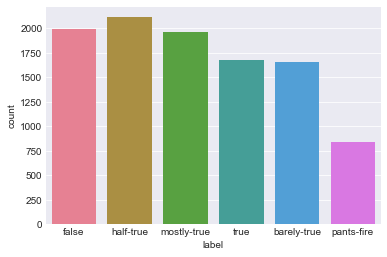

In [269]:
sb.countplot(x='label', data=train_data, palette='husl')

* Here, we see that the number of articles per class is roughly balanced, which is helpful!

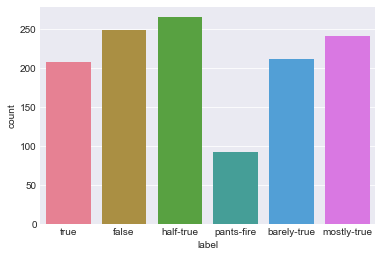

In [270]:
sb.countplot(x='label', data=test_data, palette='husl')

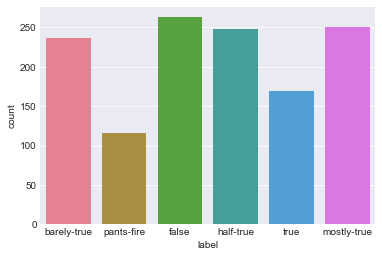

In [271]:
sb.countplot(x='label', data=valid_data, palette='husl')

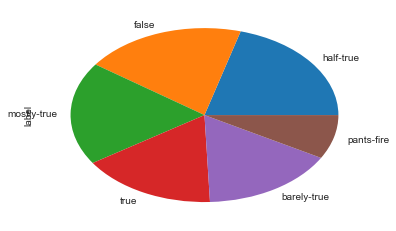

In [272]:
%matplotlib inline
train_data['label'].value_counts().plot(kind="pie")

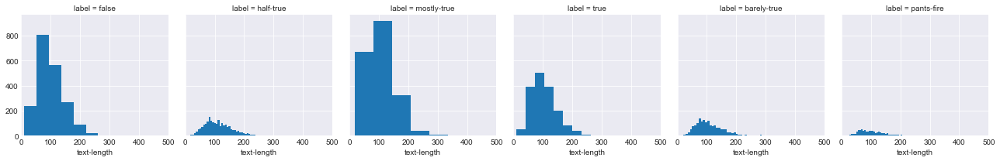

In [273]:
g = sns.FacetGrid(data=train_data, col='label')
for i, ax in enumerate(g.axes.flat): # set every-other axis for testing purposes
       ax.set_xlim(0,500)
g.map(plt.hist, 'text-length', bins=50)


* Seems like overall, the distribution of text length is similar across all labels. However, the number of text length seems to be skewed a lot higher for false and mostly-true labels. 

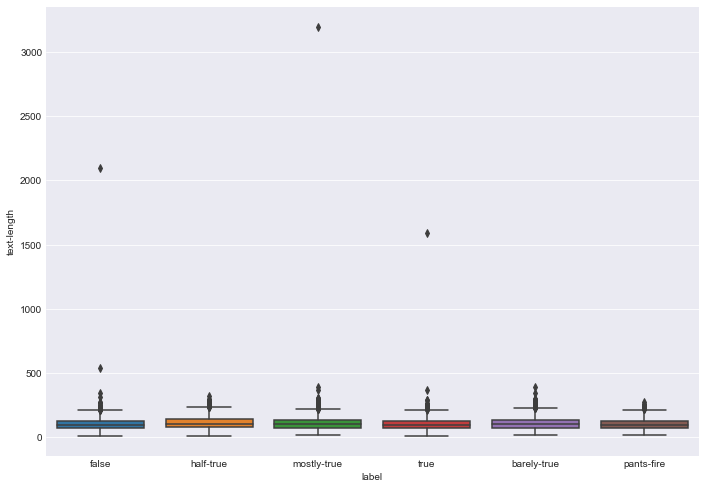

In [274]:
a4_dims = (11.7, 8.27)
f, ax = plt.subplots(figsize=a4_dims)
sns.set_style("whitegrid")
sns.boxplot(x='label', y='text-length', data=train_data)

#### From the plot I  inferred that 'false' 'mostly-true' and 'true' have much longer text, but there are many outliers too which can be seen as points above the boxes

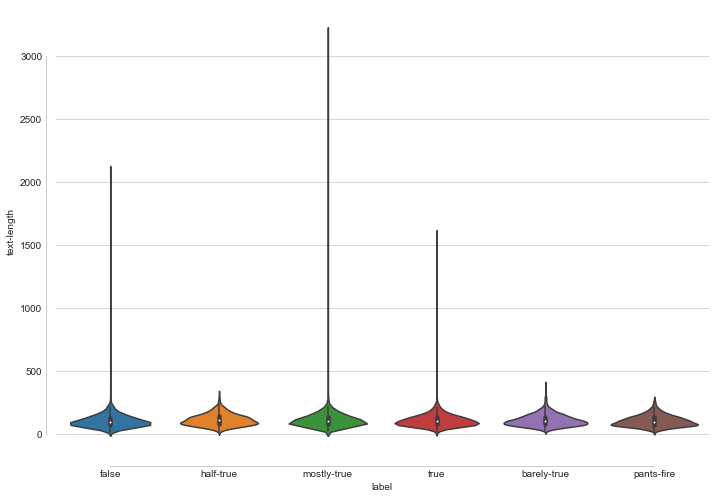

In [275]:
a4_dims = (11.7, 8.27)
f, ax = plt.subplots(figsize=a4_dims)
sns.violinplot(x='label', y='text-length', data=train_data)
sns.despine(offset=10, trim=True);

In [276]:
train_data.describe()

,barely_true_counts,false_counts,half_true_counts,mostly_true_counts,pants_on_fire_counts,text-length
count,10238.000000,10238.000000,10238.000000,10238.000000,10238.000000,10240.000000
mean,11.533210,13.286482,17.133718,16.434265,6.201407,106.918750
std,18.973764,24.112936,35.846511,36.151688,16.128927,59.917722
min,0.000000,0.000000,0.000000,0.000000,0.000000,11.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,73.000000
50%,2.000000,2.000000,3.000000,3.000000,1.000000,99.000000
75%,12.000000,12.000000,13.000000,11.000000,5.000000,132.250000
max,70.000000,114.000000,160.000000,163.000000,105.000000,3192.000000


In [277]:
labels = train_data.groupby('label').mean()
labels.corr()

,barely_true_counts,false_counts,half_true_counts,mostly_true_counts,pants_on_fire_counts,text-length
barely_true_counts,1.000000,-0.127664,0.305618,0.283077,-0.348281,0.520355
false_counts,-0.127664,1.000000,-0.823283,-0.851132,0.925060,-0.731996
half_true_counts,0.305618,-0.823283,1.000000,0.983699,-0.851951,0.740105
mostly_true_counts,0.283077,-0.851132,0.983699,1.000000,-0.875937,0.696002
pants_on_fire_counts,-0.348281,0.925060,-0.851951,-0.875937,1.000000,-0.645328
text-length,0.520355,-0.731996,0.740105,0.696002,-0.645328,1.000000


### Feature selection or attribute evaluator consists of identifying the relevant features and ignoring the irrelevant ones from a dataset. The use of attribute evaluator methods enhances the performance of machine learning algorithms. Visualizing Correlation heatmap helps in better correlation-based feature selection

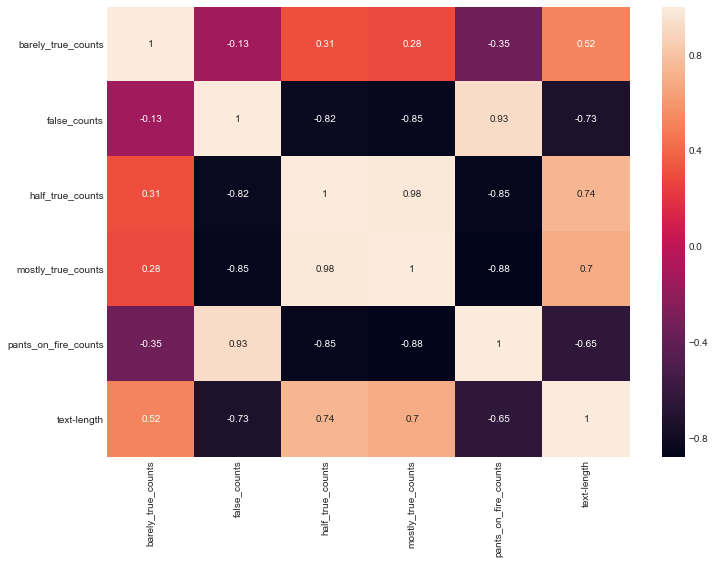

In [278]:
from matplotlib import pyplot
a4_dims = (11.7, 8.27)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax,data=labels.corr(), annot=True)


* Looking at the map, false is strongly correlated with pants_on_fire, and mostly_true seems strongly correlated with half_true. There is also a negative correlation between false_counts and the other features.

### Visualizing mostly used words corresponding to True, False, barely-true, mostly-true, half-true, pants-fire labels

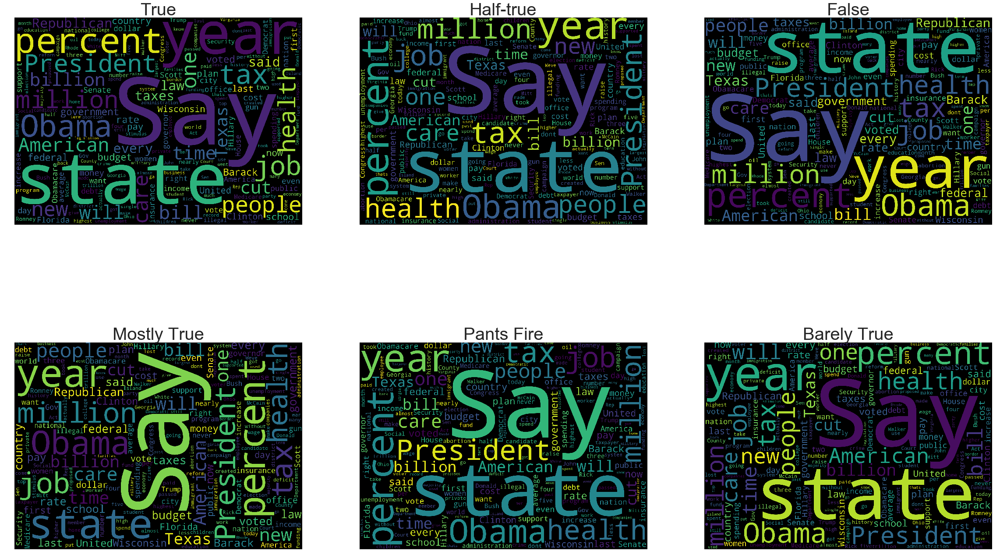

In [279]:
from wordcloud import WordCloud,STOPWORDS
plt.figure(figsize=(40,25))
# true
subset = train_data[train_data.label==True]
text = train_data['statement']
cloud_true = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))


plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("True",fontsize=40)
plt.imshow(cloud_true)

# true
subset = train_data[train_data.label=='half-true']
text = train_data['statement']
cloud_half_true = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 2)
plt.axis('off')
plt.title("Half-true",fontsize=40)
plt.imshow(cloud_half_true)



# false
subset = train_data[train_data.label=='false']
text = train_data['statement']
cloud_false = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 3)
plt.axis('off')
plt.title("False",fontsize=40)
plt.imshow(cloud_false)



# mostly-true
subset = train_data[train_data.label=='mostly-true']
text = train_data['statement']
cloud_mostly_true = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 4)
plt.axis('off')
plt.title("Mostly True",fontsize=40)
plt.imshow(cloud_mostly_true)

#pants-fire
subset = train_data[train_data.label=='pants-fire']
text = train_data['statement']
cloud_pants_fire = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 5)
plt.axis('off')
plt.title("Pants Fire",fontsize=40)
plt.imshow(cloud_pants_fire)


#barely-true
subset = train_data[train_data.label=='barely-true']
text = train_data['statement']
cloud_barely_true = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 6)
plt.axis('off')
plt.title("Barely True",fontsize=40)
plt.imshow(cloud_barely_true)

### An important set of metrics in text mining relates to the frequency of words or token in a certain corpus of text documents. 
* Following is the frequency distribution (list) of most frequently used words among the statements in traning data set

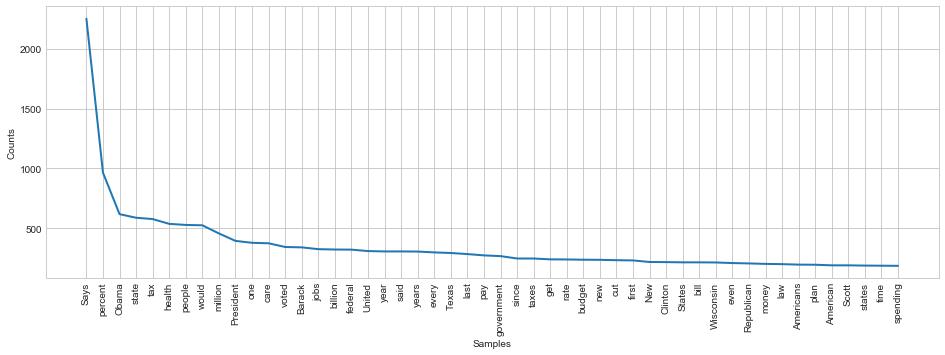

In [280]:
from collections import defaultdict
from nltk.corpus import stopwords
import pandas as pd

stop_words = stopwords.words('english')


word_list=[]
word_freq = defaultdict(int)

for text in train_data.statement:
    for word in text.split():
        if word.lower() not in stop_words and word.isalpha():
            word_list.append(word)
            word_freq[word] += 1

pd.DataFrame.from_dict(word_freq, orient='index') \
.sort_values(0, ascending=False) \
.rename(columns={0: 'abs_freq'})

freqdist = nltk.FreqDist(word_list)
plt.figure(figsize=(16,5))
freqdist.plot(50)


* The words 'Says','percent','Obama' are frequently used

## Forming Vocabulary of Controversial words

 * Using a four-point scale to classify 200 high-frequency terms analysed from 
   * https://wpcurve.com/words-that-trigger-emotional-responses/
   * https://www.scribd.com/doc/82701103/Analyst-Desktop-Binder-REDACTED
   * https://arxiv.org/pdf/1409.8152.pdf

Indicate based on threshold if sentence is -
* Strongly Controversial: 
* Somewhat Controversial:
* Less Controversial
* Non-Controversial: 

In [281]:
vocab_doc = ["abuse administration afghanistan aid america american army attack attacks authorities authority ban banks benefits bill border budget campaign candidate candidates catholic china chinese church concerns congress conservative control country court crime criminal crisis cuts debate debt defense deficit democrats disease dollar drug drugs economy education egypt election elections enforcement fighting finance fiscal force funding gas government gun health immigration inaccuracies india insurance investigation investigators iran israel job jobs judge justice killing korea labor land law lawmakers laws lawsuit leadership legislation marriage media mexico military money murder nation nations news obama offensive officials oil parties peace police policies policy politics poll power president prices primary prison progress race reform republican republicans restrictions rule rules ruling russia russian school security senate sex shooting society spending strategy strike support syria syrian tax taxes threat trial unemployment union usa victim violence vote voters war washington weapons world account advantage amount attorney chairman charge charges cities class comment companies cost credit delays effect expectations families family february germany goal housing information investment markets numbers oklahoma parents patients population price projects raise rate reason sales schools sector shot source sources status stock store whether worth"]

### To further analyze our dataset, we need to transform each article's text to a feature vector or word embedding


# Data pre-processing 
* Check for missing or null values
* Lowercase
* Tokenize
* Remove stop words, punctuations and special characters
* Stem


### Categorize label column

In [282]:
train_data['label_id'] = train_data['label'].factorize()[0]

In [283]:
train_data.isnull().sum()

id                         0
label                      0
statement                  0
subjects                   2
speaker                    2
speaker_job             2897
state                   2208
party                      2
barely_true_counts         2
false_counts               2
half_true_counts           2
mostly_true_counts         2
pants_on_fire_counts       2
context                  102
text-length                0
label_id                   0
dtype: int64

In [284]:
train_data.info()
    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10240 entries, 0 to 10239
Data columns (total 16 columns):
id                      10240 non-null object
label                   10240 non-null object
statement               10240 non-null object
subjects                10238 non-null object
speaker                 10238 non-null object
speaker_job             7343 non-null object
state                   8032 non-null object
party                   10238 non-null object
barely_true_counts      10238 non-null float64
false_counts            10238 non-null float64
half_true_counts        10238 non-null float64
mostly_true_counts      10238 non-null float64
pants_on_fire_counts    10238 non-null float64
context                 10138 non-null object
text-length             10240 non-null int64
label_id                10240 non-null int64
dtypes: float64(5), int64(2), object(9)
memory usage: 1.3+ MB


In [285]:
test_data.isnull().sum()

id                        0
label                     0
statement                 0
subjects                  0
speaker                   0
speaker_job             325
state                   262
party                     0
barely_true_counts        0
false_counts              0
half_true_counts          0
mostly_true_counts        0
pants_on_fire_counts      0
context                  17
dtype: int64

In [286]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1267 entries, 0 to 1266
Data columns (total 14 columns):
id                      1267 non-null object
label                   1267 non-null object
statement               1267 non-null object
subjects                1267 non-null object
speaker                 1267 non-null object
speaker_job             942 non-null object
state                   1005 non-null object
party                   1267 non-null object
barely_true_counts      1267 non-null int64
false_counts            1267 non-null int64
half_true_counts        1267 non-null int64
mostly_true_counts      1267 non-null int64
pants_on_fire_counts    1267 non-null int64
context                 1250 non-null object
dtypes: int64(5), object(9)
memory usage: 138.7+ KB


In [287]:
valid_data.isnull().sum()

id                        0
label                     0
statement                 0
subjects                  0
speaker                   0
speaker_job             345
state                   279
party                     0
barely_true_counts        0
false_counts              0
half_true_counts          0
mostly_true_counts        0
pants_on_fire_counts      0
context                  12
dtype: int64

In [288]:
valid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1284 entries, 0 to 1283
Data columns (total 14 columns):
id                      1284 non-null object
label                   1284 non-null object
statement               1284 non-null object
subjects                1284 non-null object
speaker                 1284 non-null object
speaker_job             939 non-null object
state                   1005 non-null object
party                   1284 non-null object
barely_true_counts      1284 non-null int64
false_counts            1284 non-null int64
half_true_counts        1284 non-null int64
mostly_true_counts      1284 non-null int64
pants_on_fire_counts    1284 non-null int64
context                 1272 non-null object
dtypes: int64(5), object(9)
memory usage: 140.5+ KB


In [289]:
label_id_df = train_data[['label', 'label_id']].sort_values('label_id')
label_to_id = dict(label_id_df.values)
id_to_label = dict(label_id_df[['label_id', 'label']].values)

In [290]:
label_to_id

{'false': 0,
 'half-true': 1,
 'mostly-true': 2,
 'true': 3,
 'barely-true': 4,
 'pants-fire': 5}

## Remove unnecessary columns

In [291]:

train_data = train_data.drop(labels = ['party','subjects','speaker','speaker_job','state','context','barely_true_counts','false_counts','half_true_counts','mostly_true_counts','pants_on_fire_counts'], axis=1)

In [292]:
train_data.head()

,id,label,statement,text-length,label_id
0,2635.json,false,Says the Annies List political group supports ...,82,0
1,10540.json,half-true,When did the decline of coal start? It started...,141,1
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2
3,1123.json,false,Health care reform legislation is likely to ma...,78,0
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1


# Parts of speech tagging 
### Parts of speech tagging can be important for syntactic and semantic analysis, for each word in news can have several semantic meanings. 
### Identify Part of Speech Tags:
* Noun Count
* Verb Count
* Adjective Count
* Adverb Count
* Pronoun Count

In [293]:
pos_family = {
    'noun' : ['NN','NNS','NNP','NNPS'],
    'pron' : ['PRP','PRP$','WP','WP$'],
    'verb' : ['VB','VBD','VBG','VBN','VBP','VBZ'],
    'adj' :  ['JJ','JJR','JJS'],
    'adv' : ['RB','RBR','RBS','WRB']
}

# function to check and get the part of speech tag count of a words in a given sentence
def check_pos_tag(x, flag):
    cnt = 0
    try:
        wiki = textblob.TextBlob(x)
        for tup in wiki.tags:
            ppo = list(tup)[1]
            if ppo in pos_family[flag]:
                cnt += 1
    except:
        pass
    return cnt

# train_data['noun_count'] = train_data['statement'].apply(lambda x: check_pos_tag(x, 'noun'))
# train_data['verb_count'] = train_data['statement'].apply(lambda x: check_pos_tag(x, 'verb'))
# train_data['adj_count'] = train_data['statement'].apply(lambda x: check_pos_tag(x, 'adj'))
# train_data['adv_count'] = train_data['statement'].apply(lambda x: check_pos_tag(x, 'adv'))
# train_data['pron_count'] = train_data['statement'].apply(lambda x: check_pos_tag(x, 'pron'))

In [294]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag

In [295]:
ex = 'European authorities fined Google a record $5.1 billion on Wednesday for abusing its power in the mobile phone market and ordered the company to alter its practices'

In [296]:
def processtag(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent

In [297]:
sent = processtag(ex)
sent

[('European', 'JJ'),
 ('authorities', 'NNS'),
 ('fined', 'VBD'),
 ('Google', 'NNP'),
 ('a', 'DT'),
 ('record', 'NN'),
 ('$', '$'),
 ('5.1', 'CD'),
 ('billion', 'CD'),
 ('on', 'IN'),
 ('Wednesday', 'NNP'),
 ('for', 'IN'),
 ('abusing', 'VBG'),
 ('its', 'PRP$'),
 ('power', 'NN'),
 ('in', 'IN'),
 ('the', 'DT'),
 ('mobile', 'JJ'),
 ('phone', 'NN'),
 ('market', 'NN'),
 ('and', 'CC'),
 ('ordered', 'VBD'),
 ('the', 'DT'),
 ('company', 'NN'),
 ('to', 'TO'),
 ('alter', 'VB'),
 ('its', 'PRP$'),
 ('practices', 'NNS')]

In [298]:
#modules for preprocessing the corpus by regular expressions
import re
import textacy
# module for preprocessing the corpus by parts of speach 
import spacy 
nlp = spacy.load('en')

### Parts of Speech Cleaning

In [299]:
def clean_corpus(sentence):
    sentence = re.sub(r"\\\'", r' ', sentence)
    sentence = re.sub(r' s ', r" ", sentence)
    ## removing character sequences of Word files
    sentence = re.sub(r'(\\n|\\xe2|\\xa2|\\x80|\\x9c|\\x9c|\\x9d|\\t|\\nr|\\x93)', r' ', sentence)
    sentence = sentence.replace(r"b'", ' ') ## removing the beginning of some documents
    sentence = re.sub(r'\{[^\}]+\}', r' ', sentence) ## removing word macros

    sentence = textacy.preprocess.replace_emails(sentence, replace_with=r' ') ## removing emails
    sentence = textacy.preprocess.replace_urls(sentence, replace_with=r' ') ## removing urls

    sentence = re.sub(r'(#|$| [b-z] |\s[B-Z]\s|\sxxx\s|\sXXX\s|XXX\w+)', r' ', sentence)
    
    ## removing character sequences of pdf files
    sentence = re.sub(r'(\\x01|\\x0c|\\x98|\\x99|\\xa6|\\xc2|\\xa0|\\xa9|\\x82)', r' ', sentence)

    sentence = re.sub(r'(c/-d*)', r' ', sentence) #remove address
    
    sentence = re.sub(r'(\\x01|\\x0c|\\x98|\\x99|\\xa6|\\xc2|\\xa0|\\xa9|\\x82|\\xb7)', r' ', sentence)
    
    # removing trade mark of specific pdf file
    sentence = sentence.replace(r'LE G A SA L E M D PL O C E S', ' ')      
    
    # striping consecutive white spaces
    sentence = re.sub(r'\s\s+', ' ', sentence).strip()
    sentence = sentence.strip()
    return sentence

In [300]:
test_data.head()

,id,label,statement,subjects,speaker,speaker_job,state,party,barely_true_counts,false_counts,half_true_counts,mostly_true_counts,pants_on_fire_counts,context
0,11972.json,true,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30,30,42,23,18,Radio interview
1,11685.json,false,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2,1,0,0,0,a news conference
2,11096.json,false,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63,114,51,37,61,comments on ABC's This Week.
3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1,1,3,1,1,a radio show
4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5,7,2,2,7,a web video


In [301]:
clean_texts = [clean_corpus(str(doc)) for doc in train_data['statement']]
test_clean_texts = [clean_corpus(str(doc)) for doc in test_data['statement']]


* Using Spacy nlp documents were instantiated to perform parts of speech cleaning

In [302]:

nlp_docs = [nlp(clean_text) for clean_text in clean_texts]
nlp_test_docs = [nlp(clean_text) for clean_text in test_clean_texts]

In [303]:

sentence = list(nlp_docs[23].sents)[0]
sentence

Says Scott Walker favors cutting up to 350,000 families and children off health care.

### Only nouns, verbs and adjectives will be kept
Entities like 'PERSON', 'NAME','GPE', 'NORP', 'FACILITY', 'PRODUCT', 'EVENT', 'WORK_OF_ART','LANGUAGE', 'DATE', 'TIME', 'PERCENT', 'MONEY', 'QUANTITY', 'ORDINAL', 'CARDINAL' are removed, based on vocabulary terms.

In [304]:
tags_to_keep = ['JJ', 'NN', 'NNP', 'NNPS', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ']

In [305]:
_=[print('{} - {} - {}'.format(token, token.tag_, token.pos_)) for token in sentence]

Says - VBZ - VERB
Scott - NNP - PROPN
Walker - NNP - PROPN
favors - VBZ - VERB
cutting - VBG - VERB
up - RP - PART
to - IN - ADP
350,000 - CD - NUM
families - NNS - NOUN
and - CC - CCONJ
children - NNS - NOUN
off - IN - ADP
health - NN - NOUN
care - NN - NOUN
. - . - PUNCT


In [306]:
_=[print('{} - {} - {} - {}'.format(token, token.tag_, token.pos_, token.lemma_))
   for token in sentence if token.tag_ in tags_to_keep]

Says - VBZ - VERB - say
Scott - NNP - PROPN - scott
Walker - NNP - PROPN - walker
favors - VBZ - VERB - favor
cutting - VBG - VERB - cut
families - NNS - NOUN - family
children - NNS - NOUN - child
health - NN - NOUN - health
care - NN - NOUN - care


In [307]:

# spacy.en.language_data.STOP_WORDS.update(['SA', 'fax', 'sa m ple', 'm', 'e'])
# print ("; ".join(spacy.en.language_data.STOP_WORDS))

In [308]:
# entities_to_remove = ['PERSON', 'NAME','GPE', 'LOC', 'NORP', 'FACILITY', 'PRODUCT', 'EVENT', 'WORK_OF_ART',
#                       'LANGUAGE', 'DATE', 'TIME', 'PERCENT', 'MONEY', 'QUANTITY', 'ORDINAL', 'CARDINAL']

entities_to_remove = ['PERSON', 'NAME','GPE', 'NORP', 'FACILITY', 'PRODUCT', 'EVENT', 'WORK_OF_ART',
                      'LANGUAGE', 'DATE', 'TIME', 'PERCENT', 'MONEY', 'QUANTITY', 'ORDINAL', 'CARDINAL']

In [309]:

filtered_texts = []
for doc in nlp_docs:
    filtered_text = ''
    for sentence in doc.sents:
        sent_filt_text = ' '.join([token.lemma_ 
                                   for token in sentence if (token.tag_ in tags_to_keep 
                                                             and not token.is_stop
                                                             and not token.ent_type_ in entities_to_remove
                                                            )])
        filtered_text = filtered_text + ' ' + sent_filt_text
    filtered_texts.append(filtered_text)

In [310]:

test_filtered_texts = []
for doc in nlp_test_docs:
    filtered_text = ''
    for sentence in doc.sents:
        sent_filt_text = ' '.join([token.lemma_ 
                                   for token in sentence if (token.tag_ in tags_to_keep 
                                                             and not token.is_stop
                                                             and not token.ent_type_ in entities_to_remove
                                                            )])
        filtered_text = filtered_text + ' ' + sent_filt_text
    test_filtered_texts.append(filtered_text)

In [311]:
filtered_texts = [clean_corpus(str(doc)) for doc in filtered_texts]

In [312]:
test_filtered_texts = [clean_corpus(str(doc)) for doc in test_filtered_texts]

In [313]:
train_data.head()

,id,label,statement,text-length,label_id
0,2635.json,false,Says the Annies List political group supports ...,82,0
1,10540.json,half-true,When did the decline of coal start? It started...,141,1
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2
3,1123.json,false,Health care reform legislation is likely to ma...,78,0
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1


In [314]:

print(clean_texts[7], '\n\n', filtered_texts[7])

I'm the only person on this stage who has worked actively just last year passing, along with Russ Feingold, some of the toughest ethics reform since Watergate. 

 be person stage work pass ethic reform


In [315]:
train_data['filtered_text']= filtered_texts
test_data['filtered_text']= test_filtered_texts

In [316]:
test_data[['statement','filtered_text']][:10]

,statement,filtered_text
0,Building a wall on the U.S.-Mexico border will...,build wall mexico border
1,Wisconsin is on pace to double the number of l...,pace double number layoff
2,Says John McCain has done nothing to help the ...,say help vet
3,Suzanne Bonamici supports a plan that will cut...,support plan cut choice medicare advantage senior
4,When asked by a reporter whether hes at the ce...,ask reporter center criminal scheme violate ca...
5,Over the past five years the federal governmen...,federal government pay retirement disability b...
6,Says that Tennessee law requires that schools ...,say law require school receive proceed year in...
7,"Says Vice President Joe Biden ""admits that the...",say vice president admit people scamm economic...
8,Donald Trump is against marriage equality. He ...,marriage equality want
9,We know that more than half of Hillary Clinton...,know meeting secretary state give major contri...


## Apply Stemming , Lemmatization and remove Stopwords and special characters from News Statement column
* Check for missing or null values
* Lowercase
* Tokenize
* Remove stop words, punctuations and special characters
* Stem

In [317]:
from nltk.corpus import wordnet as wn

#pre-processing
import re 

def preprocess(raw_news):
    import nltk    
    news = re.sub("[^a-zA-Z]", " ", raw_news) 
    news = re.sub(r"\"", "", news) 
    news = re.sub(r"\'", "", news) 
    news = re.sub(r"[0-9]", "digit", news)
    news =  news.lower()     
    news_words = nltk.word_tokenize( news)        
    stops = set(nltk.corpus.stopwords.words("english"))       
    words = [w for w in  news_words  if not w in stops]        
    stems = [nltk.stem.SnowballStemmer('english').stem(w) for w in words]     
    return " ".join(stems)


import re
train_data['stemmed'] = train_data["filtered_text"].apply(preprocess) 
test_data['stemmed'] = test_data["filtered_text"].apply(preprocess) 
#testing['statement'] = testing["statement"].apply(cleaning)
print(len(train_data), "statements")
#print(len(testing), "statements")

pos_family = {
    'noun' : ['NN','NNS','NNP','NNPS'],
    'pron' : ['PRP','PRP$','WP','WP$'],
    'verb' : ['VB','VBD','VBG','VBN','VBP','VBZ'],
    'adj' :  ['JJ','JJR','JJS'],
    'adv' : ['RB','RBR','RBS','WRB']
}

def lemmatize(self, word, pos=wn.NOUN):
    lemmas = wordnet._morphy(word, pos)
    return min(lemmas, key=len) if lemmas else word


from bs4 import BeautifulSoup
def cleanText(text):
    text = BeautifulSoup(text, "lxml").text
    text = re.sub(r"[0-9]", "digit", text)
    text = re.sub(r"\'", "", text)    
    text = re.sub(r"\"", "", text)   
    text = re.sub(r'\|\|\|', r' ', text) 
    text = re.sub(r'http\S+', r'<URL>', text)
    text = text.lower()
    text = text.replace('x', '')
    return text

10240 statements


In [318]:

import time
def initial_clean(text):
    """
    Function to clean text of websites, email addresess and any punctuation
    We also lower case the text
    """
    text = re.sub("((\S+)?(http(s)?)(\S+))|((\S+)?(www)(\S+))|((\S+)?(\@)(\S+)?)", " ", text)
    text = re.sub(r"[0-9]", "digit", text)
    text = re.sub("[^a-zA-Z ]", "", text)
    text = text.lower() # lower case the text
    text = nltk.word_tokenize(text)
    return text

stop_words = stopwords.words('english')
def remove_stop_words(text):
    """
    Function that removes all stopwords from text
    """
    return [word for word in text if word not in stop_words]

stemmer = PorterStemmer()
def stem_words(text):
    """
    Function to stem words, so plural and singular are treated the same
    """
    try:
        text = [stemmer.stem(word) for word in text]
        text = [word for word in text if len(word) > 1] # make sure we have no 1 letter words
    except IndexError: # the word "oed" broke this, so needed try except
        pass
    return text

def apply_all(text):
    """
    This function applies all the functions above into one
    """
    return stem_words(remove_stop_words(initial_clean(text)))
# clean text and title and create new column "tokenized"
t1 = time.time()
train_data['tokenized'] = train_data['stemmed'].apply(apply_all)
t2 = time.time()
print("Time to clean and tokenize", len(train_data), "articles:", (t2-t1)/60, "min")


Time to clean and tokenize 10240 articles: 0.0677109956741333 min


In [319]:
import string
def text_process(text):
    '''
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Return the cleaned text as a list of words
    '''
    nopunc = [char for char in text if char not in string.punctuation]
    nopunc = ''.join(nopunc)
    
    return [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [320]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
 
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for idx, sent in enumerate(texts):
        if (idx) % 500 == 0:
            print(str(idx) + ' documents lemmatised')
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out
 

In [321]:
#train_data.head()

### Tokenize the Controversy vocab document

In [322]:
# tokenize

texts = ([list(set([stemmer.stem(word) for word in vocab_doc[0].split()]))])
print(texts)


[['race', 'trial', 'ban', 'author', 'class', 'armi', 'washington', 'offici', 'price', 'republican', 'mexico', 'amount', 'dollar', 'worth', 'inaccuraci', 'credit', 'border', 'control', 'congress', 'egypt', 'marriag', 'vote', 'labor', 'law', 'attack', 'comment', 'polit', 'justic', 'india', 'poll', 'syrian', 'primari', 'weapon', 'job', 'goal', 'cut', 'patient', 'bill', 'restrict', 'strike', 'sale', 'account', 'investig', 'militari', 'news', 'candid', 'gun', 'nation', 'victim', 'democrat', 'market', 'ga', 'rule', 'chairman', 'oklahoma', 'crisi', 'govern', 'world', 'peac', 'war', 'statu', 'china', 'budget', 'insur', 'attorney', 'sex', 'crimin', 'defens', 'korea', 'shoot', 'citi', 'germani', 'elect', 'abus', 'reform', 'lawsuit', 'kill', 'fund', 'store', 'judg', 'health', 'cost', 'bank', 'secur', 'shot', 'stock', 'israel', 'advantag', 'compani', 'polic', 'prison', 'chines', 'sourc', 'church', 'deficit', 'murder', 'cathol', 'obama', 'offens', 'debt', 'russian', 'senat', 'unemploy', 'voter', 'f

### Create a dictionary of Controversial vocabulary words
The classifiers and learning algorithms can not directly process the text documents in their original form, as most of them expect numerical feature vectors with a fixed size rather than the raw text documents with variable length. Therefore, the texts are converted to a more manageable representation.

One way of extracting features from text is to use the bag of words model: a model where for each document, containing the controversial terms, the presence and  frequency of words is taken into consideration, but the order in which they occur is ignored.

In [323]:
import gensim
dictionary = gensim.corpora.Dictionary(texts)

dictionary.save('/Users/vidya/vocab_list.dict')
print(dictionary[5])
print(dictionary.token2id['expect'])

aid
58


In [324]:
print(dictionary)

Dictionary(170 unique tokens: ['abus', 'account', 'administr', 'advantag', 'afghanistan']...)


In [325]:
print(dictionary.token2id)

{'abus': 0, 'account': 1, 'administr': 2, 'advantag': 3, 'afghanistan': 4, 'aid': 5, 'america': 6, 'american': 7, 'amount': 8, 'armi': 9, 'attack': 10, 'attorney': 11, 'author': 12, 'ban': 13, 'bank': 14, 'benefit': 15, 'bill': 16, 'border': 17, 'budget': 18, 'campaign': 19, 'candid': 20, 'cathol': 21, 'chairman': 22, 'charg': 23, 'china': 24, 'chines': 25, 'church': 26, 'citi': 27, 'class': 28, 'comment': 29, 'compani': 30, 'concern': 31, 'congress': 32, 'conserv': 33, 'control': 34, 'cost': 35, 'countri': 36, 'court': 37, 'credit': 38, 'crime': 39, 'crimin': 40, 'crisi': 41, 'cut': 42, 'debat': 43, 'debt': 44, 'defens': 45, 'deficit': 46, 'delay': 47, 'democrat': 48, 'diseas': 49, 'dollar': 50, 'drug': 51, 'economi': 52, 'educ': 53, 'effect': 54, 'egypt': 55, 'elect': 56, 'enforc': 57, 'expect': 58, 'famili': 59, 'februari': 60, 'fight': 61, 'financ': 62, 'fiscal': 63, 'forc': 64, 'fund': 65, 'ga': 66, 'germani': 67, 'goal': 68, 'govern': 69, 'gun': 70, 'health': 71, 'hous': 72, 'imm

In [326]:
new_doc = "credit budget violenc"
new_vec = dictionary.doc2bow(new_doc.lower().split())
print(new_vec)

[(18, 1), (38, 1), (161, 1)]


#### Create doc2bow() of the tokenized texts, to count the number of occurences of each distinct word, and convert the word to its integer word id and returns the result as a sparse vector
* store the serialized corpus in memory

In [327]:
corpus = [dictionary.doc2bow(text) for text in texts]
gensim.corpora.MmCorpus.serialize('/Users/vidya/vocab_list.mm', corpus) 

In [328]:
print(corpus)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 1), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 1), (110, 1)

### Load dictionary and corpus

In [329]:
from gensim import corpora, models, similarities
dictionary = corpora.Dictionary.load('/Users/vidya/vocab_list.dict')
corpus = corpora.MmCorpus('/Users/vidya/vocab_list.mm')
print(corpus)

MmCorpus(1 documents, 170 features, 170 non-zero entries)


# Distillation Process


## Emotion polarity-based controversy detection
* Editors use more sentiment-loaded language on news articles. I calculated the frequencies of negative/neutral/positive words for each article and use these as input for classifiers. 
* The algorithm to train the emotion polarity classifier (EP), using both the annotations and sentiment measures.
* Useful in analysing the degree of controversy


# 1. Sentiment Analysis using nltk Vader

In [330]:
testing = train_data['statement']

In [331]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [332]:
sid = SentimentIntensityAnalyzer()

### Computing Polarity of each sentence in training data set using Vader

In [333]:
count=0
for x in testing:
    if count<3:
        print(x)
        ss = sid.polarity_scores(x)
        for k in sorted(ss):
            print("{0}:{1},".format (k, ss[k]), end ="\n\n")
            print
    count+=1
    

Says the Annies List political group supports third-trimester abortions on demand.
compound:0.25,

neg:0.115,

neu:0.692,

pos:0.192,

When did the decline of coal start? It started when natural gas took off that started to begin in (President George W.) Bushs administration.
compound:0.3612,

neg:0.0,

neu:0.902,

pos:0.098,

Hillary Clinton agrees with John McCain "by voting to give George Bush the benefit of the doubt on Iran."
compound:0.3182,

neg:0.107,

neu:0.687,

pos:0.206,



### Appending polarity values to the new  column 'sentiment_polarity' in traning dataset

In [334]:

sentiment_polarity = [] 
senti = []
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# install Vader and make sure you download the lexicon as well
sid = SentimentIntensityAnalyzer()
# this step will return an error if you have not installed the lexicon
summary = {"positive":0,"neutral":0,"negative":0}
for x in train_data['statement']: 
    ss = sid.polarity_scores(x)
    ss['statement'] = x
    senti.append(ss)
    if ss["compound"] == 0.0: 
        summary["neutral"] +=1
        sentiment_polarity.append("neutral")
        
    elif ss["compound"] > 0.0:
        summary["positive"] +=1
        sentiment_polarity.append("positive")
     
    else:
        summary["negative"] +=1
        sentiment_polarity.append("negative")
        
print(summary)
train_data['sentiment_polarity'] = sentiment_polarity

{'positive': 3350, 'neutral': 3488, 'negative': 3402}


In [335]:
senti_df = pd.DataFrame(senti)
senti_df.head()

,compound,neg,neu,pos,statement
0,0.2500,0.115,0.692,0.192,Says the Annies List political group supports ...
1,0.3612,0.000,0.902,0.098,When did the decline of coal start? It started...
2,0.3182,0.107,0.687,0.206,"Hillary Clinton agrees with John McCain ""by vo..."
3,0.7579,0.000,0.606,0.394,Health care reform legislation is likely to ma...
4,0.0000,0.000,1.000,0.000,The economic turnaround started at the end of ...


### Variance min and max range for Controversy detection
* While it is not possible to say that controversial topics are more positive or negative than noncontroversial ones.
* we can analyse the degree by calculating their variance. 
* Controversial topics have a higher variance than non-controversial ones. 
* Controversial ones have a variance of at least 2, while non-controversial ones have a variance of at most 1.5.



In [336]:
senti_df['variance']= abs(senti_df['pos'] - senti_df['neg'])
print(senti_df['variance'].max())
print(senti_df['variance'].min())
senti_df 
label = []

for variance in senti_df['variance']:
    
    if variance > 0.7:
        label.append(3) ## strongly-controversial
    elif 0.5<variance < 0.7:
        label.append(2)   ## somewhat-controversial
    elif 0.2<variance<0.5:
         label.append(1) ## weakly- controversial
    elif variance < 0.2:
         label.append(0) ## non- controversial

senti_df.head()

0.796
0.0


,compound,neg,neu,pos,statement,variance
0,0.2500,0.115,0.692,0.192,Says the Annies List political group supports ...,0.077
1,0.3612,0.000,0.902,0.098,When did the decline of coal start? It started...,0.098
2,0.3182,0.107,0.687,0.206,"Hillary Clinton agrees with John McCain ""by vo...",0.099
3,0.7579,0.000,0.606,0.394,Health care reform legislation is likely to ma...,0.394
4,0.0000,0.000,1.000,0.000,The economic turnaround started at the end of ...,0.000


## Enrich the dataset - Add variance as a column to the training set from above dataframe

In [337]:
train_data['variance_level']= senti_df['variance']

In [338]:
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level
0,2635.json,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077
1,10540.json,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099
3,1123.json,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000


## WordCloud Visualization of positive and negative words

Highly Positive named entities


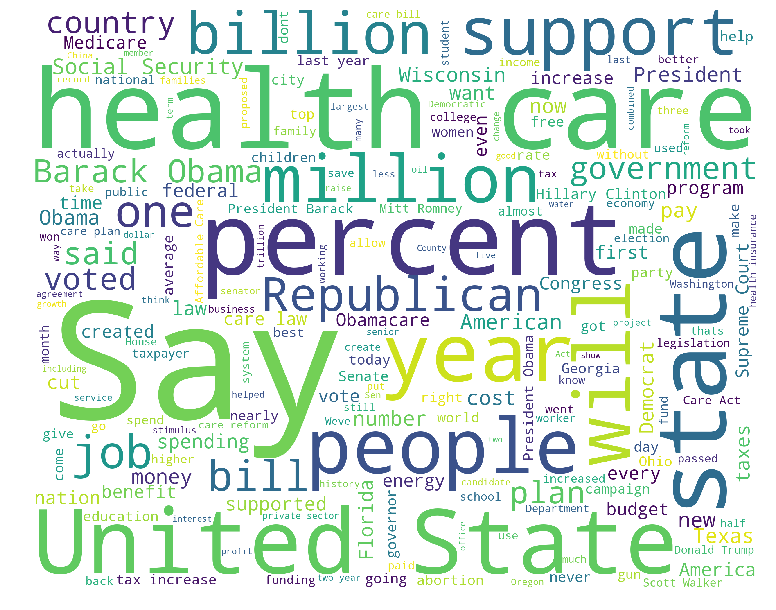

Highly Negative Named Entities


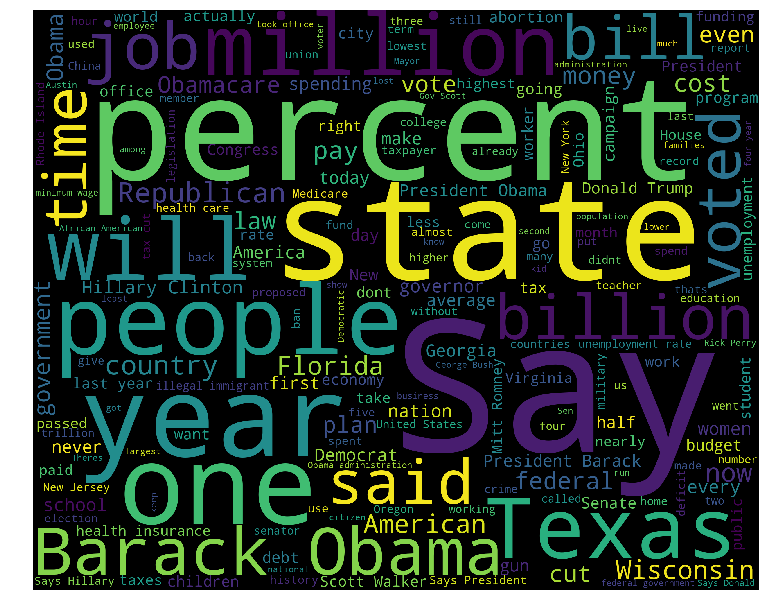

In [339]:
from wordcloud import WordCloud,STOPWORDS
def wordcloud_draw(data, color = 'black'):
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and not word.startswith('#')
                                and word != 'RT'
                            ])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(13, 13))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    
positive_words=[] 
negative_words=[]
print("Highly Positive named entities")
for x in train_data['statement']: 
    ss = sid.polarity_scores(x)
    if ss["compound"] > 0.0:
        positive_words.append(x)
    else:
        negative_words.append(x)
        
wordcloud_draw(positive_words,'white')
print("Highly Negative Named Entities")
wordcloud_draw(negative_words)

# 2. Topic Modelling


#  1) Latent Semantic Analysis -
## Analyse Controversy Influence factor using Latent Semantic Analysis
* Compute possible similarities based on apparent semantic relatedness of texts (words)
* Using “Indexing by Latent Semantic Analysis” 
* Use LSA to compare documents based on their topics.

### Create the transformation model for corpus using tfidf

In [340]:
lsi = models.LsiModel(corpus, id2word=dictionary, num_topics=2)
print(lsi)

LsiModel(num_terms=170, num_topics=2, decay=1.0, chunksize=20000)


In [341]:
lsi.print_topics(10)

[(0,
  '0.077*"border" + 0.077*"budget" + 0.077*"cathol" + 0.077*"class" + 0.077*"bank" + 0.077*"campaign" + 0.077*"advantag" + 0.077*"amount" + 0.077*"educ" + 0.077*"citi"')]

In [342]:
doc1 = "Human politics russian banks"
vec_bow1 = dictionary.doc2bow(doc1.lower().split())
#print(vec_bow1)
vec_lsi1 = lsi[vec_bow1] # convert the query to LSI space
print(vec_lsi1[0][1]) #LSI index



0.07669649888473702


## Similarity score

In [343]:
index = similarities.MatrixSimilarity(lsi[corpus])
sims = index[vec_lsi1]
print(list(enumerate(sims)))

[(0, 1.0)]


In [344]:
voc="obama law advantag charg diseas control syria comment inform rate attorney inaccuraci polic poll compani author rais senat iran oil dollar marriag india leadershi shoot reform defens republican delay union bank church presid peac offici februari fiscal fight spend parent candid fund school chines number expect rule ban job oklahoma amount campaign egypt prison educ tax administr concern vote cost violenc kill korea germani statu media race voter american insur effect popul attack drug debt world invest chairman trial congress murder crisi economi israel health war shot russian govern offens lawmak support sex patient gun whether progress judg democrat class mexico strike forc countri cut parti stock polit aid cathol crimin financ sourc store famili secur washington benefit elect threat reason unemploy weapon sale border bill debat land usa money nation investig price restrict court enforc conserv afghanistan immigr legisl goal abus syrian justic lawsuit armi victim china crime primari power account hous citi strategi societi labor project worth russia polici deficit militari america market sector budget credit news"

voc_bow = dictionary.doc2bow(voc.lower().split())
vec_lsa_voc = lsi[voc_bow]

In [345]:
LSA1_score=[]
for doc in train_data['stemmed']:
    bow_vector_st = dictionary.doc2bow(doc.lower().split())
    vec_lsa_ex = lsi[bow_vector_st]
    sim = gensim.matutils.cossim(vec_lsa_voc, vec_lsa_ex)

### Computing LSA MatrixSimilarity index for all news statements in training dataset with the dictionary of Controversial words

In [346]:
LSA_score=[]
mydict={}

for data in train_data['stemmed']:
    vec_bow2 = dictionary.doc2bow(data.lower().split())
    vec_lsi2 = lsi[vec_bow2] # convert the query to LSI space
    mydict[data] = vec_lsi2
    if len(vec_lsi2) >= 1:
        sim = gensim.matutils.cossim(vec_lsa_voc, vec_lsa_ex)
        LSA_score.append(vec_lsi2[0][1])
    else:
        LSA_score.append(0)
       
       
sorted_mydict = OrderedDict(sorted(mydict.items(), key=lambda x: x[1], reverse=True))
count=0
for key,val in sorted_mydict.items():
    if val and (count > 3 and count < 10):
        print (key, "=>", val[0][1])
        print('\n')
    count+=1

    

number politician vote rais tax time properti tax back sale tax increas util nurs home cell phone park lot lotteri win gym tax architect corzin budget drive debt number take => 0.843661487732109


schoolchildren nation forc watch presid justifi plan govern run health care bank automobil compani increas tax creat job rack debt presid => 0.8436614877321088


veto spend lawmak cut tax small busi job creation nation hous market right balanc state budget cut state spend => 0.8436614877321084


fact presid oppos abort abort go abort barack obama presid tv interview megachurch pastor true job lose lose econom polici place effect economi job accomplish job stimulus barack obama presid interview => 0.8436614877321078


spend money health care capita countri world develop countri world spend time averag countri spend capita spend => 0.8436614877321073


say vote war unpaid vote tax cut unpaid vote prescript drug bill cost health care bill pay => 0.8436614877321053




## Enrich the dataset - Append the LSA_score as a new column to the training dataset 

In [347]:
train_data['LSA_controversy_score']= LSA_score

In [348]:
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score
0,2635.json,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393
1,10540.json,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393
3,1123.json,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000


### The scores are not very accurate, as some sentences which are controversial have still been scored low

# 2) TfidfVectorizer
### Analyse Controversy Influence factor using Tfidf Cosine Similarity
* Compute Cosine Similarity between statements and controversy vocabulary

In [349]:
corpus_cos = []
import gensim
from nltk.tokenize import word_tokenize

for text in train_data['stemmed']:
    corpus_cos.append(text)

In [350]:
vocab_doc_str = "abuse administration afghanistan aid america american army attacks authorities ban banks benefits bill border budget campaign candidate catholic china chinese church concerns congress conservative control country court crime criminal crisis cuts debate debt defense deficit democrats disease dollar drug drugs economy education egypt election elections enforcement fighting finance fiscal force funding gas government gun health immigration inaccuracies india insurance investigation investigators iran israel job jobs judge justice killing korea labor land law lawmakers laws lawsuit leadership legislation marriage media mexico military money murder nation nations news obama offensive officials oil parties peace police policies policy politics poll power president prices primary prison progress race reform republican republicans restrictions rule rules ruling russia russian school security senate sex shooting society spending strategy strike support syria syrian tax taxes threat trial unemployment union usa victim violence vote voters war washington weapons world account advantage amount attorney chairman charge charges cities class comment companies cost credit delays effect expectations families family february germany goal housing information investment markets numbers oklahoma parents patients population price projects raise rate reason sales schools sector shot source sources status stock store whether worth"

In [351]:
vocab_doc_stem = "abus account administr advantag afghanistan aid america american amount armi attack attorney author ban bank benefit bill border budget campaign candid cathol chairman charg china chines church citi class comment compani concern congress conserv control cost countri court credit crime crimin crisi cut debat debt defens deficit delay democrat diseas dollar drug economi educ effect egypt elect enforc expect famili februari fight financ fiscal forc fund ga germani goal govern gun health hous immigr inaccuraci india inform insur invest investig iran israel job judg justic kill korea labor land law lawmak lawsuit leadership legisl market marriag media mexico militari money murder nation news number obama offens offici oil oklahoma parent parti patient peac polic polici polit poll popul power presid price primari prison progress project race rais rate reason reform republican restrict rule russia russian sale school sector secur senat sex shoot shot societi sourc spend statu stock store strategi strike support syria syrian tax threat trial unemploy union usa victim violenc vote voter war washington weapon whether world worth"

In [352]:
corpus_cos.append(vocab_doc_stem)

#### Vectorize using TfidfVectorizer

In [353]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()

In [354]:
X = vectorizer.fit_transform(corpus_cos)
X
print(X[10])

  (0, 5623)	0.3568944029308679
  (0, 5253)	0.19410748026675886
  (0, 2376)	0.24663050752172688
  (0, 4650)	0.32249306930821964
  (0, 3336)	0.2015064899417237
  (0, 3884)	0.32419232056419406
  (0, 3045)	0.7241648693960631


In [355]:
#vectorizer.vocabulary_

In [356]:
features = vectorizer.get_feature_names()
print(features[4133])

rainfal


In [357]:
X.shape

(10241, 5835)

In [358]:
X.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [359]:
from scipy import spatial

In [360]:
cos_doc1 = 1 - spatial.distance.cosine(X[123].toarray(), X[10240].toarray())
cos_doc1

0.02999212730860601

## Computing Cosine Similarity for all News statements
* cosine distance = 1 - cosine similarity

In [361]:
cosine_dict={}
count = 0
controversy_score=[]
#controversy_label= []
for i in range(10240):
    cos_doc1 = 1- spatial.distance.cosine(X[i].toarray(), X[10240].toarray())
    cosine_dict[train_data['statement'][i]] = cos_doc1
    controversy_score.append(cos_doc1)
        
    
sorted_dict = OrderedDict(sorted(cosine_dict.items(), key=lambda x: x[1]))

for key,val in sorted_dict.items():
    if val and (count > 3 and count < 1695):
        print (key, "=>", val)
        print('\n')
    count+=1

Odd fact for odd draft: No. 2 overall pick will earn more than the No. 1 pick due to no state tax in Florida. So 2 not so bad. => 0.0047778785042338345


If you look at our tax mix, the share of corporate revenues as a percentage of our overall revenue mix has declined by about half over the last 30 years. => 0.005093060674750571


Geithner's failure to pay self-employment taxes while working for the IMF is a mistake that is commonly made for people who are working internationally or for international institutions. => 0.005415818460642652




## Enrich the dataset -  Append the  cosine_similarity_score as a new column to the training dataset 

In [362]:
train_data['cosine_similarity_tfidf']= controversy_score

In [363]:
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score,cosine_similarity_tfidf
0,2635.json,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393,0.032886
1,10540.json,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393,0.019138
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393,0.042062
3,1123.json,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786,0.069615
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000,0.000000


* cosine distance of 0; documents are similar;  cosine distance 1, documents are dissimilar
##### The scores are very inaccurate , since our dictionary consists of Controversy words combined into  one set of documents. It is not able to find frequency and important of each word, and most of the terms have zero as value.

# 3) LDA (Latent Dirichlet Allocation)
## Building LDA model using Bag of Words on the Data set
* Create a dictionary from ‘vocabulary’ containing the number of times a word appears in the training set.
* LDA returns a vector of topic probabilities for each document.


#### Get word frequency using nltk to get a word frequency (by count)  and  keep the top most used words to train the LDA model 

In [364]:
import nltk
from nltk import FreqDist
# first get a list of all words
all_words = [word for item in list(train_data['tokenized']) for word in item]
# use nltk fdist to get a frequency distribution of all words
fdist = FreqDist(all_words)
len(fdist) # number of unique words
#all_words

5785

In [365]:
# choose k and visually inspect the bottom 10 words of the top k
k = 1800
top_k_words = fdist.most_common(k)
top_k_words[-10:]

[('interst', 5),
 ('hop', 5),
 ('memori', 5),
 ('northeast', 5),
 ('affili', 5),
 ('granit', 5),
 ('cori', 5),
 ('attribut', 5),
 ('freshman', 5),
 ('payer', 5)]

In [366]:
# choose k and visually inspect the bottom 10 words of the top k
k =1900
top_k_words = fdist.most_common(k)
top_k_words[-10:]

[('legitim', 5),
 ('baseb', 5),
 ('scientif', 5),
 ('purpo', 5),
 ('stuff', 5),
 ('motorist', 5),
 ('knowledg', 5),
 ('gallon', 5),
 ('embrac', 5),
 ('mill', 5)]

In [367]:
# define a function only to keep words in the top k words
k=5
top_k_words,_ = zip(*fdist.most_common(k))
top_k_words = set(top_k_words)
def keep_top_k_words(text):
    return [word for word in text if word in top_k_words]

In [368]:
top_k_words

{'presid', 'say', 'state', 'tax', 'vote'}

In [369]:
# document length
train_data['doc_len'] = train_data['tokenized'].apply(lambda x: len(x))
doc_lengths = list(train_data['doc_len'])
train_data.drop(labels='doc_len', axis=1, inplace=True)

print("length of list:",len(doc_lengths),
      "\naverage document length", np.average(doc_lengths),
      "\nminimum document length", min(doc_lengths),
      "\nmaximum document length", max(doc_lengths))

length of list: 10240 
average document length 7.28291015625 
minimum document length 0 
maximum document length 250


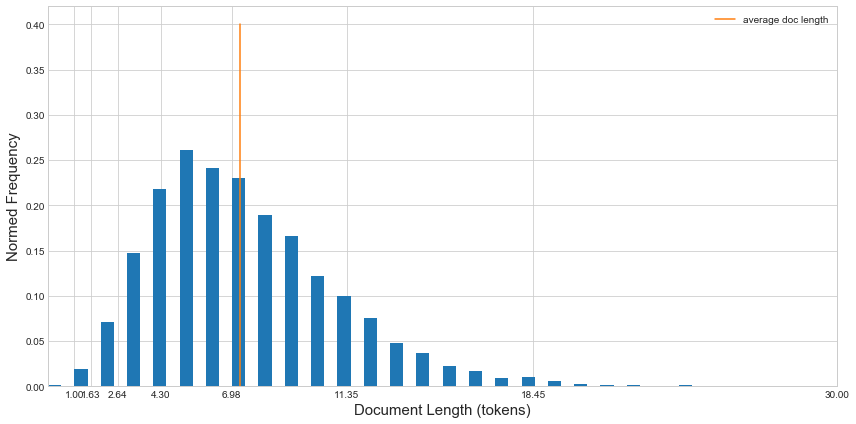

In [370]:
# plot a histogram of document length
num_bins = 500
fig, ax = plt.subplots(figsize=(12,6));
# the histogram of the data
n, bins, patches = ax.hist(doc_lengths, num_bins, normed=1)
ax.set_xlabel('Document Length (tokens)', fontsize=15)
ax.set_ylabel('Normed Frequency', fontsize=15)
ax.grid()
ax.set_xticks(np.logspace(start=np.log10(1),stop=np.log10(30),num=8, base=10.0))
plt.xlim(0,30)
ax.plot([np.average(doc_lengths) for i in np.linspace(0.0,0.4,9)], np.linspace(0.0,0.4,9), '-',
        label='average doc length')
ax.legend()
ax.grid()
fig.tight_layout()
plt.show()

###  It is useful to get the document length distribution to understand which model to choose. 
* For applying LDA it is advised to drop short articles as LDA does not work very well on short documents, so I will drop some of the shorter articles before training the model.



In [371]:
texts= list(texts)
#texts

In [372]:

dict_tokenized = gensim.corpora.Dictionary(texts)
count = 0
for k, v in dict_tokenized.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 abus
1 account
2 administr
3 advantag
4 afghanistan
5 aid
6 america
7 american
8 amount
9 armi
10 attack


### Gensim doc2bow

For each document we create a dictionary reporting how many
words and how many times those words appear. Save this to ‘bow_corpus’

In [373]:
dict_bow_corpus = [dict_tokenized.doc2bow(doc) for doc in texts]
#dict_bow_corpus[0]


## Training LDA model using gensim.models.LdaMulticore for statements in training dataset

In [374]:
lda_model = gensim.models.LdaMulticore(dict_bow_corpus, num_topics=10, id2word=dict_tokenized, passes=2, workers=2)

In [375]:
index = similarities.MatrixSimilarity(lda_model[dict_bow_corpus])
index

In [376]:
#voc="obama law advantag charg diseas control syria comment inform rate attorney inaccuraci polic poll compani author rais senat iran oil dollar marriag india leadershi shoot reform defens republican delay union bank church presid peac offici februari fiscal fight spend parent candid fund school chines number expect rule ban job oklahoma amount campaign egypt prison educ tax administr concern vote cost violenc kill korea germani statu media race voter american insur effect popul attack drug debt world invest chairman trial congress murder crisi economi israel health war shot russian govern offens lawmak support sex patient gun whether progress judg democrat class mexico strike forc countri cut parti stock polit aid cathol crimin financ sourc store famili secur washington benefit elect threat reason unemploy weapon sale border bill debat land usa money nation investig price restrict court enforc conserv afghanistan immigr legisl goal abus syrian justic lawsuit armi victim china crime primari power account hous citi strategi societi labor project worth russia polici deficit militari america market sector budget credit news"

In [377]:
voc_bow = dictionary.doc2bow(vocab_doc_stem.lower().split())
vec_lda_voc = lda_model[voc_bow]

In [378]:

#voc = "abuse administration afghanistan aid america american army attacks authorities authority banks benefits bill border budget campaign candidate candidates catholic china chinese church concerns congress conservative control country court crime criminal crisis cuts debate debt defense deficit democrats disease dollar drug drugs economy education egypt election elections enforcement fighting finance fiscal force funding gas government gun health immigration inaccuracies india insurance investigation investigators iran israel job jobs judge justice killing korea labor land law lawmakers laws lawsuit leadership legislation marriage media mexico military money murder nation nations news obama offensive officials oil parties peace police policies policy politics poll power president prices primary prison progress race reform republican republicans restrictions rule rules ruling russia russian school security senate sex shooting society spending strategy strike support syria syrian tax taxes threat trial unemployment union usa victim violence vote voters war washington weapons world account advantage amount attorney chairman charge charges cities class comment companies cost credit delays effect expectations families family february germany goal housing information investment markets numbers oklahoma parents patients population price projects raise rate reason sales schools sector shot source sources status stock store whether worth"


In [379]:
print(train_data['tokenized'][5])

['chicago', 'bear', 'start', 'quarterback', 'total', 'number', 'tenur', 'uw', 'faculti', 'fire']


In [380]:
from gensim import corpora, models
np.random.seed(2017)
texts_token = train_data['tokenized'].values
dictionary_tmp = corpora.Dictionary(texts_token)
corpus_tmp = [dictionary_tmp.doc2bow(text) for text in texts_token]
ldamodel2 = models.ldamodel.LdaModel(corpus_tmp, id2word=dictionary_tmp, 
                                    num_topics=8, passes=5, minimum_probability=0)

In [381]:
hm = np.array([[y for (x,y) in ldamodel2[corpus_tmp[i]]] for i in range(len(corpus_tmp))])

In [382]:
from sklearn.manifold import TSNE

from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes
output_notebook()

Loading BokehJS ...

In [383]:

tsne = TSNE(random_state=2017, perplexity=30)
tsne_embedding = tsne.fit_transform(hm)
tsne_embedding = pd.DataFrame(tsne_embedding, columns=['x','y'])
tsne_embedding['hue'] = hm.argmax(axis=1)

#### For visualizing the scatter ratio of each word in the dictionary

In [384]:
source = ColumnDataSource(
        data=dict(
            x = tsne_embedding.x,
            y = tsne_embedding.y,
            colors = [all_palettes['Set1'][8][i] for i in tsne_embedding.hue],
            title = train_data.label,
            year = train_data['text-length'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
        )
    )
hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <span style="font-size: 12px; font-weight: bold;">Year:</span>
            <span style="font-size: 12px">@year</span>
        </div>
    </div>
    """)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset']
plot_tsne = figure(plot_width=700, plot_height=700, tools=tools_tsne, title='Papers')
plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var f = cb_obj.value
    x = data['x']
    y = data['y']
    colors = data['colors']
    alpha = data['alpha']
    title = data['title']
    year = data['year']
    size = data['size']
    for (i = 0; i < x.length; i++) {
        if (year[i] <= f) {
            alpha[i] = 0.9
            size[i] = 7
        } else {
            alpha[i] = 0.05
            size[i] = 4
        }
    }
    source.trigger('change');
""")

slider = Slider(start=train_data['text-length'].min(), end=train_data['text-length'].max(), value=100, step=1, title="length")
slider.js_on_change('value', callback)

layout = column(slider, plot_tsne)

In [385]:
show(layout)

### The topics appear well scatered, unlike the topics for LSA model. Hence this is a better model for finding Controversy similarity index

### For each topic, LDA displays the words occuring in that topic and its relative weight.





In [386]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.006*"border" + 0.006*"februari" + 0.006*"project" + 0.006*"insur" + 0.006*"charg" + 0.006*"weapon" + 0.006*"support" + 0.006*"price" + 0.006*"obama" + 0.006*"china"
Topic: 1 
Words: 0.007*"iran" + 0.007*"militari" + 0.007*"gun" + 0.007*"tax" + 0.006*"war" + 0.006*"famili" + 0.006*"sale" + 0.006*"control" + 0.006*"sex" + 0.006*"restrict"
Topic: 2 
Words: 0.006*"attorney" + 0.006*"mexico" + 0.006*"shot" + 0.006*"societi" + 0.006*"forc" + 0.006*"inform" + 0.006*"congress" + 0.006*"american" + 0.006*"oil" + 0.006*"korea"
Topic: 3 
Words: 0.006*"spend" + 0.006*"class" + 0.006*"effect" + 0.006*"attorney" + 0.006*"shot" + 0.006*"delay" + 0.006*"rate" + 0.006*"presid" + 0.006*"fight" + 0.006*"syria"
Topic: 4 
Words: 0.006*"offici" + 0.006*"ga" + 0.006*"armi" + 0.006*"syrian" + 0.006*"inaccuraci" + 0.006*"secur" + 0.006*"union" + 0.006*"peac" + 0.006*"market" + 0.006*"congress"
Topic: 5 
Words: 0.006*"rais" + 0.006*"labor" + 0.006*"korea" + 0.006*"benefit" + 0.006*"ga" + 0.00

## 4) Running LDA using TF-IDF
* Create tf-idf model object using models.TfidfModel on ‘bow_corpus’.
* Apply transformation to the entire corpus. 


In [387]:
tf_idf = gensim.models.TfidfModel(corpus)
print(tf_idf)
s = 0
for i in corpus:
    s += len(i)
print(s)

TfidfModel(num_docs=1, num_nnz=170)
170


In [388]:
corpus_tfidf = tf_idf[corpus]
print(corpus_tfidf)

In [389]:
corpus_tfidf

In [390]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dict_tokenized, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"
Topic: 1 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"
Topic: 2 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"
Topic: 3 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"
Topic: 4 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"
Topic: 5 Word: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"

### Performance evaluation of LDA model for classifying sample document using Bag of Words

In [391]:
for index, score in sorted(lda_model[dict_bow_corpus[0]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.9947368502616882	 
Topic: 0.006*"border" + 0.006*"februari" + 0.006*"project" + 0.006*"insur" + 0.006*"charg" + 0.006*"weapon" + 0.006*"support" + 0.006*"price" + 0.006*"obama" + 0.006*"china"


### Performance evaluation of LDA model on tfidf for classifying sample document

In [392]:
for index, score in sorted(lda_model_tfidf[dict_bow_corpus[0]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.20596900582313538	 
Topic: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"

Score: 0.1525852531194687	 
Topic: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"

Score: 0.14285904169082642	 
Topic: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"

Score: 0.11640404164791107	 
Topic: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"

Score: 0.11079420894384384	 
Topic: 0.006*"poll" + 0.006*"power" + 0.006*"parent" + 0.006*"parti" + 0.006*"patient" + 0.006*"peac" + 0.006*"polic" + 0.006*"polici" + 0.006*"polit" + 0.006*"oil"

Score: 0.0953400805592536

In [393]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
total_topics = 50
lda_model_tfidf = models.LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=total_topics, 
                                  passes=1, random_state=47)
lda_model_bow = models.LdaModel(corpus=dict_bow_corpus, id2word=dictionary, num_topics=total_topics,
                                passes=1, random_state=47)

In [394]:
import pyLDAvis.gensim
data = pyLDAvis.gensim.prepare(lda_model_bow, dict_bow_corpus, dictionary)
#data

### * Performance of LDA without TF-idf is better than LDA with TF-idf

## Testing model on unseen document

In [395]:
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [396]:
unseen_document = 'How a Pentagon deal became an identity crisis for Google'
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
tmp=sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1])[0]
print(tmp)


(0, 0.549999)


## Calculate LDA similarity score for the News Statement from training dataset 

In [397]:
LDA_score=[]
count=0
for doc in train_data['stemmed']:
    bow_vector_st = dictionary.doc2bow(preprocess(doc))
    vec_lda_ex = lda_model[bow_vector_st]
    sim = gensim.matutils.cossim(vec_lda_voc, vec_lda_ex)
    LDA_score.append(sim)
    if (count > 3 and count < 10):
        print(doc,'=>',sim)
        print ('\n')
    count+=1
    
    
    
    


econom turnaround start end term => 0.3162277523623265


chicago bear start quarterback total number tenur uw faculti fire => 0.9647636077481818


live district repres => 0.3162277523623265


person stage work pass ethic reform => 0.9647636212762175


take lotteri fund port newport land new noaa marin oper center pacif => 0.9899494016331394


say gop primari oppon cast compromis vote cost electr cost => 0.9973336748077241




## Data Enrichment -  Enrich the dataset by appending LDA_score as a new column to the training dataset

In [398]:
train_data['LDA_controversy_score']= LDA_score

In [399]:
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score,cosine_similarity_tfidf,LDA_controversy_score
0,2635.json,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393,0.032886,0.989949
1,10540.json,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393,0.019138,0.989949
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393,0.042062,0.989949
3,1123.json,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786,0.069615,0.995350
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000,0.000000,0.316228


## Visualizing the LDA model topics using pyLDAvis

In [400]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [401]:
pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)

PreparedData(topic_coordinates=                  x             y  topics  cluster       Freq
topic                                                        
0     -1.189714e-05 -1.266102e-06       1        1  99.473694
7     -3.299850e-04  2.680020e-04       2        1   0.058480
1      4.029817e-04  1.473951e-04       3        1   0.058480
2     -9.570531e-05 -3.144284e-04       4        1   0.058480
6      1.301392e-05 -9.490943e-05       5        1   0.058480
9      6.644798e-07 -3.473969e-05       6        1   0.058480
8      2.898524e-05  9.345406e-06       7        1   0.058480
3      1.157872e-06 -5.298142e-06       8        1   0.058480
4     -6.384156e-06  4.457064e-07       9        1   0.058480
5     -2.831546e-06  2.545365e-05      10        1   0.058480, topic_info=     Category      Freq         Term     Total  loglift  logprob
term                                                            
17    Default  1.000000       border  1.000000  30.0000  30.0000
60    Default  1.000000     februari  1.000000  29.0000  29.0000
124   Default  1.000000      project  1.000000  28.0000  28.0000
77    Default  1.000000        insur  1.000000  27.0000  27.0000
23    Default  1.000000        charg  1.000000  26.0000  26.0000
166   Default  1.000000       weapon  1.000000  25.0000  25.0000
151   Default  1.000000      support  1.000000  24.0000  24.0000
120   Default  1.000000        price  1.000000  23.0000  23.0000
104   Default  1.000000        obama  1.000000  22.0000  22.0000
24    Default  1.000000        china  1.000000  21.0000  21.0000
160   Default  1.000000       victim  1.000000  20.0000  20.0000
147   Default  1.000000        stock  1.000000  19.0000  19.0000
69    Default  1.000000       govern  1.000000  18.0000  18.0000
33    Default  1.000000      conserv  1.000000  17.0000  17.0000
112   Default  1.000000         peac  1.000000  16.0000  16.0000
97    Default  1.000000       mexico  1.000000  15.0000  15.0000
20    Default  1.000000       candid  1.000000  14.0000  14.0000
157   Default  1.000000     unemploy  1.000000  13.0000  13.0000
29    Default  1.000000      comment  1.000000  12.0000  12.0000
87    Default  1.000000        labor  1.000000  11.0000  11.0000
103   Default  1.000000       number  1.000000  10.0000  10.0000
40    Default  1.000000       crimin  1.000000   9.0000   9.0000
18    Default  1.000000       budget  1.000000   8.0000   8.0000
16    Default  1.000000         bill  1.000000   7.0000   7.0000
27    Default  1.000000         citi  1.000000   6.0000   6.0000
141   Default  1.000000        shoot  1.000000   5.0000   5.0000
51    Default  1.000000         drug  1.000000   4.0000   4.0000
165   Default  1.000000   washington  1.000000   3.0000   3.0000
106   Default  1.000000       offici  1.000000   2.0000   2.0000
71    Default  1.000000       health  1.000000   1.0000   1.0000
...       ...       ...          ...       ...      ...      ...
100   Topic10  0.000584       murder  0.988805   0.0104  -5.1367
167   Topic10  0.000585      whether  0.990251   0.0100  -5.1356
32    Topic10  0.000583     congress  0.987718   0.0100  -5.1382
78    Topic10  0.000584       invest  0.989006   0.0098  -5.1371
156   Topic10  0.000586        trial  0.992616   0.0097  -5.1335
125   Topic10  0.000585         race  0.990548   0.0096  -5.1357
79    Topic10  0.000587     investig  0.994856   0.0087  -5.1322
48    Topic10  0.000586     democrat  0.992688   0.0091  -5.1341
15    Topic10  0.000588      benefit  0.998638   0.0065  -5.1307
126   Topic10  0.000589         rais  1.004931   0.0021  -5.1288
65    Topic10  0.000586         fund  0.995218   0.0072  -5.1334
62    Topic10  0.000587       financ  1.001837   0.0027  -5.1312
61    Topic10  0.000586        fight  0.997013   0.0056  -5.1332
130   Topic10  0.000586   republican  0.995053   0.0070  -5.1338
136   Topic10  0.000586       school  0.993788   0.0078  -5.1342
149   Topic10  0.000587     strategi  1.004345   0.0000  -5.1314
127   Topic10  0.000587     

### Shows the top 10 topics in LDA model for every news statements, and top terms in each topic

In [402]:
lda_model.show_topics(num_topics=5, num_words=20)

[(7,
  '0.007*"store" + 0.007*"administr" + 0.007*"school" + 0.007*"russia" + 0.007*"violenc" + 0.006*"countri" + 0.006*"societi" + 0.006*"spend" + 0.006*"germani" + 0.006*"effect" + 0.006*"korea" + 0.006*"govern" + 0.006*"fiscal" + 0.006*"kill" + 0.006*"statu" + 0.006*"syria" + 0.006*"court" + 0.006*"author" + 0.006*"parti" + 0.006*"parent"'),
 (6,
  '0.006*"polit" + 0.006*"crimin" + 0.006*"advantag" + 0.006*"korea" + 0.006*"threat" + 0.006*"support" + 0.006*"rate" + 0.006*"campaign" + 0.006*"american" + 0.006*"fight" + 0.006*"afghanistan" + 0.006*"church" + 0.006*"cathol" + 0.006*"forc" + 0.006*"inform" + 0.006*"oklahoma" + 0.006*"citi" + 0.006*"poll" + 0.006*"candid" + 0.006*"strategi"'),
 (2,
  '0.006*"attorney" + 0.006*"mexico" + 0.006*"shot" + 0.006*"societi" + 0.006*"forc" + 0.006*"inform" + 0.006*"congress" + 0.006*"american" + 0.006*"oil" + 0.006*"korea" + 0.006*"campaign" + 0.006*"author" + 0.006*"ga" + 0.006*"secur" + 0.006*"price" + 0.006*"famili" + 0.006*"inaccuraci" + 0.0

In [403]:
lda_model.show_topic(topicid=3, topn=5)

[('spend', 0.0062280963),
 ('class', 0.006222401),
 ('effect', 0.00618242),
 ('attorney', 0.006156305),
 ('shot', 0.0061204215)]

### Prepare data to find Dominant_Topic , Percentage_Contribution and Topic_Keywords

In [404]:
text_corpus = train_data.statement.values.tolist()
text_corpus = [re.sub('\S*@\S*\s?', '', doc) for doc in text_corpus] #removing email addresses
text_corpus = [re.sub('\s+', ' ', doc) for doc in text_corpus] #removing newline characters
text_corpus = [re.sub("\'", "", doc) for doc in text_corpus] #removing single quote characters

In [405]:
def doc_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

words = list(doc_to_words(text_corpus))

In [406]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
 
def remove_stopwords(text):
    return [[word for word in gensim.utils.simple_preprocess(str(doc)) if word not in stop_words] for doc in text_corpus]
 
words = remove_stopwords(words)
 
print(words[1])

['decline', 'coal', 'start', 'started', 'natural', 'gas', 'took', 'started', 'begin', 'president', 'george', 'bushs', 'administration']


In [407]:
data_lemmatized = lemmatization(words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

0 documents lemmatised
500 documents lemmatised
1000 documents lemmatised
1500 documents lemmatised
2000 documents lemmatised
2500 documents lemmatised
3000 documents lemmatised
3500 documents lemmatised
4000 documents lemmatised
4500 documents lemmatised
5000 documents lemmatised
5500 documents lemmatised
6000 documents lemmatised
6500 documents lemmatised
7000 documents lemmatised
7500 documents lemmatised
8000 documents lemmatised
8500 documents lemmatised
9000 documents lemmatised
9500 documents lemmatised
10000 documents lemmatised


In [408]:
id2word = corpora.Dictionary(data_lemmatized)
corpus = [id2word.doc2bow(text) for text in data_lemmatized]

In [409]:

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           per_word_topics=True)

## Enriching the dataset with Dominant_Topic , Percentage_Contribution and Topic_Keywords 
### LDA topic modelling uncovered the dominant topics and subjects in the corpus of news articles. So I have extracted the volume and percentage contribution of each topic to get an idea of how important a topic is and added it as an enrichment to the dataset.

In [410]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=text_corpus):
    # Array of top 10 topics
    top10array = []
 
    for row in range(ldamodel.num_topics):
        wp = ldamodel.show_topic(row)
        topic_keywords = ", ".join([word for word, prop in wp])
        top10array.append((row+1, topic_keywords))
 
    top10dict = dict(top10array)
 
    sent_topics_df = pd.DataFrame(pd.DataFrame([sorted(topic[0], key=lambda x: (x[1]), reverse=True) for topic in ldamodel[corpus]])[0])
    sent_topics_df.columns=["Data"]
    sent_topics_df['Dominant_Topic'] = sent_topics_df.Data.apply(lambda x: x[0]+1)
    sent_topics_df['Perc_Contribution'] = sent_topics_df.Data.apply(lambda x: round(x[1],4))
    sent_topics_df['Topic_Keywords'] = sent_topics_df.Dominant_Topic.apply(lambda x: top10dict[x])
 
    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents.rename("Text")], axis=1)
    sent_topics_df = sent_topics_df[['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords', 'Text']]
    return(sent_topics_df)
 
df_topic_sents_keywords = format_topics_sentences()

In [411]:
train_data['Topic_Keywords'] = df_topic_sents_keywords['Topic_Keywords']

train_data['Topic_Perc_Contrib'] = df_topic_sents_keywords['Perc_Contribution']
train_data['Dominant_Topic'] = df_topic_sents_keywords['Dominant_Topic']
train_data.head()


,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score,cosine_similarity_tfidf,LDA_controversy_score,Topic_Keywords,Topic_Perc_Contrib,Dominant_Topic
0,2635.json,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393,0.032886,0.989949,"year, budget, office, state, take, increase, s...",0.6884,5
1,10540.json,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393,0.019138,0.989949,"percent, wage, gas, top, state, gun, minimum, ...",0.7803,11
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393,0.042062,0.989949,"say, not, do, scott, gov, bush, rick, walker, ...",0.5504,13
3,1123.json,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786,0.069615,0.995350,"voter, say, democratic, party, vote, trump, re...",0.2837,8
4,9028.json,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000,0.000000,0.316228,"child, virginia, american, law, bear, rhode, s...",0.6084,2


In [412]:
sent_topics_sorteddf_mallet = pd.DataFrame()
 
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')
 
for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)
 
# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)
 
# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]
 
# Show
sent_topics_sorteddf_mallet.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,1,0.9441,"tax, health, care, year, percent, pay, cut, in...",The presidents health care proposals will caus...
1,2,0.9269,"child, virginia, american, law, bear, rhode, s...",Wisconsin is not as obese as the national aver...
2,3,0.9406,"percent, rate, high, debt, say, state, ever, u...","[A]t his current rate, President Obama will ha..."
3,4,0.9172,"say, school, student, texas, austin, would, ca...","Says that in a hearing, Rep. Gabrielle Gifford..."
4,5,0.9472,"year, budget, office, state, take, increase, s...","When President Bush took office in 2001, he in..."


## In order to properly compare LDA with LSA, I projected it with t-SNE.  LDA plot looked better than LSA in separating out the topic categories. For this reason, I selected LDA as the more appropriate algorithm.

# 5) Doc2Vec 
* Doc2vec is an NLP tool for representing documents as a vector and is a generalization of the word2vec method.
* A word vector is generated for each word, and a document vector is generated for each document. 

In [413]:
vocab_doc_stem_list = ["abus account administr advantag afghanistan aid america american amount armi attack attorney author ban bank benefit bill border budget campaign candid cathol chairman charg china chines church citi class comment compani concern congress conserv control cost countri court credit crime crimin crisi cut debat debt defens deficit delay democrat diseas dollar drug economi educ effect egypt elect enforc expect famili februari fight financ fiscal forc fund ga germani goal govern gun health hous immigr inaccuraci india inform insur invest investig iran israel job judg justic kill korea labor land law lawmak lawsuit leadership legisl market marriag media mexico militari money murder nation news number obama offens offici oil oklahoma parent parti patient peac polic polici polit poll popul power presid price primari prison progress project race rais rate reason reform republican restrict rule russia russian sale school sector secur senat sex shoot shot societi sourc spend statu stock store strategi strike support syria syrian tax threat trial unemploy union usa victim violenc vote voter war washington weapon whether world worth"]

In [414]:
vocab_doc_stem_list

['abus account administr advantag afghanistan aid america american amount armi attack attorney author ban bank benefit bill border budget campaign candid cathol chairman charg china chines church citi class comment compani concern congress conserv control cost countri court credit crime crimin crisi cut debat debt defens deficit delay democrat diseas dollar drug economi educ effect egypt elect enforc expect famili februari fight financ fiscal forc fund ga germani goal govern gun health hous immigr inaccuraci india inform insur invest investig iran israel job judg justic kill korea labor land law lawmak lawsuit leadership legisl market marriag media mexico militari money murder nation news number obama offens offici oil oklahoma parent parti patient peac polic polici polit poll popul power presid price primari prison progress project race rais rate reason reform republican restrict rule russia russian sale school sector secur senat sex shoot shot societi sourc spend statu stock store st

In [415]:
 df = pd.DataFrame(data=vocab_doc_stem_list, columns = ["vocab"])

In [416]:
df['tag'] = 'tag'

In [417]:

df['clean_vocab'] = df['vocab'].apply(cleanText)


In [418]:
df

,vocab,tag,clean_vocab
0,abus account administr advantag afghanistan ai...,tag,abus account administr advantag afghanistan ai...


#### Reset id column

In [419]:
train_data['id']= train_data.index
train_data

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score,cosine_similarity_tfidf,LDA_controversy_score,Topic_Keywords,Topic_Perc_Contrib,Dominant_Topic
0,0,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393,0.032886,0.989949,"year, budget, office, state, take, increase, s...",0.6884,5
1,1,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393,0.019138,0.989949,"percent, wage, gas, top, state, gun, minimum, ...",0.7803,11
2,2,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393,0.042062,0.989949,"say, not, do, scott, gov, bush, rick, walker, ...",0.5504,13
3,3,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786,0.069615,0.995350,"voter, say, democratic, party, vote, trump, re...",0.2837,8
4,4,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000,0.000000,0.316228,"child, virginia, american, law, bear, rhode, s...",0.6084,2
5,5,true,The Chicago Bears have had more starting quart...,155,3,chicago bears start quarterback total number t...,chicago bear start quarterback total number te...,"[chicago, bear, start, quarterback, total, num...",negative,0.077,0.076696,0.013375,0.964764,"year, budget, office, state, take, increase, s...",0.8484,5
6,6,barely-true,Jim Dunnam has not lived in the district he re...,69,4,live district represent,live district repres,"[live, district, repr]",neutral,0.000,0.000000,0.000000,0.316228,"state, get, not, be, united, say, have, send, ...",0.8417,15
7,7,half-true,I'm the only person on this stage who has work...,159,1,be person stage work pass ethic reform,person stage work pass ethic reform,"[person, stage, work, pass, ethic, reform]",positive,0.035,0.076696,0.023118,0.964764,"say, obama, president, would, barack, gasoline...",0.5267,19
8,8,half-true,"However, it took $19.5 million in Oregon Lotte...",144,1,take lottery fund port newport land new noaa m...,take lotteri fund port newport land new noaa m...,"[take, lotteri, fund, port, newport, land, new...",neutral,0.000,0.153393,0.028944,0.989949,"year, budget, office, state, take, increase, s...",0.6222,5
9,9,mostly-true,Says GOP primary opponents Glenn Grothman and ...,132,2,say gop primary opponent cast compromise vote ...,say gop primari oppon cast compromis vote cost...,"[say, gop, primari, oppon, cast, compromi, vot...",neutral,0.000,0.306786,0.056934,0.997334,"child, virginia, american, law, bear, rhode, s...",0.7165,2


### Set-up Doc2Vec Training & Evaluation Models
* Firstly, the doc2vec model with — Distributed Bag of Words (DBOW) is instantiated . 
* For word2vec , the two algorithms used are “continuous bag of words” (CBOW) and “skip-gram”; while in the doc2vec architecture, the corresponding algorithms are “distributed memory” (DM) and “distributed bag of words” (DBOW).
* Create tagged documents suitable for doc2vec

In [420]:
vocab_doc2vec=['abus','account','administr','advantag','afghanistan','aid','america','american','amount','armi','attack','attorney','author','ban','bank','benefit','bill','border','budget','campaign','candid','cathol','chairman','charg','china','chines','church','citi','class','comment','compani','concern','congress','conserv','control','cost','countri','court','credit','crime','crimin','crisi','cut','debat','debt','defens','deficit','delay','democrat','diseas','dollar','drug','economi','educ','effect','egypt','elect','enforc','expect','famili','februari','fight','financ','fiscal','forc','fund','ga','germani','goal','govern','gun','health','hous','immigr','inaccuraci','india','inform','insur','invest','investig','iran','israel','job','judg','justic','kill','korea','labor','land','law','lawmak','lawsuit','leadership','legisl','market','marriag','media','mexico','militari','money','murder','nation','news','number','obama','offens','offici','oil','oklahoma','parent','parti','patient','peac','polic','polici','polit','poll','popul','power','presid','price','primari','prison','progress','project','race','rais','rate','reason','reform','republican','restrict','rule','russia','russian','sale','school','sector','secur','senat','sex','shoot','shot','societi','sourc','spend','statu','stock','store','strategi','strike','support','syria','syrian','tax','threat','trial','unemploy','union','usa','victim','violenc','vote','voter','war','washington','weapon','whether','world','worth']

In [421]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
tagged_doc_2vec = [TaggedDocument(words=_d, tags=[str(i)]) for i, _d in enumerate(vocab_doc2vec)]

In [422]:
train, test = train_test_split(train_data, test_size=0.3, random_state=42)
from gensim.models.doc2vec import TaggedDocument
import nltk
from nltk.corpus import stopwords
stop = list(set(stopwords.words('english') + list(string.punctuation)))
stopwordsList = ["a", "about", "above", "after", "again", "against", "all", "am", "an", "and", "any", "are", "aren't", "as", "at", "be", "because", "been", "before", "being", "below", "between", "both", "but", "by", "can't", "cannot", "could", "couldn't", "did", "didn't", "do", "does", "doesn't", "doing", "don't", "down", "during", "each", "few", "for", "from", "further", "had", "hadn't", "has", "hasn't", "have", "haven't", "having", "he", "he'd", "he'll", "he's", "her", "here", "here's", "hers", "herself", "him", "himself", "his", "how", "how's", "i", "i'd", "i'll", "i'm", "i've", "if", "in", "into", "is", "isn't", "it", "it's", "its", "itself", "let's", "me", "more", "most", "mustn't", "my", "myself", "no", "nor", "not", "of", "off", "on", "once", "only", "or", "other", "ought", "our", "ours  ourselves", "out", "over", "own", "same", "shan't", "she", "she'd", "she'll", "she's", "should", "shouldn't", "so", "some", "such", "than", "that", "that's", "the", "their", "theirs", "them", "themselves", "then", "there", "there's", "these", "they", "they'd", "they'll", "they're", "they've", "this", "those", "through", "to", "too", "under", "until", "up", "very", "was", "wasn't", "we", "we'd", "we'll", "we're", "we've", "were", "weren't", "what", "what's", "when", "when's", "where", "where's", "which", "while", "who", "who's", "whom", "why", "why's", "with", "won't", "would", "wouldn't", "you", "you'd", "you'll", "you're", "you've", "your", "yours", "yourself", "yourselves"] 
# from http://www.ranks.nl/stopwords
stop.extend(stopwordsList)
#print(stop)



def tokenize_text(text):
    tokens = []
    for sent in nltk.sent_tokenize(text):
        for word in nltk.word_tokenize(sent):
            if word not in stop:
                if len(word) < 2:
                    continue
                tokens.append(word.lower())
                
    return tokens


vocab_doc2vec = df.apply(
    lambda r: TaggedDocument(words=tokenize_text(r['clean_vocab']), tags=[r.tag]), axis=1)



train_tagged = train.apply(
     lambda r: TaggedDocument(words=tokenize_text(r['statement']), tags=[r.id]), axis=1)


test_tagged = test.apply(
     lambda r: TaggedDocument(words=tokenize_text(r['stemmed']), tags=[r.id]), axis=1)

In [423]:
vocab_doc2vec = vocab_doc2vec.append(train_tagged)

In [424]:
vocab_doc2vec.values[:4]

array([TaggedDocument(words=['abus', 'account', 'administr', 'advantag', 'afghanistan', 'aid', 'america', 'american', 'amount', 'armi', 'attack', 'attorney', 'author', 'ban', 'bank', 'benefit', 'bill', 'border', 'budget', 'campaign', 'candid', 'cathol', 'chairman', 'charg', 'china', 'chines', 'church', 'citi', 'class', 'comment', 'compani', 'concern', 'congress', 'conserv', 'control', 'cost', 'countri', 'court', 'credit', 'crime', 'crimin', 'crisi', 'cut', 'debat', 'debt', 'defens', 'deficit', 'delay', 'democrat', 'diseas', 'dollar', 'drug', 'economi', 'educ', 'effect', 'egypt', 'elect', 'enforc', 'epect', 'famili', 'februari', 'fight', 'financ', 'fiscal', 'forc', 'fund', 'ga', 'germani', 'goal', 'govern', 'gun', 'health', 'hous', 'immigr', 'inaccuraci', 'india', 'inform', 'insur', 'invest', 'investig', 'iran', 'israel', 'job', 'judg', 'justic', 'kill', 'korea', 'labor', 'land', 'law', 'lawmak', 'lawsuit', 'leadership', 'legisl', 'market', 'marriag', 'media', 'meico', 'militari', 'mone

In [425]:
from gensim.models import Doc2Vec
from tqdm import tqdm
tqdm.pandas(desc='progress-bar')
import multiprocessing
cores = multiprocessing.cpu_count()

## Instantiate a Doc2Vec Model
* The paragraph vectors are obtained by training a neural network on the task of predicting a probability distribution of words in a paragraph given a randomly-sampled word from the paragraph.

In [426]:
model_dbow = Doc2Vec(dm=0, vector_size=300, negative=5, hs=0, min_count=1, sample = 0, workers=cores)
model_dbow.build_vocab([x for x in tqdm(vocab_doc2vec.values)])

100%|██████████| 7169/7169 [00:00<00:00, 1324682.38it/s]


#### The model is initialized and trained for 30 epochs

In [427]:
from sklearn import utils
for epoch in range(30):
    model_dbow.train(utils.shuffle([x for x in tqdm(vocab_doc2vec.values)]), total_examples=len(vocab_doc2vec.values), epochs=10)
    model_dbow.alpha -= 0.002
    model_dbow.min_alpha = model_dbow.alpha

100%|██████████| 7169/7169 [00:00<00:00, 2289747.59it/s]


In [428]:
Doc2vec_score=[]
count = 0
for id in train_data['id']:
    score = model_dbow.docvecs.similarity('tag',id)  
    if(score<0):
        score=-score
    if(count<6):
        print(train_data['statement'][id],'=>', score,'\n')
    
    Doc2vec_score.append(score)
    count+=1
    

Says the Annies List political group supports third-trimester abortions on demand. => 0.041353993 

When did the decline of coal start? It started when natural gas took off that started to begin in (President George W.) Bushs administration. => 0.5466402 

Hillary Clinton agrees with John McCain "by voting to give George Bush the benefit of the doubt on Iran." => 0.6861793 

Health care reform legislation is likely to mandate free sex change surgeries. => 0.014741374 

The economic turnaround started at the end of my term. => 0.61714333 

The Chicago Bears have had more starting quarterbacks in the last 10 years than the total number of tenured (UW) faculty fired during the last two decades. => 0.69459975 



## Data Enrichment - Enrich the dataset by appending the column  Doc2vec_score to the training dataset

In [429]:
train_data['Doc2vec_score'] = Doc2vec_score

In [430]:
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,LSA_controversy_score,cosine_similarity_tfidf,LDA_controversy_score,Topic_Keywords,Topic_Perc_Contrib,Dominant_Topic,Doc2vec_score
0,0,false,Says the Annies List political group supports ...,82,0,say annies list political group support trimes...,say anni list polit group support trimest abor...,"[say, anni, list, polit, group, support, trime...",positive,0.077,0.153393,0.032886,0.989949,"year, budget, office, state, take, increase, s...",0.6884,5,0.041354
1,1,half-true,When did the decline of coal start? It started...,141,1,decline coal start start natural gas take star...,declin coal start start natur gas take start b...,"[declin, coal, start, start, natur, ga, take, ...",positive,0.098,0.153393,0.019138,0.989949,"percent, wage, gas, top, state, gun, minimum, ...",0.7803,11,0.546640
2,2,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",105,2,agree vote benefit doubt,agre vote benefit doubt,"[agr, vote, benefit, doubt]",positive,0.099,0.153393,0.042062,0.989949,"say, not, do, scott, gov, bush, rick, walker, ...",0.5504,13,0.686179
3,3,false,Health care reform legislation is likely to ma...,78,0,health care reform legislation likely mandate ...,health care reform legisl like mandat free sex...,"[health, care, reform, legisl, like, mandat, f...",positive,0.394,0.306786,0.069615,0.995350,"voter, say, democratic, party, vote, trump, re...",0.2837,8,0.014741
4,4,half-true,The economic turnaround started at the end of ...,54,1,economic turnaround start end term,econom turnaround start end term,"[econom, turnaround, start, end, term]",neutral,0.000,0.000000,0.000000,0.316228,"child, virginia, american, law, bear, rhode, s...",0.6084,2,0.617143


In [431]:
model_dbow.most_similar('vote')

[('rep.', 0.21595266461372375),
 ('legisl', 0.21461760997772217),
 ('somewhere', 0.21291758120059967),
 ('guantanamo', 0.20605552196502686),
 ('apparent', 0.20261162519454956),
 ('dancing', 0.20015978813171387),
 ('hunting', 0.1961328685283661),
 ('2.7', 0.19548484683036804),
 ('bite', 0.19539320468902588),
 ('hypocrite', 0.19010934233665466)]

In [432]:
new_sentence = "I opened a new mailbox".split(" ")  
model_dbow.docvecs.most_similar(positive=[model_dbow.infer_vector(new_sentence)],topn=5)

[(7550, 0.6873194575309753),
 (1834, 0.19178253412246704),
 (4975, 0.187021404504776),
 (6192, 0.17327463626861572),
 (6673, 0.1710543930530548)]

In [433]:
model_dbow.infer_vector(['drugs', 'you', 'can', 'prevent', 'forest', 'fires'])

array([-0.14245038,  0.03361263,  0.1416482 , -0.06510723, -0.3143754 ,
        0.15473226, -0.16080151, -0.11885859, -0.20284456, -0.27339748,
        0.11385294,  0.43273625,  0.10171986,  0.24198127,  0.05396802,
       -0.10167501,  0.07085723, -0.36554527, -0.09860377, -0.24531968,
       -0.31702393,  0.23130018,  0.03950097, -0.19422793, -0.38656244,
       -0.11057939, -0.10015653,  0.08898198,  0.18516457,  0.06799248,
        0.01349545, -0.06656799, -0.20995806,  0.10023453, -0.03830099,
        0.02251308, -0.05703835,  0.07489634,  0.42022493, -0.06420584,
        0.01040283, -0.05371764,  0.17807367, -0.34490046,  0.03259766,
       -0.1174411 , -0.07395171, -0.17824914, -0.30621463,  0.23061365,
        0.09109138,  0.26014113, -0.01832562, -0.03154759, -0.149507  ,
       -0.18790415,  0.02545473,  0.10532165,  0.11613633,  0.17940302,
        0.00917831,  0.11732594,  0.26785877,  0.21895647,  0.05623394,
       -0.10600505,  0.09004193, -0.18751743,  0.00980619,  0.03

In [434]:
from gensim.models.doc2vec import Doc2Vec
max_epochs = 100
vec_size = 20
alpha = 0.025

model = Doc2Vec(size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =1)
  
model.build_vocab(tagged_doc_2vec)

for epoch in range(max_epochs):
    #print('iteration {0}'.format(epoch))
    model.train(tagged_doc_2vec,
                total_examples=model.corpus_count,
                epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha
    
model.save("doc2vec_model")
print("Model Saved")

Model Saved


### ******** Evaluate the Doc2vec Model **

In [435]:
from sklearn import utils
for epoch in range(30):
    model_dbow.train(utils.shuffle([x for x in tqdm(vocab_doc2vec.values)]), total_examples=len(vocab_doc2vec.values), epochs=10)
    model_dbow.alpha -= 0.002
    model_dbow.min_alpha = model_dbow.alpha

100%|██████████| 7169/7169 [00:00<00:00, 1887568.45it/s]


In [436]:

# def vec_for_learning(model, tagged_docs):
#     sents = tagged_docs.values
#     targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words, steps=20)) for doc in sents])
#     return targets, regressors


In [437]:
# y_train, X_train = vec_for_learning(model_dbow, train_tagged)
# y_test, X_test = vec_for_learning(model_dbow, test_tagged)

* The Doc2Vec model gave a good accuracy and similarity score.
* Through manual visual analysis, I compared with other document similarity scores like LDA, LSA and tfidf and could analyse that Doc2vec score is more accurate for finding Controversy levels.
* Hence using it towards final Controversy prediction model

## Create labels for controversy score column to classify Controversy level as -
## 1.   *weakly-controversial*
## 2.   *somewhat-controversial*
## 3.   *strongly-controversial*
## 4.   *non-controversial*

 ### * Define threshold for each label

In [438]:
doc2vec_label=[]
for score in train_data['Doc2vec_score']:
    if 0.2<score<0.4:
        doc2vec_label.append(1) # weakly-controversial
    elif 0.4<score<0.7:
        doc2vec_label.append(2)
    elif score>0.7:             # somewhat-controversial
        doc2vec_label.append(3) # strongly-controversial
    else:
        doc2vec_label.append(0) # non-controversial

In [439]:
train_data['doc2vec_label'] = doc2vec_label

In [440]:
## Considering columns - sentiment_label,statement,label_id,controversy_label

In [441]:
controversy_label=[]
for score in train_data['LDA_controversy_score']:
    if 0.2<score<0.4:
        controversy_label.append(1)   # weakly-controversial
    elif 0.4<score<0.7:
        controversy_label.append(2)    # somewhat-controversial
    elif score>0.7:                     
        controversy_label.append(3)    # strongly-controversial
    else:
        controversy_label.append(0)   # non-controversial

In [442]:
train_data['controversy_label'] = controversy_label

In [443]:
train_data['sentiment_label'] = train_data['sentiment_polarity'].factorize()[0]

In [444]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB

In [445]:
X_subset=train_data[['sentiment_label','label_id','stemmed']]

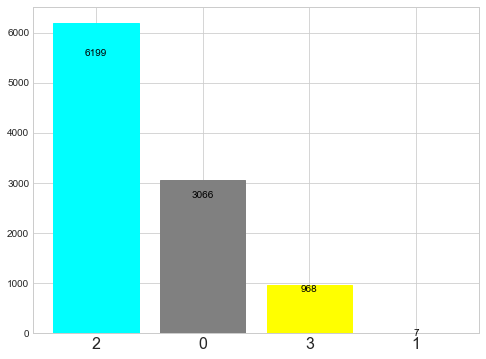

In [453]:
fig, ax = plt.subplots(1,1,figsize=(8,6))

contro_label = train_data.doc2vec_label.value_counts()
len(contro_label)

if len(contro_label) == 3:
    ax.bar(range(3), contro_label)
    ax.set_xticks(range(3))
    ax.set_xticklabels(contro_label.index, fontsize=16)

    for rect, c, value in zip(ax.patches, ['cyan', 'grey', 'yellow'], contro_label.values):
        rect.set_color(c)
        height = rect.get_height()
        width = rect.get_width()
        x_loc = rect.get_x()
        ax.text(x_loc + width/2, 0.9*height, value, ha='center', va='center', fontsize=10, color='black')
elif len(contro_label)== 4:
    ax.bar(range(4), contro_label)
    ax.set_xticks(range(4))
    ax.set_xticklabels(contro_label.index, fontsize=16)

    for rect, c, value in zip(ax.patches, ['cyan', 'grey', 'yellow','b'], contro_label.values):
        rect.set_color(c)
        height = rect.get_height()
        width = rect.get_width()
        x_loc = rect.get_x()
        ax.text(x_loc + width/2, 0.9*height, value, ha='center', va='center', fontsize=10, color='black')

### Plotting controversy bar chart
* 0 - non-controversial
* 1 - Weakly- controversial
* 2 - somewhat controversial
* 3 - Strongly-controversial

##### The number of controversial statements is higher than non-controversial statements

## chi2 on vectorized dataset ( including unigrams and bigrams)
* Term Frequency, Inverse Document Frequency, is used to calculate a tf-idf vector for each of the news statements:
* sublinear_df is set to True to use a logarithmic form for frequency.
* min_df is the minimum numbers of documents a word must be present in to be kept.
* norm is set to l2, to ensure all our feature vectors have a euclidian norm of 1.
* ngram_range is set to (1, 2) to indicate that we want to consider both unigrams and bigrams.
* stop_words is set to "english" to remove all common pronouns ("a", "the", ...) to reduce the number of noisy features.

In [454]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vect = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2), stop_words='english')
features = tfidf_vect.fit_transform(train_data.stemmed).toarray()
labels = train_data.label_id
features.shape

(10240, 2960)

Now, each of 10240 statements is represented by 4127 features, representing the tf-idf score for different unigrams and bigrams.

In [455]:
train_data['label'].unique()

array(['false', 'half-true', 'mostly-true', 'true', 'barely-true',
       'pants-fire'], dtype=object)

### Using sklearn.feature_selection.chi2 to find the terms that are the most correlated with each:

In [456]:
from sklearn.feature_selection import chi2
import numpy as np
N = 2
for label, label_id in sorted(label_to_id.items()):
    features_chi2 = chi2(features, labels == label_id)
    indices = np.argsort(features_chi2[0])
    feature_names = np.array(tfidf_vect.get_feature_names())[indices]
    unigrams = [v for v in feature_names if len(v.split(' ')) == 1]
    bigrams = [v for v in feature_names if len(v.split(' ')) == 2]
    print("# '{}':".format(label))
    print("  . Most correlated unigrams:\n. {}".format('\n. '.join(unigrams[-N:])))
    print("  . Most correlated bigrams:\n. {}".format('\n. '.join(bigrams[-N:])))

# 'barely-true':
  . Most correlated unigrams:
. uranium
. bid
  . Most correlated bigrams:
. decid vote
. feder reserv
# 'false':
  . Most correlated unigrams:
. scheme
. debunk
  . Most correlated bigrams:
. kidnap capit
. vice presid
# 'half-true':
  . Most correlated unigrams:
. neutral
. dropout
  . Most correlated bigrams:
. congress pass
. fund educ
# 'mostly-true':
  . Most correlated unigrams:
. owe
. visa
  . Most correlated bigrams:
. turn medicar
. rate world
# 'pants-fire':
  . Most correlated unigrams:
. transact
. socialist
  . Most correlated bigrams:
. voter fraud
. stimulus creat
# 'true':
  . Most correlated unigrams:
. compens
. sever
  . Most correlated bigrams:
. entir economi
. elect state


## A final comparison of Controversy scores
I have used three different approaches for document similarity: This will be used to find the similarity between words in the news statements and the words in the corpus.

* 1. Transform the documents into tf-idf vectors, then compute the cosine similarity between them.
* 2. Applying LDA on the corpus of vocabulary, then using the LDA model to create the vector for each document and compute similarity between the vectors and computing controversy score. 
* 3. Applying LDA on tfidf vectors.
* 4. Applying LSA on the dictionary corpus and then adding the news statements to the LSA model which vectorizes each statement and computes similarity.
* 5. Applying Doc2vec to compare the news statements and compute similarity.


### Based on my visual analysis and comparison with other scores for each news statement, I am getting more accurate score for controversy (document similarity) using Doc2vec . 
LDA TF-IDF model did not perform better, since it calculates score based on frequency of terms appearing in my vocab document.

In [457]:
train_data.keys()

Index(['id', 'label', 'statement', 'text-length', 'label_id', 'filtered_text',
       'stemmed', 'tokenized', 'sentiment_polarity', 'variance_level',
       'LSA_controversy_score', 'cosine_similarity_tfidf',
       'LDA_controversy_score', 'Topic_Keywords', 'Topic_Perc_Contrib',
       'Dominant_Topic', 'Doc2vec_score', 'doc2vec_label', 'controversy_label',
       'sentiment_label'],
      dtype='object')

In [458]:
train_data[['statement','sentiment_polarity', 'cosine_similarity_tfidf','LSA_controversy_score', 'LDA_controversy_score','Doc2vec_score']][:10]

,statement,sentiment_polarity,cosine_similarity_tfidf,LSA_controversy_score,LDA_controversy_score,Doc2vec_score
0,Says the Annies List political group supports ...,positive,0.032886,0.153393,0.989949,0.041354
1,When did the decline of coal start? It started...,positive,0.019138,0.153393,0.989949,0.546640
2,"Hillary Clinton agrees with John McCain ""by vo...",positive,0.042062,0.153393,0.989949,0.686179
3,Health care reform legislation is likely to ma...,positive,0.069615,0.306786,0.995350,0.014741
4,The economic turnaround started at the end of ...,neutral,0.000000,0.000000,0.316228,0.617143
5,The Chicago Bears have had more starting quart...,negative,0.013375,0.076696,0.964764,0.694600
6,Jim Dunnam has not lived in the district he re...,neutral,0.000000,0.000000,0.316228,0.686644
7,I'm the only person on this stage who has work...,positive,0.023118,0.076696,0.964764,0.669525
8,"However, it took $19.5 million in Oregon Lotte...",neutral,0.028944,0.153393,0.989949,0.013855
9,Says GOP primary opponents Glenn Grothman and ...,neutral,0.056934,0.306786,0.997334,0.651640


In [459]:
train_data[['statement','Doc2vec_score','LDA_controversy_score']][:5]

,statement,Doc2vec_score,LDA_controversy_score
0,Says the Annies List political group supports ...,0.041354,0.989949
1,When did the decline of coal start? It started...,0.546640,0.989949
2,"Hillary Clinton agrees with John McCain ""by vo...",0.686179,0.989949
3,Health care reform legislation is likely to ma...,0.014741,0.995350
4,The economic turnaround started at the end of ...,0.617143,0.316228


# 3. Ranking

## Rank the articles based on the Controversy scores of each statement.

In [460]:
#train_data['Statement_Controversy_Rank'] = train_data.groupby('id')['LDA_controversy_score'].rank(ascending=False)
train_data['Statement_Controversy_Rank'] = train_data['LDA_controversy_score'].rank(ascending=False)
train_data[['LDA_controversy_score','Statement_Controversy_Rank']][:5]

,LDA_controversy_score,Statement_Controversy_Rank
0,0.989949,3268.5
1,0.989949,4038.5
2,0.989949,2240.5
3,0.995350,743.5
4,0.316228,8844.0


In [461]:
train_data.sort_values("Statement_Controversy_Rank", inplace = True) 
train_data.head()

,id,label,statement,text-length,label_id,filtered_text,stemmed,tokenized,sentiment_polarity,variance_level,...,cosine_similarity_tfidf,LDA_controversy_score,Topic_Keywords,Topic_Perc_Contrib,Dominant_Topic,Doc2vec_score,doc2vec_label,controversy_label,sentiment_label,Statement_Controversy_Rank
707,707,half-true,We spend more money on health care per capita ...,286,1,spend money health care capita country world d...,spend money health care capita countri world d...,"[spend, money, health, care, capita, countri, ...",positive,0.107,...,0.083691,1.0,"percent, rate, high, debt, say, state, ever, u...",0.5298,3,0.668469,2,3,0,1.0
1280,1280,mostly-true,"Hospitals, doctors, MRIs, surgeries and so for...",3192,2,hospital doctor mri surgery expensive country ...,hospit doctor mri surgeri expens countri count...,"[hospit, doctor, mri, surgeri, expen, countri,...",positive,0.008,...,0.146066,1.0,"tax, say, job, romney, mitt, year, state, busi...",0.3682,17,0.005820,0,3,0,2.0
3986,3986,true,Says the Republican Party platform says pull b...,241,3,say republican party platform say pull rule ca...,say republican parti platform say pull rule ca...,"[say, republican, parti, platform, say, pull, ...",positive,0.201,...,0.131169,1.0,"say, oil, have, change, manufacture, sander, m...",0.2386,18,0.645309,2,3,0,3.0
7550,7550,false,The vast majority of the money I got was from ...,2099,0,vast majority money get small donor country ca...,vast major money get small donor countri campa...,"[vast, major, money, get, small, donor, countr...",positive,0.022,...,0.098242,1.0,"tax, say, job, romney, mitt, year, state, busi...",0.2392,17,0.555555,2,3,0,4.0
6119,6119,true,Georgia has the most restrictive ballot access...,1592,3,restrictive ballot access law country election...,restrict ballot access law countri elect mari ...,"[restrict, ballot, access, law, countri, elect...",negative,0.036,...,0.115292,1.0,"tax, say, job, romney, mitt, year, state, busi...",0.3120,17,0.095953,0,3,2,5.0


# Applying Multi-class Classification Models for predicting Controversy level
* Multinomial Naive Bayes
* Linear SVC
* Support Vector Machine
* Random Forest Classifier


### Multinomial Naive Bayes

In [462]:
X_train, X_test, y_train, y_test = train_test_split(train_data['stemmed'], train_data['controversy_label'], random_state = 0)

count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(X_train)
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)


clf = MultinomialNB().fit(X_train_tfidf, y_train)
y_pred = clf.predict(count_vect.transform(X_test))

In [463]:
print(clf.predict(count_vect.transform(["Says when armed civilians stop mass shootings with guns, an average of 2.5 people die; otherwise, an average of 18 people die"])))

[3]


In [464]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.777734375


### Linear SVC

In [465]:
from sklearn.svm import LinearSVC
model_SVC = LinearSVC()
#X_train, X_test, y_train, y_test, indices_train, indices_test = train_test_split(features, labels, train_data.index, test_size=0.33, random_state=0)
model_SVC.fit(X_train_tfidf, y_train)
y_pred_SVC = model_SVC.predict(count_vect.transform(X_test))

In [466]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_SVC))

Accuracy: 0.94375


In [467]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, y_pred))
print('\n')
print(classification_report(y_test, y_pred))

[[ 174  561]
 [   8 1817]]


              precision    recall  f1-score   support

           1       0.96      0.24      0.38       735
           3       0.76      1.00      0.86      1825

   micro avg       0.78      0.78      0.78      2560
   macro avg       0.86      0.62      0.62      2560
weighted avg       0.82      0.78      0.73      2560



In [468]:
from sklearn import svm


clf = svm.SVC(kernel='linear') 

clf.fit(X_train_tfidf, y_train)

y_pred = clf.predict(count_vect.transform(X_test))


from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.95


### Random Forest

In [469]:
from sklearn.ensemble import RandomForestClassifier
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=7)
clf=RandomForestClassifier(n_estimators=100)

clf.fit(X_train_tfidf,y_train)

y_pred=clf.predict(count_vect.transform(X_test))

from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.960546875


In [470]:
label_id_df = train_data[['label', 'label_id']].drop_duplicates().sort_values('label_id')
category_to_id = dict(label_id_df.values)

### Using SKlearn Pipeline to run the classifiers with Countvectorizer and TfidfTransformer

In [471]:
X_train, X_test, y_train, y_test = train_test_split(train_data['stemmed'], train_data['label'], test_size=0.3, random_state = 42)

In [472]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

my_tags = ['false', 'half-true', 'mostly-true', 'true', 'barely-true',
       'pants-fire']

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(train_data['stemmed'], train_data['label'])


from sklearn.metrics import classification_report
y_pred = nb.predict(test_data['stemmed'])

print('accuracy %s' % accuracy_score(y_pred, test_data['label']))
print(classification_report(test_data['label'], y_pred,target_names=my_tags))

accuracy 0.21862667719021311
              precision    recall  f1-score   support

       false       0.29      0.10      0.15       212
   half-true       0.20      0.24      0.22       249
 mostly-true       0.22      0.46      0.30       265
        true       0.23      0.26      0.25       241
 barely-true       0.50      0.01      0.02        92
  pants-fire       0.12      0.04      0.06       208

   micro avg       0.22      0.22      0.22      1267
   macro avg       0.26      0.19      0.17      1267
weighted avg       0.23      0.22      0.19      1267



# Training multi-label classifiers for predicting news labels
## Models suitable for multinomial variant: 
* Logistic Regression
* (Multinomial) Naive Bayes
* Linear Support Vector Machine
* Random Forest

* Logistic Regression: A linear classifier, mostly similar to traditional linear regression, but that fits the output of the logistic function.
* (Multinomial) Naive Bayes: A Bayesian model that assumes total independence between features.  This model works  well with the Bag of Words model, and has notably been used for spam detection.
* Random Forest: Random Forest is the ensembling of a large number of decision trees, each trained on a random subset of the input features. They work well when complex feature-relations are involved and are relatively robust to overfitting.

### (Multinomial) Naive Bayes

In [473]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
X_train, X_test, y_train, y_test = train_test_split(train_data['stemmed'], train_data['label'], random_state = 0)
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(X_train)
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
clf = MultinomialNB().fit(X_train_tfidf, y_train)

In [474]:
print(clf.predict(count_vect.transform(["Says when armed civilians stop mass shootings with guns, an average of 2.5 people die; otherwise, an average of 18 people die"])))

['half-true']


In [475]:
train_data['polarity_id'] = train_data['sentiment_polarity'].factorize()[0]
train_data['polarity_id'].unique()

array([0, 1, 2])

In [476]:
test_data.shape

(1267, 16)

In [477]:
X = train_data.stemmed
y = train_data.label_id
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
cvec = CountVectorizer(stop_words='english').fit(X_train)
df_train = pd.DataFrame(cvec.transform(X_train).todense(),columns=cvec.get_feature_names())


In [478]:
df_test = pd.DataFrame(cvec.transform(X_test).todense(),columns=cvec.get_feature_names())
print (df_train.shape)
print (y_train.shape)
print (df_test.shape)
print (y_test.shape)

(6860, 4903)
(6860,)
(3380, 4903)
(3380,)


## LogisticRegression with CountVectorizer

In [479]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(df_train,y_train)
lr.score(df_test,y_test)

0.22840236686390533

In [480]:
X = train_data.sentiment_polarity
y = train_data.label_id
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
cvec = CountVectorizer(stop_words='english').fit(X_train)
polarity_train = pd.DataFrame(cvec.transform(X_train).todense(),columns=cvec.get_feature_names())
polarity_test = pd.DataFrame(cvec.transform(X_test).todense(),columns=cvec.get_feature_names())



In [481]:
lr = LogisticRegression()
lr.fit(df_train,y_train)
lr.score(df_test,y_test)

0.1893491124260355

In [482]:
train = pd.concat([df_train,polarity_train], axis = 1)
test = pd.concat([df_test,polarity_test],axis = 1)
print(train.shape)
print(test.shape)
print(y_train.shape)
print(y_test.shape)

(6860, 4906)
(3380, 4906)
(6860,)
(3380,)


In [483]:
lr = LogisticRegression()
lr.fit(train,y_train)
lr.score(test,y_test)

0.19053254437869824

#### So we did not get a good score with above models using CountVectorizer

### Visualizing the accuracy 

In [484]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
models = [
    RandomForestClassifier(n_estimators=200, max_depth=3, random_state=0),
    LinearSVC(),
    MultinomialNB(),
    LogisticRegression(solver='lbfgs',random_state=0),
]
CV = 5
cv_df = pd.DataFrame(index=range(CV * len(models)))
entries = []
for model in models:
    model_name = model.__class__.__name__
    accuracies = cross_val_score(model, features, labels, scoring='accuracy', cv=CV)
    for fold_idx, accuracy in enumerate(accuracies):
        entries.append((model_name, fold_idx, accuracy))
cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_idx', 'accuracy'])



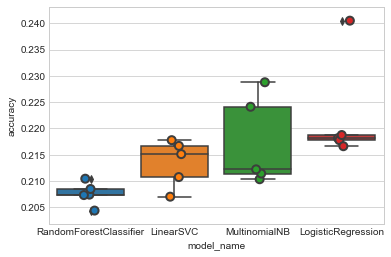

In [485]:
import seaborn as sns
sns.boxplot(x='model_name', y='accuracy', data=cv_df)
sns.stripplot(x='model_name', y='accuracy', data=cv_df, 
              size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()



In [486]:
cv_df.groupby('model_name').accuracy.mean()

model_name
LinearSVC                 0.213475
LogisticRegression        0.222358
MultinomialNB             0.217380
RandomForestClassifier    0.207618
Name: accuracy, dtype: float64

### Multinomial Naive Bayes and Logistic Regression performed better than the other two classifiers. But still the accuracy is below average.
accuracy=  #correct predictions by #total data points
       

### Using LinearSVC model to  print confusion matrix, and see the discrepancies between predicted and actual labels.

In [487]:
model = LinearSVC()
X_train, X_test, y_train, y_test, indices_train, indices_test = train_test_split(features, labels, train_data.index, test_size=0.33, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)


In [488]:
print('accuracy %s' % accuracy_score(y_pred, y_test))

accuracy 0.20887573964497042


#### I applied the chi-squared test to find the terms that are the most correlated with each of the labels:

In [489]:
model.fit(features, labels)
N = 2
for label, label_id in sorted(label_to_id.items()):
    indices = np.argsort(model.coef_[label_id])
    feature_names = np.array(tfidf_vect.get_feature_names())[indices]
    unigrams = [v for v in reversed(feature_names) if len(v.split(' ')) == 1][:N]
    bigrams = [v for v in reversed(feature_names) if len(v.split(' ')) == 2][:N]
    print("# '{}':".format(label))
    print("  . Top unigrams:\n       . {}".format('\n       . '.join(unigrams)))
    print("  . Top bigrams:\n       . {}".format('\n       . '.join(bigrams)))

# 'barely-true':
  . Top unigrams:
       . bid
       . mention
  . Top bigrams:
       . feder reserv
       . pay woman
# 'false':
  . Top unigrams:
       . debunk
       . destroy
  . Top bigrams:
       . trade plan
       . court nomine
# 'half-true':
  . Top unigrams:
       . mammogram
       . film
  . Top bigrams:
       . congress pass
       . money spend
# 'mostly-true':
  . Top unigrams:
       . gunfir
       . transfer
  . Top bigrams:
       . employ mandat
       . pay nation
# 'pants-fire':
  . Top unigrams:
       . transact
       . blue
  . Top bigrams:
       . stimulus creat
       . school spend
# 'true':
  . Top unigrams:
       . compens
       . sever
  . Top bigrams:
       . flop abort
       . obama say


### The classification report for each class:

In [490]:
from sklearn import metrics
print(confusion_matrix(y_test, y_pred))
print('\n')
print(metrics.classification_report(y_test, y_pred, target_names=train_data['label'].unique()))

[[166 121 131 105  90  47]
 [160 166 150  86 105  39]
 [112 140 162 113  78  32]
 [125 108 137  89  76  19]
 [108 139  98  91  85  32]
 [ 57  48  42  38  47  38]]


              precision    recall  f1-score   support

   half-true       0.23      0.25      0.24       660
 mostly-true       0.23      0.24      0.23       706
        true       0.23      0.25      0.24       637
       false       0.17      0.16      0.17       554
  pants-fire       0.18      0.15      0.16       553
 barely-true       0.18      0.14      0.16       270

   micro avg       0.21      0.21      0.21      3380
   macro avg       0.20      0.20      0.20      3380
weighted avg       0.21      0.21      0.21      3380



### Applying CountVectorizer to fit the training statements and apply Multinomial Naive Bayes to see if there is any marginal increase in accuracy

In [491]:
bow_transformer = CountVectorizer(analyzer=text_process).fit(train_data['stemmed'])

In [492]:
review_5 = train_data['statement'][4]
review_5

'The economic turnaround started at the end of my term.'

In [493]:
bow_5 = bow_transformer.transform([review_5])
print(bow_5)

  (0, 1668)	1
  (0, 5187)	1
  (0, 5386)	1


In [494]:
X = bow_transformer.transform(train_data['stemmed'])

In [495]:
X_test = bow_transformer.transform(test_data['stemmed'])

In [496]:
print('Shape of Sparse Matrix: ', X.shape)
print('Amount of Non-Zero occurrences: ', X.nnz)
# Percentage of non-zero values
density = (100.0 * X.nnz / (X.shape[0] * X.shape[1]))
print('Density: {}'.format((density)))

Shape of Sparse Matrix:  (10240, 5836)
Amount of Non-Zero occurrences:  71115
Density: 0.11899972958790267


In [497]:
from sklearn.model_selection import train_test_split


In [498]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(X, train_data['label'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [499]:
preds = nb.predict(X_test)

In [500]:
y_test = test_data['label']

In [501]:
print('accuracy %s' % accuracy_score(preds, y_test))

accuracy 0.22336227308603


In [502]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, preds))
print('\n')
print(classification_report(y_test, preds))

[[41 60 57 36  3 15]
 [33 56 81 48  7 24]
 [37 44 97 62  5 20]
 [30 37 74 63  1 36]
 [15 30 20 13  2 12]
 [22 43 61 53  5 24]]


              precision    recall  f1-score   support

 barely-true       0.23      0.19      0.21       212
       false       0.21      0.22      0.22       249
   half-true       0.25      0.37      0.30       265
 mostly-true       0.23      0.26      0.24       241
  pants-fire       0.09      0.02      0.03        92
        true       0.18      0.12      0.14       208

   micro avg       0.22      0.22      0.22      1267
   macro avg       0.20      0.20      0.19      1267
weighted avg       0.21      0.22      0.21      1267



### The model accuracy did not change much so it has to be improved by adding more features to train the model and using pipeline.


## To improve the model accuracy applied-
* ### Bagging 
* ### Boosting  
* ### Ensemble methods for Doc2vec model 

## Logistic Regression:
* Logistic Regression is used for Binary classifications (Sigmoid function gives probability of the two classes betweetn 0 and 1.
* For Multiclass predictions it works on different method like first predicting for two classes and then for other. 
#### Pros & Cons:
* In Multiclass Classifications its accuracy might be low when compared to other algorithms which is also seen below. But being a simple algorithm it is compuationally faster and faster to tune by hyper parameters

## Support Vector Machine with Doc2vec model

In [503]:
df_train_statements=train_data[['stemmed','label']]
model= Doc2Vec.load("doc2vec_model")
texts=[]
for x in df_train_statements['stemmed']:
    texts.append(model.infer_vector(x))

In [504]:
df_train_statements.label.unique()

array(['half-true', 'mostly-true', 'true', 'false', 'pants-fire',
       'barely-true'], dtype=object)

In [505]:
def replace_label(x):
    if (x == 'true' or x=='mostly-true' or x=='half-true'):
        return 1
    else:
        return 0
replace_label('true')

1

In [508]:
X=pd.DataFrame(texts)
y=df_train_statements['label'].map(lambda x:replace_label(x))
X_train,X_test,y_train,y_test=train_test_split(X, y,test_size = .3, random_state = 1)

In [509]:
modelSVC = LinearSVC()
modelSVC.fit(X_train, y_train)
svc_pred = modelSVC.predict(X_test)
s = pickle.dumps(modelSVC)

In [510]:
from sklearn.svm import SVC

In [511]:
classifier_conf = SVC(kernel='linear', probability=True)
classifier_conf.fit(X_train, y_train)



SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [512]:
from sklearn.metrics import accuracy_score, f1_score

print('Testing accuracy %s' % accuracy_score(y_test, svc_pred))
print('Testing F1 score: {}'.format(f1_score(y_test, svc_pred, average='weighted')))

Testing accuracy 0.5481770833333334
Testing F1 score: 0.39120916521119414


## KNeighborsClassifier:
K Nearest Neighbors classifies Data by finding the nearest data points to it measured by a distance function and then it assigns to the class which is most common amongst its K nearest neighbors

Pros & Cons:
Since it works on similaity measures it can Easily handle multi-class cases, hence this model is selected.

Since there is No generalization in this Algorithm so the Accuracy of model totally depends on the Accuracy, In our case since we have a good Training set we acheived a good accuracy of 51%

In [513]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)

In [514]:

from sklearn.model_selection import cross_val_score
knn_scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
print('The accuracy of the knn classifier with 10 fold cross-validation is ' + str(knn_scores.mean()))

The accuracy of the knn classifier with 10 fold cross-validation is 0.5159032826098814


In [515]:
print(knn_scores)

[0.52998605 0.49930265 0.53974895 0.51743375 0.50767085 0.48814505
 0.50627615 0.54393305 0.48743017 0.53910615]


In [516]:
knn_cv_mean = np.mean(knn_scores)
knn_cv_variance = np.var(knn_scores)

print('Knn Mean score : ', knn_cv_mean)
print('Knn Score variance : ', knn_cv_variance)

Knn Mean score :  0.5159032826098814
Knn Score variance :  0.00041105971729759846


## Random Forest: (Ensemble - bagging)
Since I was unable to acheive good accuracies by normal Models I opted to use Ensembles, A Bootstrap method. Especially in Random forest, it is a Bagging Model and it works by changing the algorithm for the way that the sub-trees are learned so that the resulting predictions from all of the subtrees have less correlation and overall accuracy is high

Pros & Cons:
Advantage of this method is we can acheive higher accuracies, but It can also lead to overfitting of the Model which needs to be taken care. Also, Random Forest can handle Missing values, although we repleaced missing values in our case, This Model can be used even with missing values

In [517]:
forest = RandomForestClassifier()
forest_scores = cross_val_score(forest, X_train, y_train, cv=10, scoring='accuracy')
print('The accuracy of the Random forest classifier with 10 fold cross-validation is ' + str(forest_scores.mean()))

The accuracy of the Random forest classifier with 10 fold cross-validation is 0.5117164551241594


In [518]:
print(forest_scores)

[0.50767085 0.48675035 0.50767085 0.53417015 0.48675035 0.52580195
 0.54532775 0.51603905 0.50418994 0.5027933 ]


In [519]:

forest_cv_mean = np.mean(forest_scores)
forest_cv_variance = np.var(forest_scores)

print('forest Mean score : ', forest_cv_mean)
print('forest Score variance : ', forest_cv_variance)

forest Mean score :  0.5117164551241594
forest Score variance :  0.00032665920004026135



### Gradient Boost: (Ensemble - Boosting)
It is a similar ensemble algorithm like Random forest, But it works in a iterative manner by selecting and creating one tree after another. In random forest all Decision trees are simultaneously perfomed. But here, We select featues of next iteration tree based on the Error rate and Feature importance obtained in one step

Pros & Cons:
Both Bias and Variance can be adjusted by doing hyper paramter tuning in this Ensemble method. So it gives us more flexibilty for tuning the Model and create Bias variance Tradeoff

In [520]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()

In [521]:
start_gb = time.time()

gb_scores = cross_val_score(gb, X, y, cv=10, scoring='accuracy')
print('The accuracy of the Random forest classifier with 10 fold cross-validation is ' + str(gb_scores.mean()))

end_gb =time.time()
gb_time = (end_gb-start_gb)/60
print('The time taken for the classifier for 10 fold cross validation is ' + str(gb_time))

The accuracy of the Random forest classifier with 10 fold cross-validation is 0.5517570687450826
The time taken for the classifier for 10 fold cross validation is 0.3408393661181132


### The accuracy increased to 55% with GradientBoosting

## Feature Importance:
Univariate feature selection:
This method works by selecting the best features based on univariate statistical tests. It performs chi2 test for different categorical Values to get the Feature weights as done below.

In [522]:
feature_names = train_data.columns # e.g. ['A', 'B', 'C', 'D', 'E']
#plt.xticks(range(heart_train.shape[1]), feature_names)

In [523]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

1. feature 11 (0.052839)
2. feature 2 (0.051353)
3. feature 3 (0.051191)
4. feature 10 (0.051157)
5. feature 17 (0.050683)
6. feature 16 (0.050643)
7. feature 0 (0.050595)
8. feature 12 (0.050551)
9. feature 14 (0.050538)
10. feature 8 (0.050364)
11. feature 13 (0.050355)
12. feature 18 (0.050323)
13. feature 4 (0.050216)
14. feature 19 (0.050059)
15. feature 15 (0.049878)
16. feature 6 (0.049202)
17. feature 5 (0.048184)
18. feature 1 (0.047868)
19. feature 7 (0.047827)
20. feature 9 (0.046176)


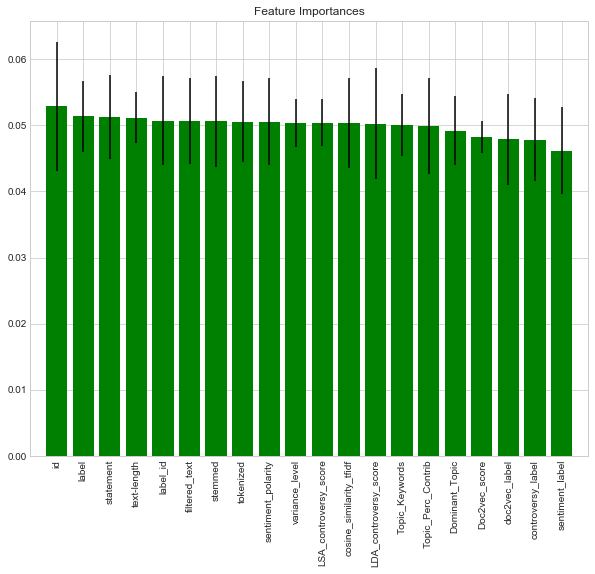

In [524]:
rcf = RandomForestClassifier()      
rcf = rcf.fit(X,y)
importances = rcf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rcf.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest

plt.figure(1, figsize=(10, 8))
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], color="g", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), feature_names, rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

<Figure size 720x576 with 0 Axes>

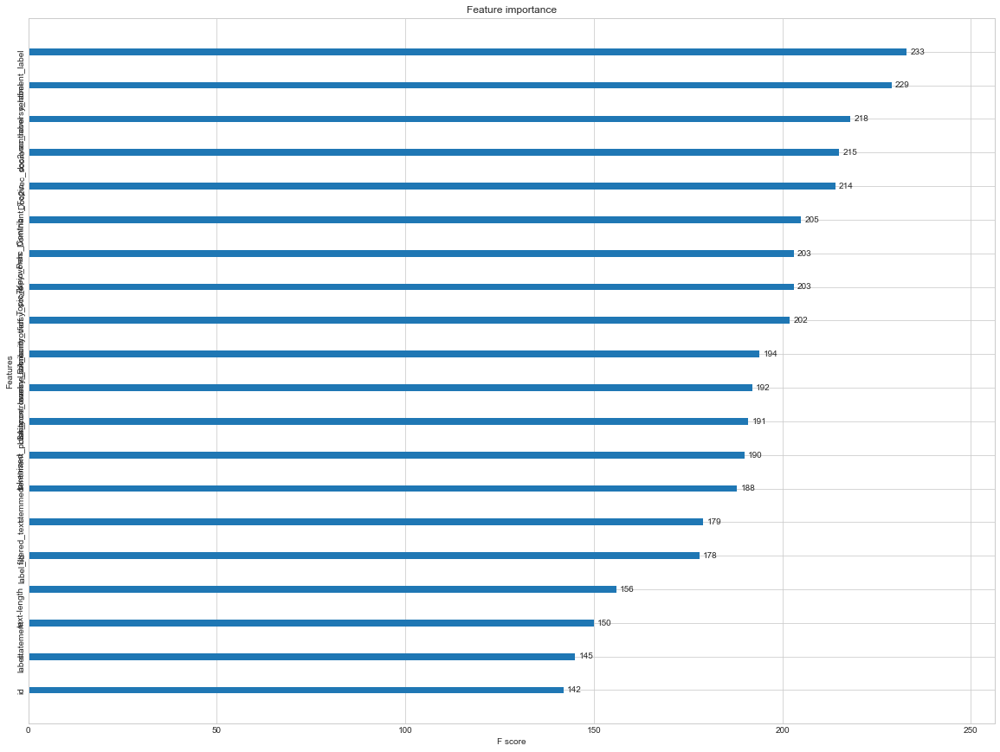

In [538]:

# plot feature importance using built-in function
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_importance
from matplotlib import pyplot

# fit model no training data
model = XGBClassifier()
model.fit(X, y)

fig = plt.figure(1, figsize=(10, 8))
plot_importance(model)
pyplot.rcParams['figure.figsize'] = [20, 15]
pyplot.yticks(range(X.shape[1]), feature_names, rotation=90)
pyplot.show()

### Applying K Fold model for computing Accuracy score

In [526]:
from sklearn.naive_bayes import GaussianNB
from sklearn import model_selection
seed = 7

LR: 0.561621 (0.017656)
KNN: 0.509570 (0.018692)
DTree: 0.507617 (0.012030)
NB: 0.554785 (0.019660)
SVM: 0.561719 (0.017910)


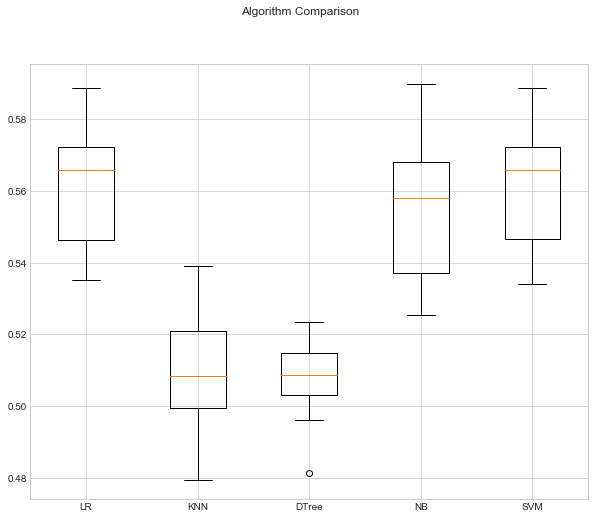

In [527]:
models = []
models.append(('LR', LogisticRegression(solver='lbfgs')))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTree', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=10, random_state=seed)
	cv_results = model_selection.cross_val_score(model, X, y, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure(1, figsize=(10, 8))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Got better accuracy using Logistic Regression and Support Vector Machine

### Hence, these models can be used to predict Controversy factor in news statements

## Accuracy

In [528]:
from sklearn.linear_model import LogisticRegression
logReg = LogisticRegression(C=100)
logReg.fit(X_train, y_train)
log_pred = logReg.predict(X_test)
import pickle
s = pickle.dumps(logReg)

In [529]:
from sklearn import metrics
print(metrics.classification_report(y_test,log_pred))

              precision    recall  f1-score   support

           0       0.50      0.01      0.01      1390
           1       0.55      1.00      0.71      1682

   micro avg       0.55      0.55      0.55      3072
   macro avg       0.52      0.50      0.36      3072
weighted avg       0.53      0.55      0.39      3072



In [530]:
from sklearn.metrics import accuracy_score, f1_score

print('Testing accuracy %s' % accuracy_score(y_test, log_pred))
print('Testing F1 score: {}'.format(f1_score(y_test, log_pred, average='weighted')))

Testing accuracy 0.5475260416666666
Testing F1 score: 0.39147645609440174


## Controversy Factor Calculator

In [531]:
model= Doc2Vec.load("doc2vec_model")
def controversy_factor_calculator(news):
    data_pred=[]
    data_pred.append(model.infer_vector(news))
    lrg_pa = pickle.loads(s)
    pred_conf=lrg_pa.predict_proba(data_pred)
    return pred_conf[0][1]

In [532]:
class ControversyPredictor:
    def __init__(self,news):
        self.news=news
    def predict(self):
        return controversy_checker(self.news)

In [533]:
df_train_statements['stemmed'][0]

'say anni list polit group support trimest abort demand'

In [534]:
controversy_factor_calculator("say anni list polit group support trimest abort demand")

0.5641762868165415

In [535]:
cols_of_interest = ['Doc2vec_score','variance_level']

X_doc = train_data[cols_of_interest]
y = train_data['label']
#X_doc

In [536]:
train_data_contro = train_data.head(1000)

## Export the following columns for common equation calculation

In [537]:
# import pandas
# import csv

header = ['Doc2vec_score', 'variance_level','label_id']
train_data_contro.to_csv('output_contro.csv', columns = header )

In [ ]:

dataset_sample_contro = pd.read_csv('output_contro.csv')

### The score received from the above method will be passed as factor to the final equation

## Calculating final weightage of Controversy factor

In [255]:

X = dataset_sample_contro[['label_id','Doc2vec_score','variance_level']]

cols_of_interest = ['Doc2vec_score','variance_level']

X_doc = X[cols_of_interest]
y = X['label_id']


print(X_doc.shape)
print(y.shape)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_doc, y, random_state=7,test_size = 0.3)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics


max_accuracy_controversy = 0
dict_threshold = {}
threshold_list = []
accuracy_list = []

for threshold in np.linspace(0,1,1000):

    clf=RandomForestClassifier(n_estimators=100)

    clf.fit(X_train,y_train)

    y_pred=clf.predict(X_test)
    accuracy = metrics.accuracy_score(y_test, y_pred)
    threshold_list.append(threshold)
    accuracy_list.append(accuracy)
    if accuracy > max_accuracy_controversy:
        max_accuracy_controversy = accuracy
        max_threshold_controversy= threshold
print("Max_accuracy",max_accuracy_controversy)
print("Max_threshold",max_threshold_controversy)

(1000, 2)
(1000,)
(700, 2)
(300, 2)
(700,)
(300,)
Max_accuracy 0.5166666666666667
Max_threshold 0.5415415415415415


### The Threshold and accuracy value will be passed to the final equation 

# Word2vec and T-Sne plot visualization

The Word to Vec model produces a vocabulary, with each word being represented by an n-dimensional numpy array (100 values in this case)

In [242]:
from gensim.models import word2vec
model = word2vec.Word2Vec(train_data['tokenized'], size=100, window=20, min_count=200, workers=4)
model.wv['say']

array([ 8.97732228e-02, -9.12332833e-02, -5.70640014e-03, -1.82182312e-01,
        4.01998162e-01, -1.07914926e-02,  2.70699650e-01,  8.71922597e-02,
       -2.66931385e-01, -4.72861528e-02, -2.00947165e-01,  1.14800274e-01,
        2.09195483e-02, -7.06674531e-03, -1.52910665e-01,  3.64686251e-02,
       -6.84501894e-04, -3.07149172e-01, -1.51863009e-01, -8.90646502e-02,
       -1.19121052e-01, -8.47933888e-02, -1.01475313e-01,  5.47171310e-02,
        1.97236821e-01,  1.07309468e-01, -1.47122324e-01,  1.32463008e-01,
       -6.99108541e-02, -1.02845915e-01,  2.11873546e-01, -2.11320221e-01,
        1.27085224e-01, -1.24198847e-01,  1.14950694e-01, -1.81139503e-02,
        3.07633523e-02,  5.71780056e-02,  3.93046886e-02, -2.14588001e-01,
        2.01966971e-01,  6.12944476e-02, -7.84085467e-02, -5.49449325e-02,
       -1.55607462e-01, -9.81183797e-02,  2.02765882e-01,  1.90251693e-02,
        3.48017435e-03, -2.67724305e-01,  3.51930678e-01,  3.30799401e-01,
       -7.53125781e-03,  

### T-sne plot visualization 

In [244]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

def tsne_plot(model):
    "Creates a TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

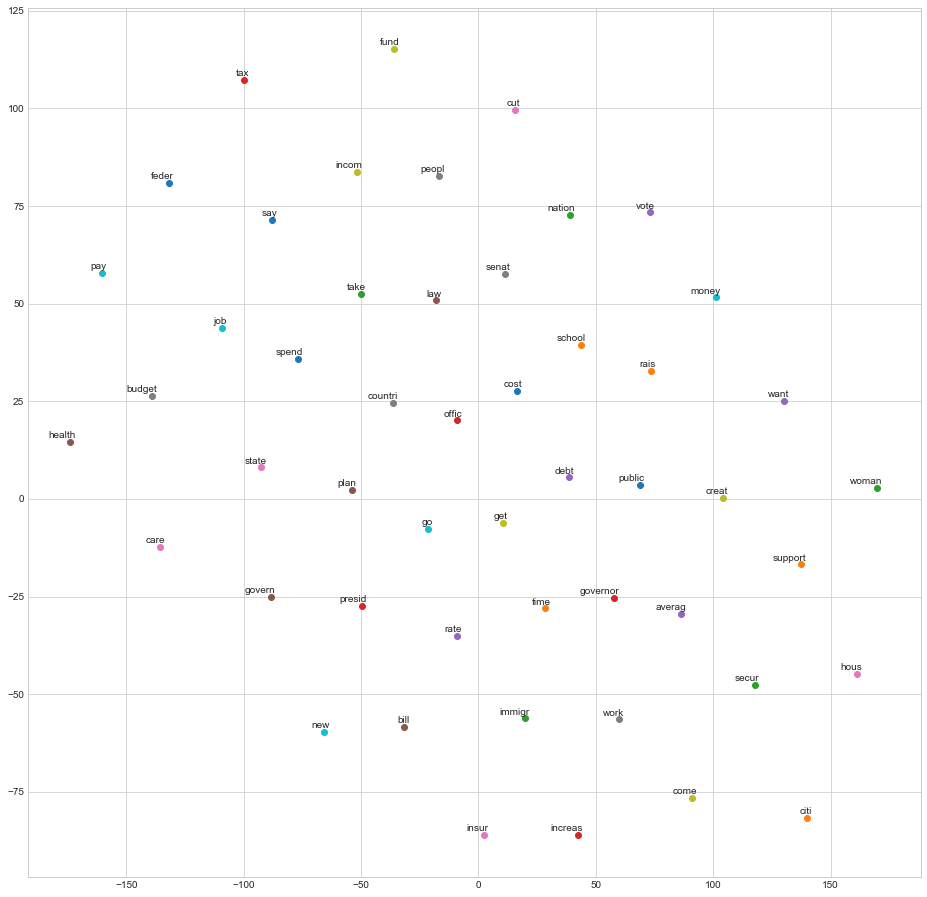

In [245]:
tsne_plot(model)

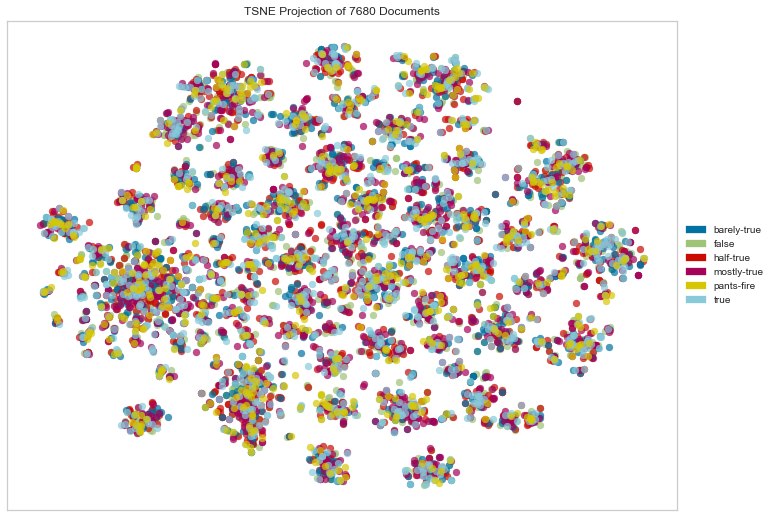

In [247]:
# Create the visualizer and draw the vectors
from yellowbrick.text import TSNEVisualizer
plt.figure(figsize = [15,9])
tsne = TSNEVisualizer()
tsne.fit(X_train_tfidf, y_train)
tsne.poof()

* ### T-Sne projection of documents
#### We can clearly see that different articles categories are almost overlapping, which means that we cannot expect highly accurate classification performance.

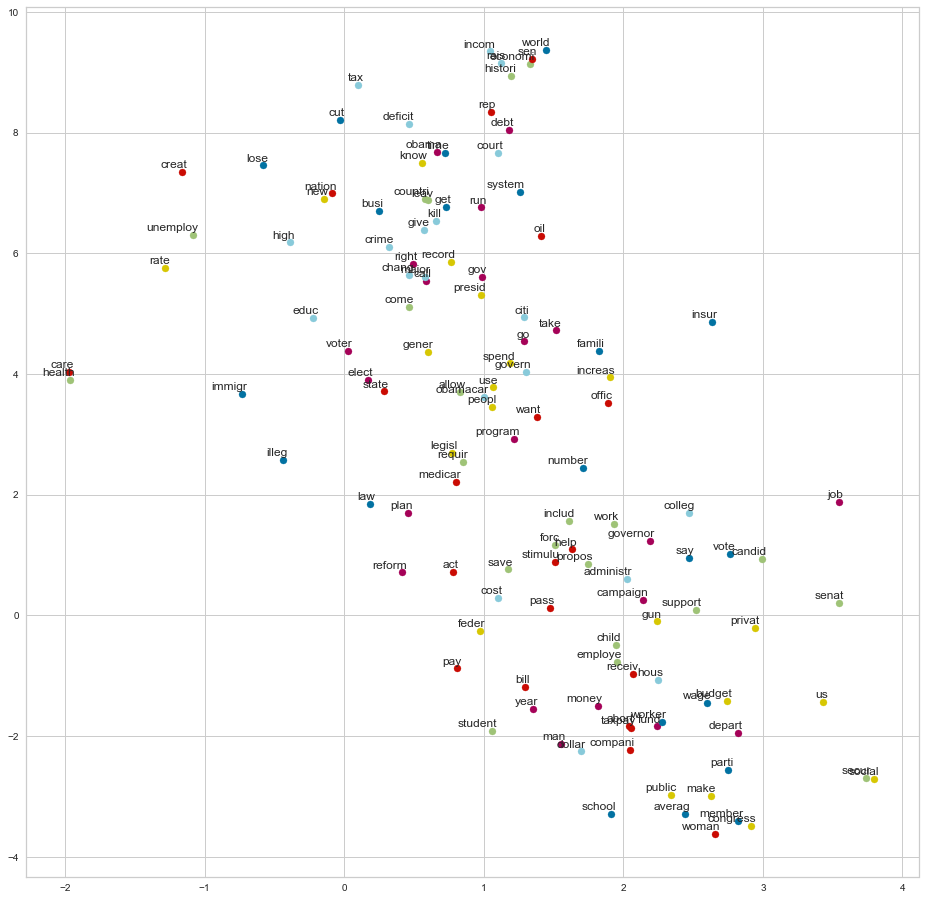

In [248]:
## A less selective model
model = word2vec.Word2Vec(train_data['tokenized'], size=100, window=20, min_count=100, workers=4)
tsne_plot(model)

#### Similar words are grouped together in the plot
#### t-SNE keeps nearby points in the high-dimensional space close to each other in the projected space.

In [251]:
model.most_similar('obama')

/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('forc', 0.9996665716171265),
 ('economi', 0.9996423721313477),
 ('help', 0.9996415972709656),
 ('presid', 0.9996177554130554),
 ('gov', 0.9996035099029541),
 ('use', 0.9995977878570557),
 ('time', 0.9995973706245422),
 ('give', 0.9995932579040527),
 ('leav', 0.9995921850204468),
 ('know', 0.999589204788208)]

In [252]:
model.most_similar('dollar')

/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('pay', 0.9995484352111816),
 ('year', 0.9995269775390625),
 ('obama', 0.9995247721672058),
 ('averag', 0.9995197057723999),
 ('man', 0.9995188117027283),
 ('work', 0.9995168447494507),
 ('save', 0.9995145201683044),
 ('famili', 0.9995079040527344),
 ('receiv', 0.9994833469390869),
 ('help', 0.9994813799858093)]

## Conclusion - 

#### Enriched dataset with following columns - 
* Sentiment_polarity - Using Vader Library. To detect sentiment-loaded language on news articles. I calculated the frequencies of negative/neutral/positive words for each article and use these as input for classifiers. Then, used the algorithm to train the emotion • polarity classifier (EP), using both the annotations and sentiment measures. I computed variance level by fiidng the differnce of positive and negative words.
* cosine_similarity_tfidf- When the documents are similar to the controversy vocabulary, it would imply that the statement is more controversial. The model accuracy was not great.
* LSA_controversy_score - The use of the LSA model shows a noticeable quality improvement compared to the use of the tfidf model.
* LDA_controversy_score - model implemented to capture the distribution of topics among news documents. I performed manual evaluations in order to understand the accuracy in similarity scores of the above Topic Models. ( LDA seems to be better than other scores)
* Doc2vec - After iplementing doc2vec model for analyzing the similarity between the controversial documents and news statements, I could analyse that Doc2vec peformed better than other models.

##### Applied following Distillation methods- 

* Sentiment Analysis
* Part of Speech Tagging
* Doc2vec
* LDA
* LSA
* Ranking


##### Applied following multiclass classification models-
* Logistic Regression 
* (Multinomial) Naive Bayes
* Support Vector Machine
* Random Forest models 
* K-nearest Neighbors
* Gradient Boosting

#### Accuracy scores
* Logistic Regression: 0.561816 
* KNearestNeighbor: 0.515918
* DecisionTree: 0.504785 
* NaiveBayes: 0.552344 
* SupportVectorMachine: 0.561719

### Logistic Regression and SVM gave higher accuracy scores

### Applied Doc2vec model for predicting Controversy level in news statements
Controversy score was computed by applying Doc2Vec, LDA, BOW and cosine similarity. The model was trained using Random Forest Classifier, which provided threshold as 0.27 and maximum accuracy as 0.51.

The final model is trained to predict the degree of controversy feature in the news statement and its corresponding weightage using the following method-
* A Random Classifier was built to find the weightage of each factor.
* A for loop iterates between 0 and 1 to pick the best possible threshold that would give the maximum accuracy for each factor.
* For each factor the model was trained with the factor score and label value in the dataset

Further Calculations for each factor have been performed at the Final section of the notebook. 


### References -
* https://msuweb.montclair.edu/~feldmana/publications/paper_64.pdf
* https://fzr72725.github.io/2018/01/14/genism-guide.html
* https://www.ijcai.org/proceedings/2017/0583.pdf
* https://medium.com/scaleabout/a-gentle-introduction-to-doc2vec-db3e8c0cce5e
* http://maroo.cs.umass.edu/getpdf.php?id=1118
* http://ijarcsse.com/Before_August_2017/docs/papers/Volume_7/4_April2017/V7I4-0124.pdf
* http://aclweb.org/anthology/N18-1171
* https://www.onlinejournal.in/IJIRV3I2/230.pdf
* https://petsymposium.org/2017/papers/issue1/paper06-2017-1-source.pdf
* https://nlp.stanford.edu/pubs/prabhakaran2016wiki.pdf
* https://dataskunkworks.com/2018/06/06/extracting-topics-from-11000-newsgroups-posts-with-python-gensim-and-lda/

## Alternus Vera - PART 3 
### Factor - Sensationalism

##### Author: Anjana Eldo
##### SJSU ID : 012488983

#### Team Psychic Pandas
#### We have decided to work on the following four factors:
* Sensationalism
* Topic Features
* Controversy
* Political affiliation/partisan bias

* I have taken sensationalism as a factor to determine how  much of sensationalism will contribute to a news being predicted as fake or not.
* I have referred the following articles and research papers to come up with a strategy to find sensationalism in the dataset.

    * http://www.angelfire.com/trek/puknews/refsnp.html
    * https://towardsdatascience.com/topic-modeling-and-latent-dirichlet-allocation-in-python-9bf156893c24
    * https://www.ijcai.org/proceedings/2017/0583.pdf
    * https://www.sciencedirect.com/science/article/pii/S0306457317300456
    * file:///Users/andrew/Downloads/Online_News_Media_Bias_Analysis_using_an_LDA-NLP_A.pdf
    * https://markroxor.github.io/gensim/static/notebooks/gensim_news_classification.html#topic=0&lambda=1&term=
    * https://github.com/lesley2958/natural-language-processing/tree/master/data
    * https://www.kaggle.com/gunnvant/what-india-reads-about-a-visual-essay/notebook
    * https://hookedondata.org/topic-modeling-the-new-york-times-and-trump/
    * https://github.com/robinsones/NYTimes-and-Trump/blob/master/Trump_NYTimes_Analysis.ipynb
    * http://aclweb.org/anthology/W18-6212
    * http://aclweb.org/anthology/W18-6212
    * http://www.aclweb.org/anthology/W17-2905
    
    

* I have also referred tabloid newspapers and yellow journalism to identify sensational topics and news articles which would inclide mostly towards a news being fake.





#### Importing all necessary packages

In [224]:
import pandas as pd
import numpy as np
import requests
import bs4
from bs4 import BeautifulSoup
import json
import re

import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from gensim.corpora import Dictionary
# preprocessing imports
from sklearn.preprocessing import LabelEncoder
from collections import Counter

import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *

from gensim.models.ldamulticore import LdaMulticore
from gensim.models.word2vec import Word2Vec
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
# hyperparameter training imports
from sklearn.model_selection import GridSearchCV

import nltk, string
import operator

import matplotlib.pyplot as plt
from textblob import TextBlob

from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.corpus import stopwords
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.tokenize import RegexpTokenizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

from sklearn.model_selection import cross_val_score
from scipy.sparse import hstack
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split

#### Importing data from files

In [37]:

train_df_1 = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/train.csv')
test_df = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/test_data.csv')

#### Adding column headers to the dataset

In [38]:
train_df_1.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]
test_df.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]


#### Studying the data distribution and visualizations of words in the dataset

In [40]:
train_df_1.label.value_counts()

half-true      2114
FALSE          1994
mostly-true    1962
TRUE           1676
barely-true    1654
pants-fire      839
Name: label, dtype: int64

#### Plotting the data

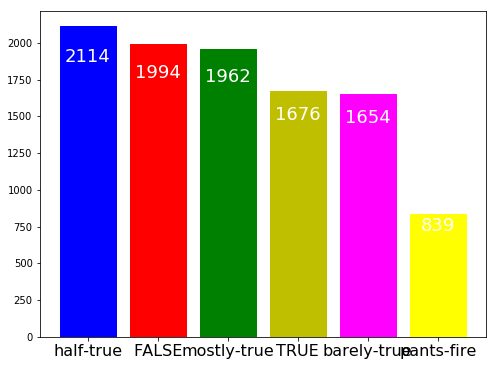

In [41]:
fig, ax = plt.subplots(1,1,figsize=(8,6))

news_label = train_df_1.label.value_counts()

ax.bar(range(6), news_label)
ax.set_xticks(range(6))
ax.set_xticklabels(news_label.index, fontsize=16)

for rect, c, value in zip(ax.patches, ['b', 'r', 'g','y','magenta','yellow'], news_label.values):
    rect.set_color(c)
    height = rect.get_height()
    width = rect.get_width()
    x_loc = rect.get_x()
    ax.text(x_loc + width/2, 0.9*height, value, ha='center', va='center', fontsize=18, color='white')

#### Inspect the number of words in the statement


* It is important to know the number of words in the document to see how good LDA result would be.

In [42]:
document_lengths = np.array(list(map(len, train_df_1.statement.str.split(' '))))

In [43]:
print("The average number of words in a document is: {}.".format(np.mean(document_lengths)))
print("The minimum number of words in a document is: {}.".format(min(document_lengths)))
print("The maximum number of words in a document is: {}.".format(max(document_lengths)))

The average number of words in a document is: 17.9707979294853.
The minimum number of words in a document is: 2.
The maximum number of words in a document is: 302.


* As we can see there is a document with just 2 words.

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


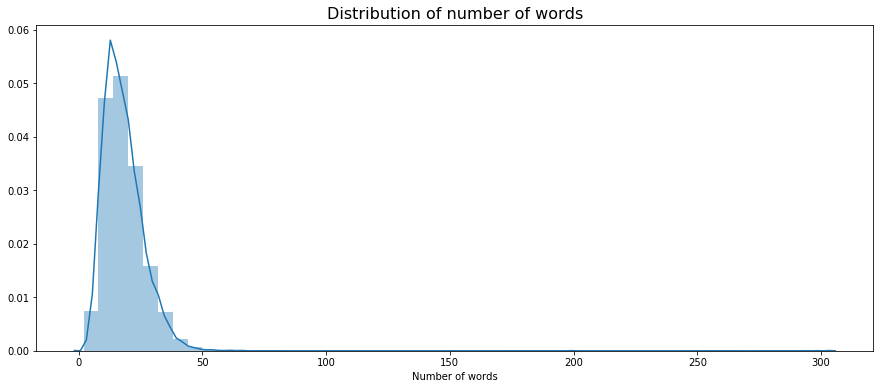

In [44]:
fig, ax = plt.subplots(figsize=(15,6))

ax.set_title("Distribution of number of words", fontsize=16)
ax.set_xlabel("Number of words")
sns.distplot(document_lengths, bins=50, ax=ax);

* There are very few documents with words more than 50.So lets see the documents with fewer words.

In [45]:
print("There are {} documents with over 50 words.".format(sum(document_lengths > 50)))

shorter_documents = document_lengths[document_lengths <= 50]

There are 19 documents with over 50 words.


/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


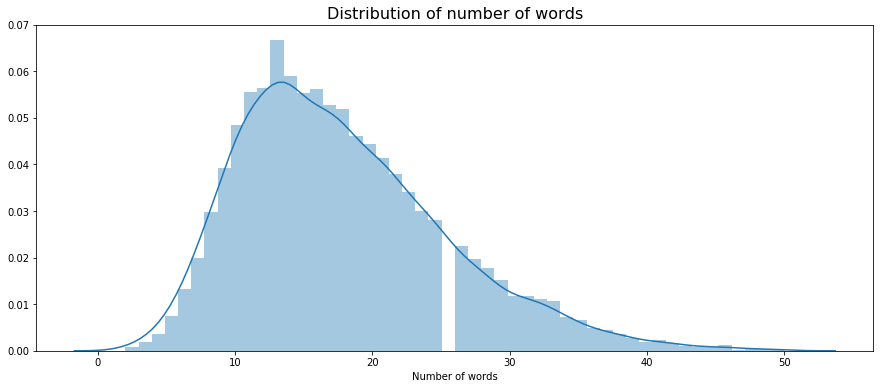

In [46]:
fig, ax = plt.subplots(figsize=(15,6))

ax.set_title("Distribution of number of words", fontsize=16)
ax.set_xlabel("Number of words")
sns.distplot(shorter_documents, bins=50, ax=ax);

* Documents with less number of words will be difficult to classify.Lets look at what these documents are

In [47]:
print("There are {} documents with tops 5 words.".format(sum(document_lengths <= 5)))

There are 136 documents with tops 5 words.


In [48]:
train_df_1[document_lengths == 2]

,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context
708,5919.json,FALSE,On abortion,"abortion,corrections-and-updates",mitt-romney,Former governor,Massachusetts,republican,34.0,32.0,58.0,33.0,19.0,various statements
1013,8882.json,half-true,On abortion,"abortion,candidates-biography",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,various statements
1070,630.json,TRUE,On torture.,military,john-mccain,U.S. senator,Arizona,republican,31.0,39.0,31.0,37.0,8.0,NaN
2939,1552.json,FALSE,On reconciliation,"bipartisanship,health-care,legal-issues",barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,campaign speeches
6130,4493.json,FALSE,Were bankrupt.,"economy,federal-budget",gary-johnson,Presidential candidate,New Mexico,libertarian,3.0,2.0,5.0,6.0,0.0,"a Republican presidential debate in Orlando, Fla."
6526,4297.json,FALSE,On abortion.,abortion,susan-combs,State comptroller,Texas,republican,0.0,1.0,0.0,0.0,1.0,an interview
6758,995.json,half-true,On torture.,"human-rights,terrorism",newt-gingrich,"Co-host on CNN's ""Crossfire""",Georgia,republican,16.0,15.0,20.0,10.0,11.0,a news interview
7637,6862.json,FALSE,On sequestration,"debt,federal-budget",eric-cantor,House Majority Leader,Virginia,republican,9.0,6.0,4.0,4.0,4.0,a debate.


* So the statements with 2 words actually make sense. So i thought to keep it so that i can compare with sensationalism vocabulary i have created.
* Though there are documents with few words they are meaningful and can be used to create an LDA model.

## Data Prepocessing  - for LDA and word2vec model

In [49]:
our_special_word = 'qwerty'
def remove_ascii_words(df):
    """ removes non-ascii characters from the 'texts' column in df.
    It returns the words containig non-ascii characers.
    """
    non_ascii_words = []
    for i in range(len(df)):
        for word in df.loc[i, 'statement'].split(' '):
            if any([ord(character) >= 128 for character in word]):
                non_ascii_words.append(word)
                df.loc[i, 'statement'] = df.loc[i, 'statement'].replace(word, our_special_word)
    return non_ascii_words

non_ascii_words = remove_ascii_words(train_df_1)

print("Replaced {} words with characters with an ordinal >= 128 in the train data.".format(
    len(non_ascii_words)))

Replaced 6 words with characters with an ordinal >= 128 in the train data.


In [50]:
def get_good_tokens(sentence):
    replaced_punctation = list(map(lambda token: re.sub('[^0-9A-Za-z!?]+', '', token), sentence))
    removed_punctation = list(filter(lambda token: token, replaced_punctation))
    return removed_punctation

In [51]:
def w2v_preprocessing(df):
    """ All the preprocessing steps for word2vec are done in this function.
    All mutations are done on the dataframe itself. So this function returns
    nothing.
    """
    df['statement'] = df.statement.str.lower()
    df['document_sentences'] = df.statement.str.split('.')  # split texts into individual sentences
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(map(nltk.word_tokenize, sentences)),
                                         df.document_sentences))  # tokenize sentences
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(map(get_good_tokens, sentences)),
                                         df.tokenized_sentences))  # remove unwanted characters
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(filter(lambda lst: lst, sentences)),
                                         df.tokenized_sentences))  # remove empty lists

w2v_preprocessing(train_df_1)

In [52]:
def lda_get_good_tokens(df):
    df['statement'] = df.statement.str.lower()
    df['tokenized_text'] = list(map(nltk.word_tokenize, df.statement))
    df['tokenized_text'] = list(map(get_good_tokens, df.tokenized_text))

lda_get_good_tokens(train_df_1)

In [53]:
tokenized_only_dict = Counter(np.concatenate(train_df_1.tokenized_text.values))

tokenized_only_df = pd.DataFrame.from_dict(tokenized_only_dict, orient='index')
tokenized_only_df.rename(columns={0: 'count'}, inplace=True)

In [54]:
tokenized_only_df.sort_values('count', ascending=False, inplace=True)

#### Depending on the frequency of the occurance of words a graph is plotted to understand the distribution of how often words occur

* Just to understand the word distribution and how often a word occurs I plotted a bar graph

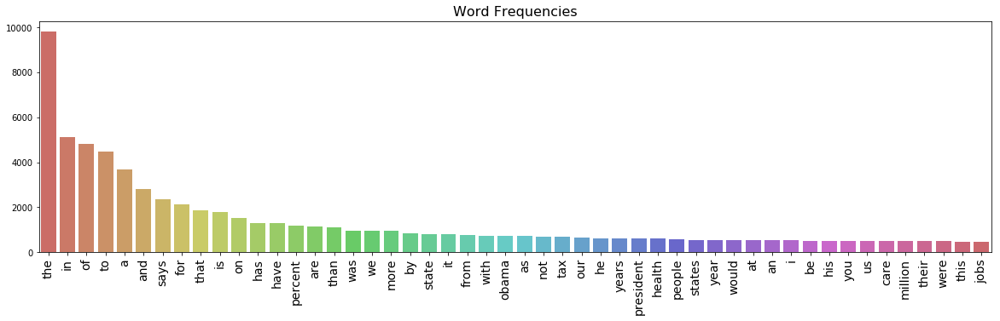

In [55]:
def word_frequency_barplot(df, nr_top_words=50):
    """ df should have a column named count.
    """
    fig, ax = plt.subplots(1,1,figsize=(20,5))

    sns.barplot(list(range(nr_top_words)), df['count'].values[:nr_top_words], palette='hls', ax=ax)

    ax.set_xticks(list(range(nr_top_words)))
    ax.set_xticklabels(df.index[:nr_top_words], fontsize=14, rotation=90)
    return ax
    
ax = word_frequency_barplot(tokenized_only_df)
ax.set_title("Word Frequencies", fontsize=16);

### Removing Stopwords

In [56]:
def remove_stopwords(df):
    """ Removes stopwords based on a known set of stopwords
    available in the nltk package. In addition, we include our
    made up word in here.
    """
    # Luckily nltk already has a set of stopwords that we can remove from the texts.
    stopwords = nltk.corpus.stopwords.words('english')
    # we'll add our own special word in here 'qwerty'
    stopwords.append(our_special_word)

    df['stopwords_removed'] = list(map(lambda doc:
                                       [word for word in doc if word not in stopwords],
                                       df['tokenized_text']))

remove_stopwords(train_df_1)

In [57]:
def stem_words(df):
    lemm = nltk.stem.WordNetLemmatizer()
    df['lemmatized_text'] = list(map(lambda sentence:
                                     list(map(lemm.lemmatize, sentence)),
                                     df.stopwords_removed))

    p_stemmer = nltk.stem.porter.PorterStemmer()
    df['stemmed_text'] = list(map(lambda sentence:
                                  list(map(p_stemmer.stem, sentence)),
                                  df.lemmatized_text))

stem_words(train_df_1)

In [58]:
dictionary = Dictionary(documents=train_df_1.stemmed_text.values)

print("Found {} words.".format(len(dictionary.values())))

Found 9388 words.


In [59]:
dictionary.filter_extremes(no_above=0.8, no_below=3)

dictionary.compactify()  # Reindexes the remaining words after filtering
print("Left with {} words.".format(len(dictionary.values())))

Left with 3859 words.


In [60]:
def document_to_bow(df):
    df['bow'] = list(map(lambda doc: dictionary.doc2bow(doc), df.stemmed_text))
    
document_to_bow(train_df_1)

In [61]:
cleansed_words_df = pd.DataFrame.from_dict(dictionary.token2id, orient='index')
cleansed_words_df.rename(columns={0: 'id'}, inplace=True)

cleansed_words_df['count'] = list(map(lambda id_: dictionary.dfs.get(id_), cleansed_words_df.id))
del cleansed_words_df['id']

In [62]:
cleansed_words_df.sort_values('count', ascending=False, inplace=True)

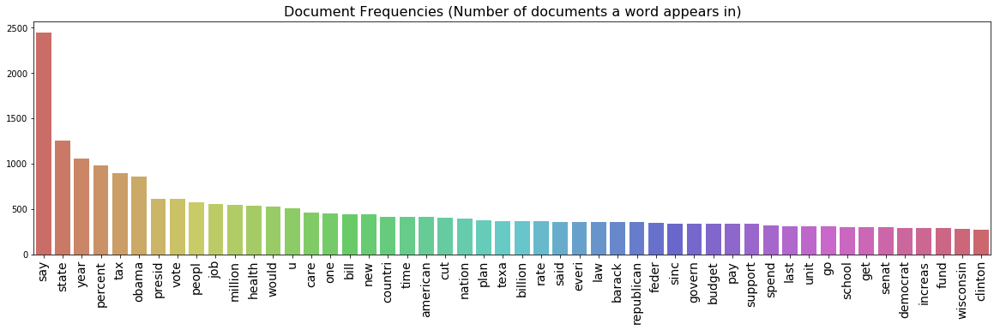

In [63]:
ax = word_frequency_barplot(cleansed_words_df)
ax.set_title("Document Frequencies (Number of documents a word appears in)", fontsize=16);

##### Next I wanted to see how many of these words contribute to news being false,true,partially true etc

In [66]:
half_true_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'half-true', 'stemmed_text'].values))
false_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'FALSE', 'stemmed_text'].values))
mostly_true_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'mostly-true', 'stemmed_text'].values))
true_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'TRUE', 'stemmed_text'].values))
barely_true_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'barely-true', 'stemmed_text'].values))
pants_fire_words = list(np.concatenate(train_df_1.loc[train_df_1.label == 'pants-fire', 'stemmed_text'].values))

In [68]:
half_true_frequencies = {word: half_true_words.count(word) for word in cleansed_words_df.index[:50]}
false_frequencies = {word: false_words.count(word) for word in cleansed_words_df.index[:50]}
mostly_true_frequencies = {word: mostly_true_words.count(word) for word in cleansed_words_df.index[:50]}
true_frequencies = {word: true_words.count(word) for word in cleansed_words_df.index[:50]}
barely_true_frequencies = {word: barely_true_words.count(word) for word in cleansed_words_df.index[:50]}
pants_fire_frequencies = {word: pants_fire_words.count(word) for word in cleansed_words_df.index[:50]}

In [69]:
frequencies_df = pd.DataFrame(index=cleansed_words_df.index[:50])

In [70]:
frequencies_df['half_true_freq'] = list(map(lambda word:
                                      half_true_frequencies[word],
                                      frequencies_df.index))
frequencies_df['half_true_false_freq'] = list(map(lambda word:
                                          half_true_frequencies[word] + false_frequencies[word],
                                          frequencies_df.index))
frequencies_df['half_true_false_mostly_true_freq'] = list(map(lambda word:
                                              half_true_frequencies[word] + false_frequencies[word] + mostly_true_frequencies[word],
                                              frequencies_df.index))
frequencies_df['half_true_false_mostly_true_true_freq'] = list(map(lambda word:
                                              half_true_frequencies[word] + false_frequencies[word] + mostly_true_frequencies[word]
                                                                   +true_frequencies[word],
                                              frequencies_df.index))
frequencies_df['half_true_false_mostly_true_true__barely_true_freq'] = list(map(lambda word:
                                              half_true_frequencies[word] + false_frequencies[word] + mostly_true_frequencies[word]
                                                                   +true_frequencies[word]+barely_true_frequencies[word],
                                              frequencies_df.index))

frequencies_df['half_true_false_mostly_true_true__barely_true_pants_fire_freq'] = list(map(lambda word:
                                              half_true_frequencies[word] + false_frequencies[word] + mostly_true_frequencies[word]
                                                                   +true_frequencies[word]+barely_true_frequencies[word]+pants_fire_frequencies[word],
                                              frequencies_df.index))

###### The distribution of articles baseed on the label whether it is true or false and which words contribute to detecting that factor can visualized from the below graph.

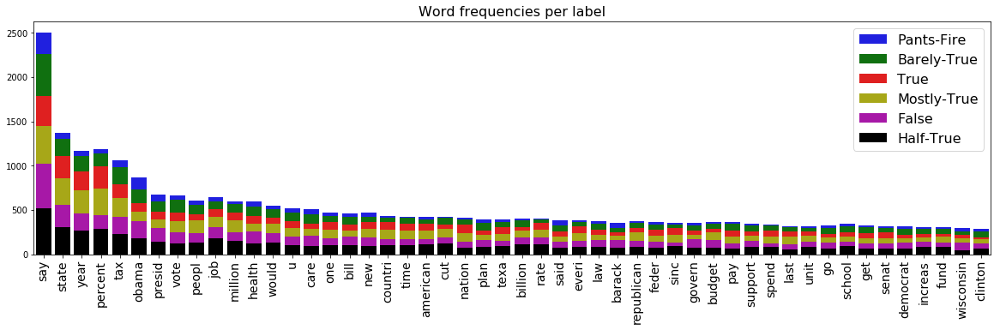

In [71]:
fig, ax = plt.subplots(1,1,figsize=(20,5))

nr_top_words = len(frequencies_df)
nrs = list(range(nr_top_words))
sns.barplot(nrs, frequencies_df['half_true_false_mostly_true_true__barely_true_pants_fire_freq'].values, color='b', ax=ax, label="Pants-Fire")
sns.barplot(nrs, frequencies_df['half_true_false_mostly_true_true__barely_true_freq'].values, color='g', ax=ax, label="Barely-True")
sns.barplot(nrs, frequencies_df['half_true_false_mostly_true_true_freq'].values, color='r', ax=ax, label="True")
sns.barplot(nrs, frequencies_df['half_true_false_mostly_true_freq'].values, color='y', ax=ax, label="Mostly-True")
sns.barplot(nrs, frequencies_df['half_true_false_freq'].values, color='m', ax=ax, label="False")
sns.barplot(nrs, frequencies_df['half_true_freq'].values, color='black', ax=ax, label="Half-True")

ax.set_title("Word frequencies per label", fontsize=16)
ax.legend(prop={'size': 16})
ax.set_xticks(nrs)
ax.set_xticklabels(frequencies_df.index, fontsize=14, rotation=90);

### Creation of My Vocabulary

###### I have referred various websites , yellow journalism, tabloid newspapers to dervice a set of sensational topics and also combining the words from the train dataset which resutls in fake and pants on fire news.

In [72]:
sensational_words_addition = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/sensational_words.csv')
sensational_words_from_train = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/sensational_words_from_train.csv')
                                                    

In [73]:

sensational_words_addition['Phrases'].replace('', np.nan, inplace=True)
sensational_words_from_train['Phrases'].replace('', np.nan, inplace=True)

In [74]:
sensational_words_addition = sensational_words_addition['Phrases'].dropna()
sensational_words_from_train= sensational_words_from_train['Phrases'].dropna()

In [75]:
frames = [sensational_words_addition, sensational_words_from_train]
sensational_words = pd.concat(frames)

In [76]:
sensational_words

0              Assassination
1                     Attack
2          Domestic security
3            Law enforcement
4                   Disaster
5      National preparedness
6                   Response
7                   Recovery
8         Emergency response
9            First responder
10                   Militia
11                  Shooting
12                Evacuation
13                   Hostage
14                 Explosion
15           Organized crime
16                     Gangs
17         National security
18        State of emergency
19           Security breach
20                    Threat
21                  Standoff
22                  Lockdown
23                      Bomb
24                      Riot
25         Emergency Landing
26                  Incident
27                Suspicious
28            Nuclear threat
29                 Hazardous
               ...          
146               nomination
147                  machine
148                 finances
149           

#### Data Preprocessing
* Next step is to prepare the data by removing all punctuations,stopwords etc
* At first, tokenization is applied to split the text we have just got to sentences and then sentences to words.
* Next, it is converted to lowercase
* Then Lemmatization is applied to change all past and future words to present and also changes words with third person to first
* Next step os to apply Stemming whre words are changed to their root form

* For preprocessing, genism library is imported.

### Function to carry out lemmetization and stemming

In [77]:
def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

### Processing all the articles in the set¶

In [78]:
se = pd.Series(sensational_words)

In [79]:
processed_statement = se.map(preprocess)
processed_statement[:5]

0         [assassin]
1           [attack]
2    [domest, secur]
3           [enforc]
4           [disast]
Name: Phrases, dtype: object

In [80]:
dictionary = gensim.corpora.Dictionary(processed_statement)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 assassin
1 attack
2 domest
3 secur
4 enforc
5 disast
6 nation
7 prepared
8 respons
9 recoveri
10 emerg


### Bags of words on the processed dataset

* Creating a dictionary of words from the processed data that we got above

### Using bow2Vec

In [81]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_statement]
bow_corpus[5]

[(6, 1), (7, 1)]

In [82]:
bow_doc_5 = bow_corpus[5]
for i in range(len(bow_doc_5)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_5[i][0], 
                                               dictionary[bow_doc_5[i][0]], 
bow_doc_5[i][1]))

Word 6 ("nation") appears 1 time.
Word 7 ("prepared") appears 1 time.


### Applying TF-IDF to bow_corpus

In [83]:
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
from pprint import pprint
for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 1.0)]


### Applying LDA to bow_corpus

* LDA model has been trained with the processed statements from the dataset and my vocabulary

In [84]:
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=4, id2word=dictionary, passes=2, workers=2)

### Applying LDA for Bag Of Words¶

In [85]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.024*"emerg" + 0.024*"secur" + 0.016*"nation" + 0.016*"infrastructur" + 0.016*"respons" + 0.016*"servic" + 0.016*"price" + 0.016*"shoot" + 0.016*"islam" + 0.014*"weather"
Topic: 1 
Words: 0.028*"attack" + 0.023*"cyber" + 0.023*"nuclear" + 0.016*"secur" + 0.016*"explos" + 0.016*"transport" + 0.016*"threat" + 0.016*"disast" + 0.016*"lotteri" + 0.014*"market"
Topic: 2 
Words: 0.025*"state" + 0.023*"terror" + 0.010*"drug" + 0.010*"infrastructur" + 0.010*"cartel" + 0.010*"critic" + 0.010*"retir" + 0.010*"foreign" + 0.010*"civil" + 0.010*"censu"
Topic: 3 
Words: 0.017*"chang" + 0.017*"crime" + 0.017*"financ" + 0.009*"climat" + 0.009*"organ" + 0.009*"prepared" + 0.009*"domest" + 0.009*"contamin" + 0.009*"shootout" + 0.009*"sign"


### Applying LDA on TF-IDF

In [86]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=4, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.026*"terror" + 0.022*"attack" + 0.020*"nuclear" + 0.017*"cyber" + 0.015*"shoot" + 0.014*"secur" + 0.014*"transport" + 0.011*"suicid" + 0.008*"lighten" + 0.008*"debat"
Topic: 1 Word: 0.018*"financ" + 0.016*"infrastructur" + 0.015*"climat" + 0.013*"nation" + 0.010*"abort" + 0.010*"wealth" + 0.010*"hunger" + 0.010*"transpar" + 0.010*"agricultur" + 0.010*"worker"
Topic: 2 Word: 0.023*"state" + 0.017*"islam" + 0.010*"illeg" + 0.010*"weather" + 0.010*"israel" + 0.010*"rule" + 0.010*"ethic" + 0.010*"news" + 0.010*"corpor" + 0.010*"violenc"
Topic: 3 Word: 0.018*"lotteri" + 0.016*"respons" + 0.016*"servic" + 0.016*"secur" + 0.013*"price" + 0.013*"emerg" + 0.010*"threat" + 0.010*"disast" + 0.010*"privaci" + 0.010*"strand"


### Passing the statement news to the LDA model

In [87]:
for index, score in sorted(lda_model[bow_corpus[10]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.6243836879730225	 
Topic: 0.024*"emerg" + 0.024*"secur" + 0.016*"nation" + 0.016*"infrastructur" + 0.016*"respons" + 0.016*"servic" + 0.016*"price" + 0.016*"shoot" + 0.016*"islam" + 0.014*"weather"

Score: 0.12521924078464508	 
Topic: 0.025*"state" + 0.023*"terror" + 0.010*"drug" + 0.010*"infrastructur" + 0.010*"cartel" + 0.010*"critic" + 0.010*"retir" + 0.010*"foreign" + 0.010*"civil" + 0.010*"censu"

Score: 0.12520001828670502	 
Topic: 0.017*"chang" + 0.017*"crime" + 0.017*"financ" + 0.009*"climat" + 0.009*"organ" + 0.009*"prepared" + 0.009*"domest" + 0.009*"contamin" + 0.009*"shootout" + 0.009*"sign"

Score: 0.12519706785678864	 
Topic: 0.028*"attack" + 0.023*"cyber" + 0.023*"nuclear" + 0.016*"secur" + 0.016*"explos" + 0.016*"transport" + 0.016*"threat" + 0.016*"disast" + 0.016*"lotteri" + 0.014*"market"


In [89]:
train_df_1['statement']= train_df_1['statement'].str.replace('\d+', '')
train_df_1['statement'] = train_df_1['statement'].replace('[^a-zA-Z0-9]', ' ', regex = True)

In [91]:
processed_statement = train_df_1['statement'].map(preprocess)

In [92]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_statement]

In [93]:
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=3, id2word=dictionary, passes=2, workers=2)

In [94]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.071*"job" + 0.058*"obama" + 0.044*"tax" + 0.036*"famili" + 0.036*"immigr" + 0.032*"medicar" + 0.030*"hous" + 0.024*"illeg" + 0.023*"economi" + 0.022*"candid"
Topic: 1 
Words: 0.169*"state" + 0.083*"obama" + 0.070*"vote" + 0.054*"feder" + 0.040*"govern" + 0.031*"busi" + 0.021*"abort" + 0.018*"tax" + 0.017*"record" + 0.015*"job"
Topic: 2 
Words: 0.077*"health" + 0.067*"care" + 0.052*"state" + 0.044*"nation" + 0.042*"support" + 0.038*"budget" + 0.036*"vote" + 0.027*"public" + 0.027*"elect" + 0.026*"debt"


In [95]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=3, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.024*"terror" + 0.014*"nuclear" + 0.013*"disast" + 0.012*"respons" + 0.011*"chang" + 0.011*"cyber" + 0.010*"servic" + 0.009*"emerg" + 0.008*"weather" + 0.008*"forest"
Topic: 1 Word: 0.016*"state" + 0.015*"attack" + 0.012*"financ" + 0.011*"threat" + 0.010*"crime" + 0.010*"market" + 0.010*"explos" + 0.009*"nation" + 0.009*"emerg" + 0.007*"gang"
Topic: 2 Word: 0.020*"secur" + 0.013*"lotteri" + 0.013*"shoot" + 0.013*"price" + 0.012*"islam" + 0.012*"transport" + 0.008*"evacu" + 0.008*"suspici" + 0.008*"shootout" + 0.008*"fact"


In [96]:
for index, score in sorted(lda_model[bow_corpus[10]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.658038318157196	 
Topic: 0.169*"state" + 0.083*"obama" + 0.070*"vote" + 0.054*"feder" + 0.040*"govern" + 0.031*"busi" + 0.021*"abort" + 0.018*"tax" + 0.017*"record" + 0.015*"job"

Score: 0.1725345104932785	 
Topic: 0.077*"health" + 0.067*"care" + 0.052*"state" + 0.044*"nation" + 0.042*"support" + 0.038*"budget" + 0.036*"vote" + 0.027*"public" + 0.027*"elect" + 0.026*"debt"

Score: 0.16942723095417023	 
Topic: 0.071*"job" + 0.058*"obama" + 0.044*"tax" + 0.036*"famili" + 0.036*"immigr" + 0.032*"medicar" + 0.030*"hous" + 0.024*"illeg" + 0.023*"economi" + 0.022*"candid"


In [97]:
for index, score in sorted(lda_model_tfidf[bow_corpus[10]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.6634824275970459	 
Topic: 0.020*"secur" + 0.013*"lotteri" + 0.013*"shoot" + 0.013*"price" + 0.012*"islam" + 0.012*"transport" + 0.008*"evacu" + 0.008*"suspici" + 0.008*"shootout" + 0.008*"fact"

Score: 0.16827893257141113	 
Topic: 0.024*"terror" + 0.014*"nuclear" + 0.013*"disast" + 0.012*"respons" + 0.011*"chang" + 0.011*"cyber" + 0.010*"servic" + 0.009*"emerg" + 0.008*"weather" + 0.008*"forest"

Score: 0.16823868453502655	 
Topic: 0.016*"state" + 0.015*"attack" + 0.012*"financ" + 0.011*"threat" + 0.010*"crime" + 0.010*"market" + 0.010*"explos" + 0.009*"nation" + 0.009*"emerg" + 0.007*"gang"


#### Testing on an Unseen Document¶

In [98]:
unseen_document = 'Says he won the second debate with Hillary Clinton in a landslide in every poll.'
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
score_list = []
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    score_list.append(score)
    print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))

Score: 0.7758188843727112	 Topic: 0.077*"health" + 0.067*"care" + 0.052*"state" + 0.044*"nation" + 0.042*"support"
Score: 0.11253645271062851	 Topic: 0.169*"state" + 0.083*"obama" + 0.070*"vote" + 0.054*"feder" + 0.040*"govern"
Score: 0.1116446852684021	 Topic: 0.071*"job" + 0.058*"obama" + 0.044*"tax" + 0.036*"famili" + 0.036*"immigr"


## Summary of LDA model

* At first I trained the lda model with the dictionary of words and checked the topics being grenerated both with bag of words and tfidf
* LDA with tfidf gave a better score. So next I trained the model with the statements in the training data set and the vocabulary created by me
* For this also LDA with TF-IDF gave a better generation of topics.
* So I took this model to get the top most topics and formed an equation that would give me percentage of sensationalism for each statement.

#### Calculating the sensationalism percentage from forming an equation

In [99]:
#train_df_1['Sensationalism Percentage'] = None
#for i,row in train_df_1.iterrows():
    #if(i<1001):
       # print(i)
       # unseen_document = row['statement']
        #bow_vector = my_dictionary.doc2bow(preprocess(unseen_document))
        #score_list = []
        #for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
           # score_list.append(score)
        #score_final = (0.8)*score_list[0]+score_list[1];
        #print(score_final)
    ##print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))
        #train_df_1['Sensationalism Percentage'][i] = score_final

In [100]:
#train_df_1.to_csv('train_enriched.csv', sep='\t')

In [258]:
train_enriched = pd.read_csv('train_enriched_new.csv',sep='\t')

In [259]:
train_enriched.head(5)

,Unnamed: 0,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context,Sensationalism Percentage
0,0,2635.json,false,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0.624344
1,1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,0.812235
2,2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,0.416889
3,3,1123.json,false,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0.456993
4,4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,0.250000


### Data Enrichement by adding sensationalism weightage to the dataset¶

In [105]:
train_data = pd.read_csv('train_enriched_new.csv',sep='\t', header = None)

In [106]:
train_data = train_data.iloc[1:]
train_data = train_data.drop(0,axis=1)

In [107]:
train_data.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context","Sensationalism_Percentage"]

In [115]:
train_data_v1= train_data.head(1000)

### Repeating the same steps for test_data¶

In [109]:
#test_df['Sensationalism Percentage'] = None
#for i,row in test_df.iterrows():
    #if(i<1001):
        #print(i)
        #unseen_document = row['statement']
        #bow_vector = my_dictionary.doc2bow(preprocess(unseen_document))
        #score_list = []
        #for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
            #score_list.append(score)
        #score_final = score_final = (0.8)*score_list[0]+score_list[1];
        #print(score_final)
    #print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))
        #test_df['Sensationalism Percentage'][i] = score_final

In [110]:
#test_df.to_csv('test_df_enriched_new.csv', sep='\t')

In [111]:
test_df_data = pd.read_csv('test_df_enriched_new.csv',sep='\t', header = None)

In [112]:
test_df_data = test_df_data.drop(0,axis=1)
test_df_data = test_df_data.iloc[1:]

In [113]:
test_df_data.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context","Sensarionalism_percentage"]


In [116]:
test_df_v1 = test_df_data.head(1000)

#### Create a band of frequencies for label column in the dataset

* As a next step I wanted to build a classifier by training the model with Sensationalism percentage and the label it is assigned.
* For that I created a band of frequency that can be applied to the labels.
* For eg, pants - fire : I gave a random value between 1 and 0.833.
* I did this to get an equal distribution of weights for the label so that it can be comapred with the sensationalism_percentage
* If the sensationalism_percentage is above the threshold 0.5 it is more likely to be towards the false side of the news.
* If the news is less sensational it is more likely to be true.

In [118]:
import random
test_df_v1['label_encoded']=None

for i,row in test_df_v1.iterrows():
    if(row['label']=='pants-fire'):
        test_df_v1['label_encoded'][i] = random.uniform(0.833,1)#0.916
    elif(row['label']=='false'):
        test_df_v1['label_encoded'][i] = random.uniform(0.663,0.833)#0.75
    elif(row['label']=='barely-true'):
        test_df_v1['label_encoded'][i] = random.uniform(0.5,0.663)#0.58
    elif(row['label']=='half-true'):
        test_df_v1['label_encoded'][i] = random.uniform(0.332,0.5)#0.58 
    elif(row['label']=='mostly-true'):
        test_df_v1['label_encoded'][i] = random.uniform(0.166, 0.332)#0.75 
    elif(row['label']=='true'):
        test_df_v1['label_encoded'][i] = random.uniform(0, 0.166)#0.916 
    else:
        raise Exception('Invalid data!')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [119]:
train_data_v1['label_encoded']=None

for i,row in train_data_v1.iterrows():
        if(row['label']=='pants-fire'):
            train_data_v1['label_encoded'][i] = random.uniform(0.833,1)#0.916
        elif(row['label']=='false'):
            train_data_v1['label_encoded'][i] = random.uniform(0.663,0.833)#0.75
        elif(row['label']=='barely-true'):
            train_data_v1['label_encoded'][i] = random.uniform(0.5,0.663)#0.58
        elif(row['label']=='half-true'):
            train_data_v1['label_encoded'][i] = random.uniform(0.332,0.5)#0.58 
        elif(row['label']=='mostly-true'):
            train_data_v1['label_encoded'][i] = random.uniform(0.166, 0.332)#0.75 
        elif(row['label']=='true'):
            train_data_v1['label_encoded'][i] = random.uniform(0, 0.166)#0.916 
        else:
            raise Exception('Invalid data!')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


#### Applying TF_IDF and cosine similarity¶

* Next I wanted to see how the documents are similar to the dictionary I have.
* So i calculated cosine similarity between the statements in the dataset with my dictionary.
* I formulated cosine similarity score for each statement and to which dictionary word it has the most similarity.
* Since the dictionary contains a set of sensational words, the presence of which word in the news would f=give more sensation could be found out.
* Thereby helping to determine whether the news incline more towards truth or false or fall in between

In [121]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

In [122]:
stemmer = nltk.stem.porter.PorterStemmer()
remove_punctuation_map = dict((ord(char), None) for char in string.punctuation)

def stem_tokens(tokens):
    return [stemmer.stem(item) for item in tokens]

def normalize(text):
    return stem_tokens(nltk.word_tokenize(text.lower().translate(remove_punctuation_map)))

vectorizer = TfidfVectorizer(tokenizer=normalize, stop_words='english')

def cosine_sim(text1, text2):
    tfidf = vectorizer.fit_transform([text1, text2])
    return ((tfidf * tfidf.T).A)[0,1]


#### Calculating cosine similarity for each document and getting the word which has most perc of similarity

In [123]:
#for j,row in train_data.iterrows():
#similarity_score = 0
#similarity_score_dict = {}
#similarity_score_dict_max = {}
#count = 0
#for i,row in train_data.iterrows():
    #for j in sensational_words_list:
        #similarity_score = cosine_sim(j, row['statement'])
        #similarity_score_dict.update({j:similarity_score})
    #similarity_score_dict_max.update({max(similarity_score_dict.items(), key=operator.itemgetter(1))})
#print (similarity_score_dict_max)

In [125]:
file = open("cosine_similarity.txt", "r") 
print(file.read())

{"support": 0.18068688270171665, "bush": 0.3671157656970137, "voting": 0.21951095080860833, "care": 0.4103626449521847, "Assassination": 0.0, "ethics": 0.23076792961123066, "lottery": 0.23076792961123066, "poverty": 0.19360324687858618, "government": 0.20119467558491574, "economy": 0.2789425453258252, "water": 0.24395572500006343, "elections": 0.23076792961123066, "state": 0.5023287782256718, "history": 0.2097553962782169, "crime": 0.33517574332792616, "Shooting": 0.33517574332792616, "obama": 0.21951095080860833, "business": 0.6348087971775132, "federal": 0.4494364165239821, "nuclear": 0.1806868827017166, "debt": 0.3032160644503863, "supreme": 0.20119467558491574, "ISIS": 0.18068688270171665, "Response": 0.27894254532582513, "signed": 0.2596979932401624, "Attack": 0.2596979932401624, "Illegal": 0.2596979932401624, "deficit": 0.3032160644503863, "jobs": 0.2097553962782169, "women": 0.3032160644503863, "wall": 0.19360324687858613, "campaign": 0.16109909688248117, "public": 0.23076792961

#### Since I was not able to find any conclusions from these methods I tried to use other algorithms to solve the problem

#### Finding the polarity of the statements

* Next I tried to find the polarity of each statements and see how many positie and negative words contribute a news article. I tried to take advantage of this to predict sensationalism

In [130]:
train_df_1 = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/train_subset.csv')

In [131]:
train_df_1.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]

In [ ]:
def analyze_polarity(headline):

    result = TextBlob(headline)
    if result.sentiment.polarity > 0:
        return 1
    elif result.sentiment.polarity == 0:
        return 0
    else:
        return -1

In [135]:
train_df_1['Polarity'] = np.array([analyze_polarity(headline) for headline in train_df_1['statement']])

In [136]:
positive_headlines = [ head for index, head in enumerate(train_df_1['statement']) if train_df_1['Polarity'][index] > 0]
unbiased_headlines = [ head for index, head in enumerate(train_df_1['statement']) if train_df_1['Polarity'][index] == 0]
negative_headlines = [ head for index, head in enumerate(train_df_1['statement']) if train_df_1['Polarity'][index] < 0]

In [137]:
o_pos = len(positive_headlines)*100/len(train_df_1['statement'])
o_neg = len(negative_headlines)*100/len(train_df_1['statement'])
o_un = len(unbiased_headlines)*100/len(train_df_1['statement'])

In [138]:
print('Positive Headlines: ' + str(o_pos) + '\nNegative Headlines: ' + str(o_neg) + '\nUnbiased Headlines: ' + str(o_un))

Positive Headlines: 36.357571714476315
Negative Headlines: 19.61307538358906
Unbiased Headlines: 44.02935290193462


### Word2Vec
* Using word2vec to find similar words that would help etecting sensationalism

In [179]:
statements_word2Vec = train_df_1['statement'].map(preprocess)

In [180]:
statements_word2Vec = list(statements_word2Vec)

In [175]:
statements_word2Vec = train_df_1.statement

In [181]:
statements_word2Vec

[['declin',
  'coal',
  'start',
  'start',
  'natur',
  'take',
  'start',
  'begin',
  'presid',
  'georg',
  'bush',
  'administr'],
 ['hillari',
  'clinton',
  'agre',
  'john',
  'mccain',
  'vote',
  'georg',
  'bush',
  'benefit',
  'doubt',
  'iran'],
 ['health',
  'care',
  'reform',
  'legisl',
  'like',
  'mandat',
  'free',
  'chang',
  'surgeri'],
 ['econom', 'turnaround', 'start', 'term'],
 ['chicago',
  'bear',
  'start',
  'quarterback',
  'year',
  'total',
  'number',
  'tenur',
  'faculti',
  'fire',
  'decad'],
 ['dunnam', 'live', 'district', 'repres', 'year'],
 ['person',
  'stage',
  'work',
  'activ',
  'year',
  'pass',
  'russ',
  'feingold',
  'toughest',
  'ethic',
  'reform',
  'waterg'],
 ['take',
  'million',
  'oregon',
  'lotteri',
  'fund',
  'port',
  'newport',
  'eventu',
  'land',
  'noaa',
  'marin',
  'oper',
  'center',
  'pacif'],
 ['say',
  'primari',
  'oppon',
  'glenn',
  'grothman',
  'leibham',
  'cast',
  'compromis',
  'vote',
  'cost',


In [182]:
model = gensim.models.Word2Vec(
        statements_word2Vec,
        size=150,
        window=10,
        min_count=2,
        workers=10)

In [183]:
model.train(statements_word2Vec, total_examples=len(statements_word2Vec), epochs=10)

(105130, 136850)

In [185]:
word = 'declin'
model.wv.most_similar(positive = word)

/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('time', 0.9997929334640503),
 ('year', 0.9997929334640503),
 ('actual', 0.9997920989990234),
 ('like', 0.999789297580719),
 ('give', 0.9997892379760742),
 ('depart', 0.9997877478599548),
 ('nation', 0.9997876882553101),
 ('go', 0.9997873902320862),
 ('person', 0.9997871518135071),
 ('crime', 0.9997845888137817)]

##### I couldnt generalize much from word2vec.Even though i got words which were similar to the words in sensationa; dictionary I couldnt formulate it to find the percentage of sensationalism

### Sentiment Analysis using VADER

* After doing a lot of research , I figured out that if we take the variance of positive and neagtive percentage of sentiment of the statement we can say how much sensational the news is.
* So i took the variation between positive and negative sentiment to determine how sensational the news is.

In [140]:
statements = train_df_1['statement']
statements = list(statements)

In [141]:
sid = SentimentIntensityAnalyzer()
results = []
for sentence in statements:
    #print(sentence)
    sentiment_score = sid.polarity_scores(sentence)
    sentiment_score['statement'] = sentence
    results.append(sentiment_score)


In [142]:
sentiment_df = pd.DataFrame.from_records(results)
sentiment_df.head()

,compound,neg,neu,pos,statement
0,0.3612,0.000,0.902,0.098,When did the decline of coal start? It started...
1,0.3182,0.107,0.687,0.206,"Hillary Clinton agrees with John McCain ""by vo..."
2,0.7579,0.000,0.606,0.394,Health care reform legislation is likely to ma...
3,0.0000,0.000,1.000,0.000,The economic turnaround started at the end of ...
4,-0.5106,0.120,0.836,0.043,The Chicago Bears have had more starting quart...


In [143]:

sentiment_df['variation']= abs(sentiment_df['pos'] - sentiment_df['neg'])

* Depending on the compound value I set a threshold of 0.2 and labelled the news as positive,negative and neutral

In [144]:
sentiment_df['label'] = 0
sentiment_df.loc[sentiment_df['compound'] > 0.2, 'label'] = 1
sentiment_df.loc[sentiment_df['compound'] < -0.2, 'label'] = -1
sentiment_df.head()

,compound,neg,neu,pos,statement,variation,label
0,0.3612,0.000,0.902,0.098,When did the decline of coal start? It started...,0.098,1
1,0.3182,0.107,0.687,0.206,"Hillary Clinton agrees with John McCain ""by vo...",0.099,1
2,0.7579,0.000,0.606,0.394,Health care reform legislation is likely to ma...,0.394,1
3,0.0000,0.000,1.000,0.000,The economic turnaround started at the end of ...,0.000,0
4,-0.5106,0.120,0.836,0.043,The Chicago Bears have had more starting quart...,0.077,-1


In [145]:
sentiment_df_2 = sentiment_df[['statement', 'label','variation']]
sentiment_df_2.to_csv('liar_sentiment.csv', mode='a', encoding='utf-8', index=False)

In [146]:
train_df_1[['sentiment_score','variation']] = sentiment_df[['label','variation']]

In [147]:

print("Positive headlines:\n")
print(list(sentiment_df[sentiment_df['label'] == 1].statement)[:5])

print("\nNegative headlines:\n")
print(list(sentiment_df[sentiment_df['label'] == -1].statement)[:5])

Positive headlines:

['When did the decline of coal start? It started when natural gas took off that started to begin in (President George W.) Bushs administration.', 'Hillary Clinton agrees with John McCain "by voting to give George Bush the benefit of the doubt on Iran."', 'Health care reform legislation is likely to mandate free sex change surgeries.', "I'm the only person on this stage who has worked actively just last year passing, along with Russ Feingold, some of the toughest ethics reform since Watergate.", 'For the first time in history, the share of the national popular vote margin is smaller than the Latino vote margin.']

Negative headlines:

['The Chicago Bears have had more starting quarterbacks in the last 10 years than the total number of tenured (UW) faculty fired during the last two decades.', 'Since 2000, nearly 12 million Americans have slipped out of the middle class and into poverty.', 'Hate crimes against American Muslims and mosques have tripled after Paris and 

### Plotting news based on sentiment

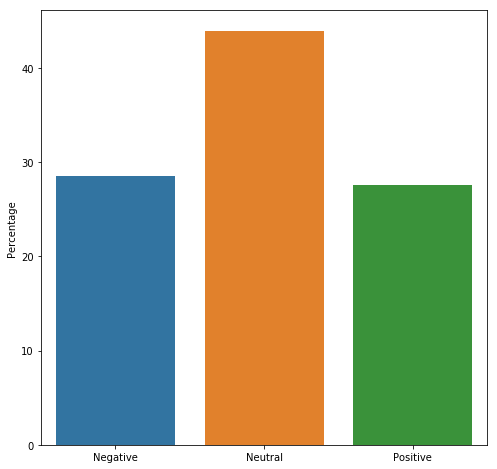

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 8))

counts = sentiment_df.label.value_counts(normalize=True) * 100

sns.barplot(x=counts.index, y=counts, ax=ax)

ax.set_xticklabels(['Negative', 'Neutral', 'Positive'])
ax.set_ylabel("Percentage")

plt.show()


#### Word distribution of positive and negative words

In [153]:
stop_words = stopwords.words('english')
tokenizer = RegexpTokenizer(r'\w+')

In [154]:
def process_text(headlines):
    tokens = []
    for line in headlines:
        toks = tokenizer.tokenize(line)
        toks = [t.lower() for t in toks if t.lower() not in stop_words]
        tokens.extend(toks)
    
    return tokens

In [155]:
pos_lines = list(sentiment_df[sentiment_df.label == 1].statement)

pos_tokens = process_text(pos_lines)
pos_freq = nltk.FreqDist(pos_tokens)

pos_freq.most_common(20)

[('says', 105),
 ('states', 61),
 ('care', 52),
 ('united', 52),
 ('percent', 52),
 ('health', 47),
 ('tax', 40),
 ('1', 34),
 ('state', 33),
 ('jobs', 32),
 ('year', 27),
 ('000', 27),
 ('security', 26),
 ('would', 26),
 ('million', 26),
 ('years', 25),
 ('obama', 24),
 ('0', 24),
 ('last', 23),
 ('since', 23)]

In [156]:
neg_lines = list(sentiment_df[sentiment_df.label == -1].statement)

neg_tokens = process_text(neg_lines)
neg_freq = nltk.FreqDist(neg_tokens)

neg_freq.most_common(20)

[('says', 86),
 ('percent', 54),
 ('000', 39),
 ('state', 38),
 ('one', 33),
 ('president', 32),
 ('tax', 31),
 ('jobs', 31),
 ('obama', 27),
 ('would', 27),
 ('year', 26),
 ('unemployment', 25),
 ('debt', 25),
 ('u', 23),
 ('years', 22),
 ('new', 21),
 ('states', 21),
 ('people', 21),
 ('last', 20),
 ('federal', 19)]

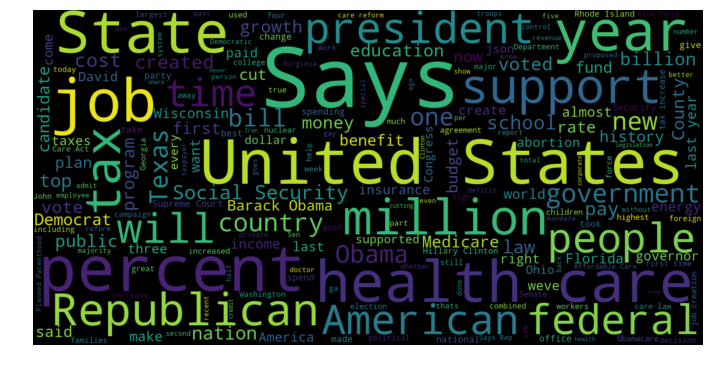

In [157]:
pos_words = sentiment_df[sentiment_df['label'] == 1].statement
pos_string = []
for t in pos_words:
    pos_string.append(t)
pos_string = pd.Series(pos_string).str.cat(sep=' ')
from wordcloud import WordCloud

wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(pos_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

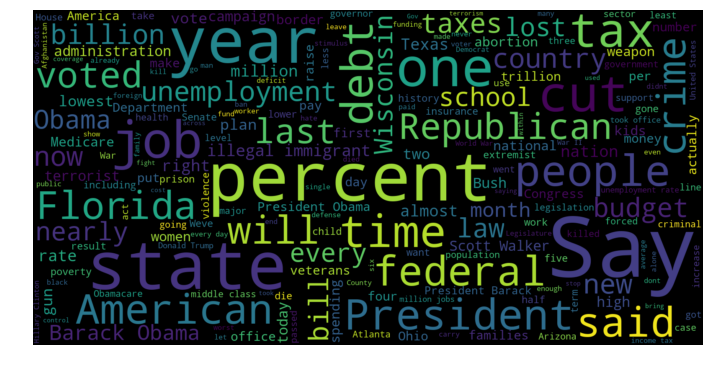

In [158]:
neg_words = sentiment_df[sentiment_df['label'] == -1].statement
neg_string = []
for t in neg_words:
    neg_string.append(t)
neg_string = pd.Series(neg_string).str.cat(sep=' ')
from wordcloud import WordCloud

wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(neg_string)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [165]:

test_data = pd.read_csv('/Users/andrew/Documents/MS - SJSU/Fall Sem 2018/CMPE 257 - Machine Learning/liar_dataset/test_data.csv')


In [166]:
test_data.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]


In [167]:
test_data = test_data.drop(test_data[test_data.label == 'half-true'].index)
test_data = test_data.drop(test_data[test_data.label == 'mostly-true'].index)
test_data = test_data.drop(test_data[test_data.label == 'barely-true'].index)
test_data = test_data.drop(test_data[test_data.label == 'FALSE'].index)

In [168]:
test_data.loc[test_data['label'] == 'TRUE', 'sensational_actual'] = 0 #0.166
#test_data.loc[test_data['label'] == 'mostly-true', 'sensational_actual'] = 0.25
#test_data.loc[test_data['label'] == 'half-true', 'sensational_actual'] = 0.41
test_data.loc[test_data['label'] == 'pants-fire', 'sensational_actual'] = 1 #0.916
#test_data.loc[test_data['label'] == 'FALSE', 'sensational_actual'] = 0.75
#test_data.loc[test_data['label'] == 'barely-true', 'sensational_actual'] = 0.58
test_data.head()

,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context,sensational_actual
3,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5,7,2,2,7,a web video,1.0
4,5962.json,TRUE,Over the past five years the federal governmen...,"federal-budget,pensions,retirement",brendan-doherty,NaN,Rhode Island,republican,1,2,1,1,0,a campaign website,0.0
5,7070.json,TRUE,Says that Tennessee law requires that schools ...,"county-budget,county-government,education,taxes",stand-children-tennessee,Child and education advocacy organization.,Tennessee,none,0,0,0,0,0,in a post on Facebook.,0.0
7,12849.json,TRUE,Donald Trump is against marriage equality. He ...,"gays-and-lesbians,marriage",sean-patrick-maloney,Congressman for NY-18,New York,democrat,0,0,0,0,0,a speech at the Democratic National Convention,0.0
11,11269.json,pants-fire,Denali is the Kenyan word for black power.,environment,viral-image,NaN,NaN,none,5,5,0,3,15,an image shared on Facebook,1.0


In [169]:
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts= cv.fit_transform(train_df_1['statement'])

In [170]:
max_accuracy = 0
dict_threshold = {}
threshold_list = []
accuracy_list = []
for threshold in np.linspace(0,1,1000):
    #threshold = threshold + 0.01
    sentiment_df.loc[sentiment_df['variation'] > threshold, 'sensational_value'] = 1
    sentiment_df.loc[sentiment_df['variation'] <= threshold, 'sensational_value'] = 0
    train_df_1[['sentiment_score','variation','sensational_value']] = sentiment_df[['label','variation','sensational_value']]
    
    X_train = text_counts
    y_train = train_df_1['sensational_value']
#text_counts_test=cv.transform(test_data['statement'])
#text_counts= cv.fit_transform(train_df_1['statement'])
#text_counts_test= cv.fit_transform(test_data['statement'])
    cv.fit(train_df_1['statement'])
    text_counts_test = cv.transform(test_data['statement'])
    X_test = text_counts_test
    y_test = test_data['sensational_actual']
   
# Model Generation Using Multinomial Naive Bayes
    clf = MultinomialNB().fit(X_train, y_train)
    predicted= clf.predict(X_test)
    #print(threshold)
    accuracy = metrics.accuracy_score(y_test, predicted)
    #print(predicted)
    #print("MultinomialNB Accuracy:",accuracy)
    #dict_threshold = dict_threshold.update({threshold : accuracy})
    threshold_list.append(threshold)
    accuracy_list.append(accuracy)
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        max_threshold = threshold
print("Max_accuracy",max_accuracy)
print("Max_threshold",max_threshold)
    

[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1.
 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1.]
[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1.]
[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

[1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1.]
[1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 

[1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1.
 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0.
 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1.]
[1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 

[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 1. 1.
 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1.
 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0.
 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1.]
[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 1. 1. 1. 

[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 1.
 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0.
 1. 1. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0.
 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 1. 0.
 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1.]
[1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0.
 1. 1. 0. 1. 1. 

[0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 1. 1.
 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 0. 0.
 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 1.
 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0.
 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0.
 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1.]
[0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 1. 1. 

[0. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 1.
 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0.
 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0.
 0. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1.
 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0.
 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 1.
 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1.]
[0. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 1. 1. 

[1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0.
 1. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1.]
[1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0.
 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.
 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 1.
 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0.
 1. 0. 1. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 1.
 1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.
 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.
 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0.
 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0.
 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 1. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

/anaconda3/lib/python3.6/site-packages/sklearn/naive_bayes.py:461: RuntimeWarning: divide by zero encountered in log
  self.class_log_prior_ = (np.log(self.class_count_) -


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 

In [191]:
sentiment_df.loc[sentiment_df['variation'] > 0.259, 'sensational_value'] = 1
sentiment_df.loc[sentiment_df['variation'] <= 0.259, 'sensational_value'] = 0
train_df_1[['sentiment_score','variation','sensational_value']] = sentiment_df[['label','variation','sensational_value']]

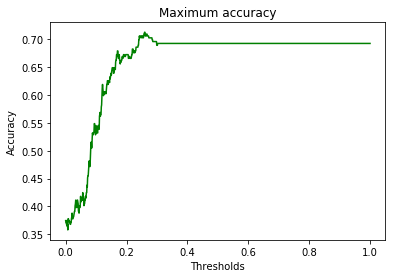

In [192]:
plt.plot(threshold_list, accuracy_list, color='g')

plt.xlabel('Thresholds')
plt.ylabel('Accuracy')
plt.title('Maximum accuracy')
plt.show()

In [193]:
tf=TfidfVectorizer()
text_tf= tf.fit_transform(train_df_1['statement'])

In [174]:
max_accuracy = 0
dict_threshold = {}
threshold_list = []
accuracy_list = []
for threshold in np.linspace(0,1,1000):
    #threshold = threshold + 0.01
    sentiment_df.loc[sentiment_df['variation'] > threshold, 'sensational_value'] = 1
    sentiment_df.loc[sentiment_df['variation'] <= threshold, 'sensational_value'] = 0
    train_df_1[['sentiment_score','variation','sensational_value']] = sentiment_df[['label','variation','sensational_value']]
    
    X_train = text_counts
    y_train = train_df_1['sensational_value']
#text_counts_test=cv.transform(test_data['statement'])
#text_counts= cv.fit_transform(train_df_1['statement'])
#text_counts_test= cv.fit_transform(test_data['statement'])
    cv.fit(train_df_1['statement'])
    text_counts_test = cv.transform(test_data['statement'])
    X_test = text_counts_test
    y_test = test_data['sensational_actual']
   
# Model Generation Using Multinomial Naive Bayes
    clf = MultinomialNB().fit(X_train, y_train)
    predicted= clf.predict(X_test)
    #print(threshold)
    accuracy = metrics.accuracy_score(y_test, predicted)
    #print("MultinomialNB Accuracy:",accuracy)
    #dict_threshold = dict_threshold.update({threshold : accuracy})
    threshold_list.append(threshold)
    accuracy_list.append(accuracy)
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        max_threshold = threshold
print("Max_accuracy",max_accuracy)
print("Max_threshold",max_threshold)
    

/anaconda3/lib/python3.6/site-packages/sklearn/naive_bayes.py:461: RuntimeWarning: divide by zero encountered in log
  self.class_log_prior_ = (np.log(self.class_count_) -


Max_accuracy 0.7123745819397993
Max_threshold 0.25925925925925924


##### Multinomail Naive Bayes Summary
* I did CountVectorizer and MNB and TFIDF with MNB and I got similar results
* I found a threshold for the variance score which would give me  maximum accuracy for detecting sensationalism
* I got the threshold as 0.259 with an accuracy of 71%.
* So I took variation greater than 0.259 as sensational ans less than 0.259 as not much sensational

###### Next I tried to apply other algorithms to see if I would get a better accuracy for predicting sensationalism for test data

#### Logistic Regression

In [187]:
train_text = train_df_1['statement']
test_text = test_data['statement']
all_text = pd.concat([train_text, test_text])

word_vectorizer = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words='english',
    ngram_range=(1, 1),
    max_features=10000)
word_vectorizer.fit(all_text)
train_word_features = word_vectorizer.transform(train_text)
test_word_features = word_vectorizer.transform(test_text)

char_vectorizer = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='char',
    stop_words='english',
    ngram_range=(2, 6),
    max_features=50000)
char_vectorizer.fit(all_text)
train_char_features = char_vectorizer.transform(train_text)
test_char_features = char_vectorizer.transform(test_text)

train_features = hstack([train_char_features, train_word_features])
test_features = hstack([test_char_features, test_word_features])

In [188]:
model = LogisticRegression()

In [189]:
train_target = train_df_1['sensational_value']
test_target = test_data['sensational_actual']

In [196]:
model.fit(train_features, train_target)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [197]:
preds = model.predict(test_features)

In [198]:
cv_score = np.mean(cross_val_score(model, train_features, train_target, cv=3, scoring='roc_auc'))

In [199]:
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score 
accuracy = accuracy_score(test_target,preds)
parameters = model.coef_

In [200]:
print(accuracy)
print(cv_score)

0.6923076923076923
0.7555890035631508


### Plotting Confusion Matrix

In [201]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(test_target, preds)

print(classification_report(test_target, preds))

             precision    recall  f1-score   support

        0.0       0.69      1.00      0.82       207
        1.0       0.00      0.00      0.00        92

avg / total       0.48      0.69      0.57       299



/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### SVM

In [203]:

model = SVC(kernel='linear', C=1E10)
model.fit(train_features, train_target)

SVC(C=10000000000.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [204]:
y_pred = model.predict(test_features)

In [205]:
print("Accuracy:",metrics.accuracy_score(test_target, y_pred))

Accuracy: 0.68561872909699


## Summary of classifiers

* I used Multimnomial Naive Bayes, Logisitc Regression and SVM to test the model I have created to predict sensationalism
* MNB had maximum accuracy of 71%, Logistic regression gave an accuracy of 69 and and cross validation score of 75%.
* SVM gave the lowest score of 69%

## Doc2Vec
* I used doc2vec to see if simialr documents would give be similar variation scores

In [207]:
train_temp = train_df_1

In [211]:
train_temp['statement'] = train_temp['statement'].replace('[^a-zA-Z0-9]', ' ', regex = True)
train_temp['statement'] = train_temp['statement'].apply(lambda x: x.lower())
stop = stopwords.words('english')
train_temp['statement']  = train_temp['statement'] .apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [212]:
data = train_temp['statement']

In [214]:
tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]

In [215]:
tagged_data

[TaggedDocument(words=['decline', 'coal', 'start', 'started', 'natural', 'gas', 'took', 'started', 'begin', 'president', 'george', 'w', 'bushs', 'administration'], tags=['0']),
 TaggedDocument(words=['hillary', 'clinton', 'agrees', 'john', 'mccain', 'voting', 'give', 'george', 'bush', 'benefit', 'doubt', 'iran'], tags=['1']),
 TaggedDocument(words=['health', 'care', 'reform', 'legislation', 'likely', 'mandate', 'free', 'sex', 'change', 'surgeries'], tags=['2']),
 TaggedDocument(words=['economic', 'turnaround', 'started', 'end', 'term'], tags=['3']),
 TaggedDocument(words=['chicago', 'bears', 'starting', 'quarterbacks', 'last', '10', 'years', 'total', 'number', 'tenured', 'uw', 'faculty', 'fired', 'last', 'two', 'decades'], tags=['4']),
 TaggedDocument(words=['jim', 'dunnam', 'lived', 'district', 'represents', 'years'], tags=['5']),
 TaggedDocument(words=['person', 'stage', 'worked', 'actively', 'last', 'year', 'passing', 'along', 'russ', 'feingold', 'toughest', 'ethics', 'reform', 'sin

In [218]:
max_epochs = 100
vec_size = 20
alpha = 0.025
d2v_model = Doc2Vec(size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =1)


/anaconda3/lib/python3.6/site-packages/gensim/models/doc2vec.py:570: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


In [219]:
d2v_model.build_vocab(tagged_data)

In [220]:
d2v_model.train(tagged_data, total_examples=d2v_model.corpus_count, epochs=10, start_alpha=0.002, end_alpha=-0.016)

In [221]:
print (d2v_model.docvecs.most_similar(4))

[('771', 0.6630675792694092), ('1286', 0.6496223211288452), ('1393', 0.5793769359588623), ('1403', 0.5749127864837646), ('478', 0.5636132955551147), ('429', 0.5596853494644165), ('718', 0.5513971447944641), ('1148', 0.5488852262496948), ('1033', 0.5474652051925659), ('700', 0.5297107696533203)]


/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [222]:
train_temp.iloc[1055]

id                                                           7016.json
label                                                      barely-true
statement            says governor democrats voted billion dollar p...
subject                               state-budget,taxes,voting-record
speaker                                                 tommy-thompson
speaker_title                                                      NaN
State                                                        Wisconsin
party_affiliation                                           republican
barely_true                                                          6
false                                                                8
half_true                                                            2
mostly_true                                                          5
pants_on_fire                                                        3
context                                                debate comments
Polari

##### Doc2Vec Summary
* I tried to find out similar documents to see if they give similar variation values i.e value which is used to predict sensationalism based on the abs variation between positive and negative sentiment

### Classifier to predict fake or not using the factor sensationalism

In [226]:
train_df_1.loc[train_df_1['label'] == 'TRUE', 'label_value'] = 0 
train_df_1.loc[train_df_1['label'] == 'mostly-true', 'label_value'] = 1
train_df_1.loc[train_df_1['label'] == 'half-true', 'label_value'] = 2
train_df_1.loc[train_df_1['label'] == 'pants-fire', 'label_value'] = 3
train_df_1.loc[train_df_1['label'] == 'FALSE', 'label_value'] = 4
train_df_1.loc[train_df_1['label'] == 'barely-true', 'label_value'] = 5

In [227]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(
    train_df_1[['sensational_value','label_value']], train_df_1['label_value'], test_size=0.3, random_state=1)

In [228]:
clf2 = MultinomialNB().fit(X_train_2, y_train_2)

In [229]:
predicted= clf2.predict(X_test_2)    
accuracy = metrics.accuracy_score(y_test_2, predicted)

In [230]:
print(accuracy)

0.2111111111111111


## Summary

* Just taking sensationalism as a factor to determine whether a news is fake or not or how much percentage of news says that it belongs to particular label is difficult to find out
* So the next step is to add all factors obtained from other team members and try the algorithm again to see if the accuracy increases

In [253]:
train_df_1.head()

,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context,Polarity,sentiment_score,variation,sensational_value,label_value
0,10540.json,half-true,decline coal start started natural gas took st...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0,0,1,1,0,a floor speech.,1,1,0.098,0.0,2.0
1,324.json,mostly-true,hillary clinton agrees john mccain voting give...,foreign-policy,barack-obama,President,Illinois,democrat,70,71,160,163,9,Denver,0,1,0.099,0.0,1.0
2,1123.json,FALSE,health care reform legislation likely mandate ...,health-care,blog-posting,NaN,NaN,none,7,19,3,5,44,a news release,1,1,0.394,1.0,4.0
3,9028.json,half-true,economic turnaround started end term,"economy,jobs",charlie-crist,NaN,Florida,democrat,15,9,20,19,2,an interview on CNN,1,0,0.000,0.0,2.0
4,12465.json,TRUE,chicago bears starting quarterbacks last 10 ye...,education,robin-vos,Wisconsin Assembly speaker,Wisconsin,republican,0,3,2,5,1,a an online opinion-piece,1,-1,0.077,0.0,0.0


In [254]:
train_df_1.to_csv('train_final.csv', sep='\t')

In [255]:
from pandas import ExcelWriter

writer = ExcelWriter('train_final_excel.xlsx')
train_df_1.to_excel(writer,'Sheet5')
writer.save()

## Assignment Alternus Vera 

### Team: Psychic Pandas
### Name: Mudrita Chaturvedi
### Factor: Political Affiliation


** As part of Alternus Vera assignment, Here we are trying to analyze liar liar dataset for partisan biasnes which includes two parties i.e. democratic and republic.**

* Data set used: Liar Liar.


In [7]:

import pandas as pd
import numpy as np
import nltk
import random
from nltk.classify.scikitlearn import SklearnClassifier
import pickle
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from nltk.classify import ClassifierI
from statistics import mode
from nltk.tokenize import word_tokenize

In [8]:
# Training data
dataset_train = pd.read_csv('liar_dataset/train.tsv', delimiter = '\t', quoting = 3, header=None)
dataset_train.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]
dataset_train.head(5)

# Testing data
dataset_test = pd.read_csv('liar_dataset/test.tsv', delimiter = '\t', quoting = 3, header=None)
dataset_test.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]
dataset_test.head(5)

,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context
0,11972.json,true,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30,30,42,23,18,Radio interview
1,11685.json,false,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2,1,0,0,0,a news conference
2,11096.json,false,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63,114,51,37,61,comments on ABC's This Week.
3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1,1,3,1,1,a radio show
4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5,7,2,2,7,a web video


In [388]:

dataset_republican=dataset_train.statement[(dataset_train['party_affiliation']=='republican')]
print(dataset_republican.shape)

dataset_democrat=dataset_train.statement[(dataset_train['party_affiliation']=='democrat')]
print(dataset_democrat.shape)


#Test data
dataset_republican_test=dataset_test.statement[(dataset_train['party_affiliation']=='republican')]
print(dataset_republican_test.shape)

dataset_democrat_test=dataset_test.statement[(dataset_train['party_affiliation']=='democrat')]
print(dataset_democrat_test.shape)


(4510,)
(3345,)
(571,)
(401,)


In [612]:
X.party_affiliation.value_counts()
dataset_test.party_affiliation.unique()

array(['republican', 'democrat', 'none', 'activist', 'organization',
       'libertarian', 'journalist', 'independent', 'columnist',
       'state-official', 'business-leader', 'talk-show-host',
       'government-body', 'newsmaker', 'county-commissioner',
       'constitution-party'], dtype=object)

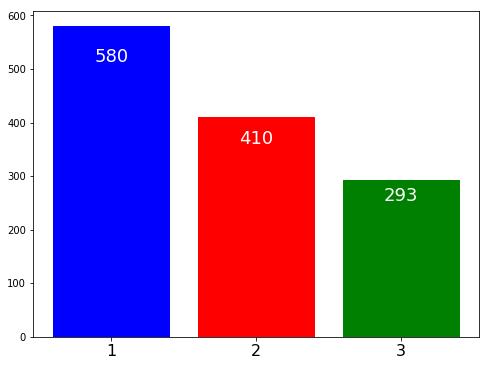

In [620]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1,figsize=(8,6))

party_label = X.party_affiliation.value_counts()
name=['republican','democrat','others']

ax.bar(range(3), party_label)
ax.set_xticks(range(3))
ax.set_xticklabels(party_label.index, fontsize=16)


for rect, c, value in zip(ax.patches, ['b', 'r', 'g','y','magenta','yellow'], party_label.values):
    rect.set_color(c)
    height = rect.get_height()
    width = rect.get_width()
    x_loc = rect.get_x()
    ax.text(x_loc + width/2, 0.9*height, value, ha='center', va='center', fontsize=18, color='white')

### Preprocessing data
** Following steps were taken for preprocessing the data **
* Tokenizing 
* Removing stop words
* Stemming
* Lemmetizing

### Tokenizing

In [528]:
# remove common words and tokenize
# stoplist = set('for a of the and to in'.split())

from gensim import corpora

documents = dataset_train['statement']

texts = [[word for word in document.lower().split() if word not in stoplist]
        for document in documents]

# remove words that appear only once
from collections import defaultdict
frequency = defaultdict(int)
for text in texts:
    for token in text:
        frequency[token] += 1

texts = [[token for token in text if frequency[token] > 1]
         for text in texts]

from pprint import pprint  # pretty-printer
print(texts)

[['says', 'list', 'political', 'group', 'supports', 'third-trimester', 'abortions', 'on', 'demand.'], ['when', 'did', 'decline', 'coal', 'it', 'started', 'when', 'natural', 'gas', 'took', 'off', 'that', 'started', 'begin', '(president', 'george', 'w.)', 'bushs', 'administration.'], ['hillary', 'clinton', 'agrees', 'with', 'john', 'mccain', '"by', 'voting', 'give', 'george', 'bush', 'benefit', 'doubt', 'on'], ['health', 'care', 'reform', 'legislation', 'is', 'likely', 'mandate', 'free', 'sex', 'change', 'surgeries.'], ['economic', 'turnaround', 'started', 'at', 'end', 'my', 'term.'], ['chicago', 'bears', 'have', 'had', 'more', 'starting', 'quarterbacks', 'last', '10', 'years', 'than', 'total', 'number', 'tenured', 'faculty', 'fired', 'during', 'last', 'two', 'decades.'], ['jim', 'has', 'not', 'lived', 'district', 'he', 'represents', 'years', 'now.'], ['"i\'m', 'only', 'person', 'on', 'this', 'stage', 'who', 'has', 'worked', 'actively', 'just', 'last', 'year', 'along', 'with', 'russ', 'f

In [ ]:
subj_docs[0]

### Stopwords

In [390]:

from nltk.corpus import stopwords

from nltk.corpus import stopwords
stop = stopwords.words('english')

documents = dataset_train['statement']
documents_test = dataset_test['statement']

dataset_train['statement_processed'] = documents.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

print(documents[10244])
print(dataset_train['statement_processed'][10244])


dataset_test['statement_processed'] = documents_test.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

print(documents_test[1244])
print(dataset_test['statement_processed'][1244])



The Obama administration spent $205,075 in stimulus funds to relocate a shrub that sells for $16.
The Obama administration spent $205,075 stimulus funds relocate shrub sells $16.
When it comes to jobless workers, Mitt Romney says he likes to fire people.
When comes jobless workers, Mitt Romney says likes fire people.


### Stemming

In [391]:
from nltk.stem import PorterStemmer
porter = PorterStemmer()
porter.stem('running')

dataset_train['statement_processed'] = dataset_train['statement_processed'].apply(lambda x: ' '.join([porter.stem(word) for word in x.split() if word not in (stop)]))

dataset_test['statement_processed'] = dataset_test['statement_processed'].apply(lambda x: ' '.join([porter.stem(word) for word in x.split() if word not in (stop)]))

print(documents[10244])
print(dataset_train['statement_processed'][10244])

print(documents_test[1244])
print(dataset_test['statement_processed'][1244])


The Obama administration spent $205,075 in stimulus funds to relocate a shrub that sells for $16.
the obama administr spent $205,075 stimulu fund reloc shrub sell $16.
When it comes to jobless workers, Mitt Romney says he likes to fire people.
when come jobless workers, mitt romney say like fire people.


### Lemmatizing

In [392]:
from textblob import Word
dataset_train['statement_processed'] = dataset_train['statement_processed'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

dataset_test['statement_processed'] = dataset_test['statement_processed'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))


print(documents[10244])
print(dataset_train['statement_processed'][10244])

print(documents_test[1244])
print(dataset_test['statement_processed'][1244])


The Obama administration spent $205,075 in stimulus funds to relocate a shrub that sells for $16.
the obama administr spent $205,075 stimulu fund reloc shrub sell $16.
When it comes to jobless workers, Mitt Romney says he likes to fire people.
when come jobless workers, mitt romney say like fire people.


### Remove number and punctuation from documents

In [393]:
import re
dataset_train['statement_processed'] = dataset_train['statement_processed'].replace('\d+', '', regex = True)

dataset_train['statement_processed'] = dataset_train['statement_processed'].apply(lambda x: " ".join([re.sub(r'[^\w\s]','',word) for word in x.split()]))

print(dataset_train['statement_processed'][10244])


dataset_test['statement_processed'] = dataset_test['statement_processed'].replace('\d+', '', regex = True)

dataset_test['statement_processed'] = dataset_test['statement_processed'].apply(lambda x: " ".join([re.sub(r'[^\w\s]','',word) for word in x.split()]))

print(dataset_test['statement_processed'][1244])


the obama administr spent  stimulu fund reloc shrub sell 
when come jobless workers mitt romney say like fire people


In [394]:
from sklearn.feature_extraction.text import TfidfVectorizer

doc = dataset_train['statement_processed']

tfidf = TfidfVectorizer().fit_transform(doc)
pairwise_similarity = tfidf * tfidf.T

## Applying sentiment analysis

In [1]:
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import * 
n_instances = 100
subj_docs = [(sent, 'subj') for sent in subjectivity.sents(categories='subj')[:n_instances]]
obj_docs = [(sent, 'obj') for sent in subjectivity.sents(categories='obj')[:n_instances]]
len(subj_docs), len(obj_docs)

/anaconda3/lib/python3.6/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


(100, 100)

In [2]:
train_subj_docs = subj_docs[:80]
test_subj_docs = subj_docs[80:100]
train_obj_docs = obj_docs[:80]
test_obj_docs = obj_docs[80:100]
training_docs = train_subj_docs+train_obj_docs
testing_docs = test_subj_docs+test_obj_docs
sentim_analyzer = SentimentAnalyzer()
all_words_neg = sentim_analyzer.all_words([mark_negation(doc) for doc in training_docs])

unigram_feats = sentim_analyzer.unigram_word_feats(all_words_neg, min_freq=4)
len(unigram_feats)


83

In [3]:
sentim_analyzer.add_feat_extractor(extract_unigram_feats, unigrams=unigram_feats)

training_set = sentim_analyzer.apply_features(training_docs)
test_set = sentim_analyzer.apply_features(testing_docs)

trainer = NaiveBayesClassifier.train
classifier = sentim_analyzer.train(trainer, training_set)

for key,value in sorted(sentim_analyzer.evaluate(test_set).items()):
    print('{0}: {1}'.format(key, value))

Training classifier
Evaluating NaiveBayesClassifier results...
Accuracy: 0.8
F-measure [obj]: 0.8
F-measure [subj]: 0.8
Precision [obj]: 0.8
Precision [subj]: 0.8
Recall [obj]: 0.8
Recall [subj]: 0.8


In [9]:
dataset_train['document']=dataset_train['statement']
for i in range (0, 10269):
    if(  pd.isnull(dataset_train['speaker'][i])):
        print(dataset_train['statement'][i])
    else:
        dataset_train['document'][i]=dataset_train['document'][i]+' '+dataset_train['speaker'][i]
        

for i in range (0, 10269):
    if(  pd.isnull(dataset_train['speaker_title'][i])):
        print(dataset_train['statement'][i])
    else:
        dataset_train['document'][i]=dataset_train['document'][i]+' '+dataset_train['speaker_title'][i]
    
for i in range (0, 10269):
    if(  pd.isnull(dataset_train['State'][i])):
        print(dataset_train['statement'][i])
    else:
        dataset_train['document'][i]=dataset_train['document'][i]+' '+dataset_train['State'][i]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


Health care reform legislation is likely to mandate free sex change surgeries.
The economic turnaround started at the end of my term.
Jim Dunnam has not lived in the district he represents for years now.
However, it took $19.5 million in Oregon Lottery funds for the Port of Newport to eventually land the new NOAA Marine Operations Center-Pacific.
The economy bled $24 billion due to the government shutdown.
U.S. Rep. Ron Kind, D-Wis., and his fellow Democrats went on a spending spree and now their credit card is maxed out
Says Scott Walker favors cutting up to 350,000 families and children off health care.
The nuclear test conducted in our nation this time is the Earth's 2,054th nuclear test. The five permanent members of the U.N. Security Council have conducted 99.99 percent of the total nuclear tests.
In the case of a catastrophic event, the Atlanta-area offices of the Centers for Disease Control and Prevention will self-destruct.
Says Marco Rubio skipped 18 defense votes including on

Says two-thirds of groups targeted for IRS scrutiny were not conservative.
In the class of 1968 at Patrice Lumumba University in Moscow, Mahmoud Abbas was one of the members of that class, and so was Ali Khamenei. And thats where they first established relationships with the young Vladimir Putin.
Says it has offered $12 million in savings through 2011 and $184 million in savings over the next 25 years in contract negotiations with the City of Milwaukee.
Clackamas County Commissioners approved a re-negotiated agreement to lower the countys contribution to TriMets Portland-Milwaukie Light Rail project to $19.9 million from $25 million.
The GOP budget plan would cut nearly a million jobs.
There are more people living in this country who were not born here than at anytime in the history of the country.
The Postal Services financial losses result from a 2006 law that drains $5 billion a year from post office revenue, while the Postal Service is forced to overpay billions more into federal a

Wisconsins attorney general and state treasurer ordered the daughter of Earth Day founder Gaylord Nelson not to discuss climate change on state time.
Says unions take away hard-earned money of teachers, firefighters and police officers to play politics.
Embryonic stem cell research is at a dead end, with no one good example of a successful treatment.
Tens of thousands of Atlanta households pay more than 30 percent of their income towards rent.
Rick Perry had planned to retire from the legislature until his best friend, David Weeks, and I talked him into switching parties and running for the GOP nomination for agriculture commissioner.
As the usage [of synthetic marijuana] has dramatically increased, instances of violence, bodily harm and even death have risen with it.
Look at the debt that has been accumulated in the last two years. Its more debt under this president than all those other presidents combined.
The Chris Hani Baragwanath in South Africa is the worlds third-biggest hospita

Barbara Boxers worried about the weather instead of terrorism as the biggest threat to national security.
"We spend three times more on entitlements and debt services than we do on defense."
Of the approximately 6 million disenfranchised felons in the United States, one-quarter are Floridians.
Gov. Rick Perry has overseen the highest Texas unemployment in 22 years.
Ed Gillespies 2006 book promoted an individual health care mandate, and recommends that it be enforced by the IRS through the income tax code.
Department of Veterans Affairs doctors are prohibited from recommending medical marijuana.
Said former U.S. Ambassador to Kenya Scott Gration was forced to resign two years ago because of his personal use of emails.
Said they reached a power-sharing agreement with Republican Lt. Gov. Casey Cagle
Earlier this year, [John DePetro] was accused of sexually assaulting a female co-worker.
Photo of "tea party" protests shows crowd sprawling from Capitol to Washington Monument
Every one of th

"I've traveled the country advocating for the FairTax ..."
Says Deborah Ross supports the Iran nuclear deal and the ransom it paid for hostages.
Says Ron Johnson has essentially done nothing to fight heroin addiction and opioid abuse.
Says unemployment tripled in Dane County due to Kathleen Falks tax policies
"Jeff Greene only moved from California to Florida in the last two years. In fact, he would not legally be allowed to run for any other statewide office because he has not lived here long enough to meet the residency requirement."
President Obama has increased the federal workforce 192,000 individuals -- about 10 percent since hes taken office -- while weve lost 2 million jobs.
Obamacare will provide coverage for abortions, despite the presidents commitment that it would not.
Handel endorsed gay adoption in 2003 when she was running for chairwoman of the Fulton County Commission.
President Barack Obama met with Iranian president Hassan Rouhani.
The church Barack Obama belongs to h

Says someone earning $50,000 a year will fare better under his 9-9-9 plan than under the current tax system.
Says Democratic U.S. Senate candidate Tammy Baldwin ranks as the most liberal member of the House.
We have at least 200,000 to 300,000 hate crimes in a given year.
Says critics called the original GI Bill welfare.
"I didn't endorse" the federal stimulus bill.
Says Wisconsin Gov. Scott Walker doesnt make his calendar public -- hes on our dime and we dont know where he is.
What is the maximum number of students allowed in your classroom? ... 30 or more!
Says in regard to providing more tax cuts for the rich, Bill Pascrell said, Republicans had great ideas. I liked some of their ideas.
John McCain "voted against the Bush tax cuts, both times."
The average student debt coming out of the University of Wisconsin-Madison is something like 28,000 dollars.
Says Los Angeles Clippers owner Donald Sterling is a Democrat.
FACT: the special assistant in @johnkasichs office makes over three ti

By using a little-known loophole ... Obama minions are allowing Nestle Company to export precious fresh water out of Lake Michigan.
Every 1 percent increase in the cost of health insurance today causes about 30,000 Georgians to be uninsured.
As Governor: Romney did not keep public safety funding in line with inflation.
We have reduced funding for education the least. Theyve suffered the least cuts.
Says the federal government threatened to impose a no-fly zone in Texas if state legislators bar airport security officials from performing pat-downs.
Malawi has just 300 doctors for 16 million people.
We doubled the size of the company (Hewlett-Packard).
Obama taps porn lawyer for #2 at Justice.
Florida's legal challenge of the federal health care bill is "bipartisan."
The truth is, Planned Parenthood does not provide mammograms. Planned Parenthood refers women to mammography providers, serving as the middlewoman, if you will.
When ICE releases illegal immigrants, a lot of those people are 

The weight of the evidence (on global warming) is that most of it, maybe all of it, is because of natural causes ... its fair to say the science is in dispute.
On new dollar coins, In God We Trust is gone!
Freshman Rep. Bob Gibbs is spending his one year anniversary on vacation only working 6 days in all of January.
Says Obama flip-flopped on banning handguns.
[T]he Georgia Dome has returned $10 billion in economic impact to the state of Georgia.
Other Western countries have ended their "Don't Ask, Don't Tell" policies.
The U.S. is borrowing approximately $2.52 for every $1 of economic growth so far in 2012.
The Northwest Corridor highway project in Cobb and Cherokee counties is expected to create over 9,700 jobs statewide.
Says Hillary Clinton is proposing destroying Medicare for seniors.
On supporting winner of Democratic primary with her superdelegate vote.
The IRS has been specifically forbidden ... from ever actually pursuing either civil or criminal remedies for people who dont p

Florida shelled out more money for drug testing than it saved by denying welfare benefits to people who tested positive for drugs.
Democrats are poised now to cause this largest tax increase in U.S. history.
Youre more likely to be the victim of a violent crime in Milwaukee than in 96 percent of the country.
With Rick Scott, there are more funds for preschool education.
Says Thomas Jefferson helped craft the Constitution.
Says U.S. Rep. Tammy Baldwin, a candidate for Senate, supports raising taxes by $858 billion.
Says Democratic challenger Russ Feingold was the deciding vote on Obamacare.
Florida has the most errors and exonerations from death row.
"He (Kirk) did violate Pentagon rules, twice actually, for improperly mingling politics with his military service."
Obama's plan to raise the capital gains tax "hurts the middle class."
The House Zika bill limits access to birth control services needed to help curb the spread of the virus in Puerto Rico.
Says JoAnne Kloppenburg has told us 

"Law enforcement in the state of Arizona supports" the state's new immigration law.
Obama creates new tax on Christmas trees, fees get passed on to consumers.
That 59 divisions in Philly had no votes for Romney in 2012 is (a) mathematical and statistical impossibility.
Says Barack Obama has gone from blaming George W. Bush to plagiarizing George W. Bush.
"House Speaker Nancy Pelosi said this week that the Democrats have to pass their terrible health care bill so that the American people can actually find out what's in it."
2008: Unions Spent $400 Million to Elect Obama.
"Our graduation rate is the highest it's ever been."
Terrorist detainees were not covered by the Geneva Convention. They were unlawful combatants. And under those circumstances, they were not entitled to the normal kinds of courtesies and treatment.
Says Patrick Murphy supports a gun ban on commonly owned semi-automatic firearms used for hunting, recreational shooting and self defense.
Says Mary Burkes 2007-09 state bud

By voting to approve [Question 1], we can . . . save 900 jobs at Twin River.
Says Obama replaced the American flag on the tail of his plane with his campaign logo.
In a budget deal struck in 2011 a trillion dollars of cuts went into effect immediately, and then a special committee was set up ... to get agreement on another $3 trillion of cuts.
"Under the Baucus bill ... federal funds would subsidize coverage of elective abortions."
Cap-and-trade is wildly unpopular with Americans.
Teachers were not involved in developing the Common Core State Standards.
Says Ron Johnson voted to turn Medicare into a voucher program.
Barack Obama's church gave a lifetime achievement award to Louis Farrakhan.
Said state insurance commissioner candidate Ralph Hudgens fights hard to strip women of life-saving coverage such as mammograms.
My two appointments to the Florida Supreme Court, Raul Cantero and Kenneth Bell, have earned reputations as its most consistent conservatives.
Says legislation supported b

"Congressman McCollum voted to dismantle Social Security."
Nevada is No. 1 in unemployment, violent crime, car theft, divorce, robberies and foreclosures.
"Floridas high school graduation rate falls well below the national average."
Says four Democratic state senators voted to raise taxes on Wisconsin workers by another $510 a month so freeloaders can get free state-run health care.
Annexation would lead to overcrowding at Decaturs city schools.
Says former Miami-Dade Mayor Carlos Alvarez and current mayoral candidate Carlos Gimenez both drove fancy European cars at taxpayer expense.
Sen. Barbara Boxer voted against immigration reform to permit (Hispanic immigrants) people to come here legally to work.
"The public option is not funded with public money. It's funded with private insurance premiums."
Women in Oregon are paid 79 cents for every dollar paid to men. If the wage gap was eliminated, a working woman in Oregon would have enough money for 2,877 gallons of gas, 72 more weeks of f

Florida sends $135 billion and D.C. returns $150 billion.
Opponent Glenn Hegar expressed pride in legislated cuts to public school funding.
The Obama administration offered $900 million to Hamas, a recognized terrorist organization, to rebuild Gaza.
Says Wisconsin Gov. Scott Walker is making voting more difficult by closing Department of Motor Vehicles offices where low-income voters live.
Right now, we have the lowest gas tax of anywhere in the country.
Says Mitt Romney was director of a company that stole millions from Medicare.
Atlanta now has as many visitors as Las Vegas, San Diego and Los Angeles. Orlando, Fla., and New York City still have more visitors.
Bill OBriens Tea Party legislature tried to repeal kindergarten and compulsory education, defund Planned Parenthood and eliminate insurance coverage for birth control.
Says Proposition 205 blocks market entry for new marijuana dispensaries.
We refused to balance the budget on the backs of our children.
When Chuck Schumer and Mar

State Rep. Kathleen Peters has a 100 percent pro-abortion voting record even voting against a ban on sex-selection abortions.
Honduras bans citizens from owning guns and has the highest homicide rate in the entire world. Switzerland, with a similar population, requires citizens to own guns and has the lowest homicide rate in the entire world.
8.5 million Americans have gotten rebate checks because their insurance companies were spending too much money on executive bonuses and administrative costs and not enough on health care.
Obamas flush with cash, returning to Wall Street for even more money. Wall Street sure supports President Obama.
In 2005 and 2007, Joe Straus received a 100 percent rating by NARAL (the National Abortion and Reproductive Rights Action League).
Says Gov. Scott Walker signed abortion, sex education and discrimination bills in secret.
Rubio's tax swap proposal "would have been a massive tax increase."
We had the biggest drop of the rate of unemployment (in)all but 4

Says in 2012 Obama won in every state that did not require a photo ID and lost in every state that did require a photo ID in order to vote.
On support for the Export-Import Bank
Says he didnt have an involvement withnutritional supplement company Mannatech.
"We worked together to enact ... the largest tax cut in Florida history."
U.S. taxpayers paid $71,500 per job created by the stimulus bill.
Says President Obama helped more than half a million veterans and military family members go to college through the Post-9/11 G.I. Bill.
In our proposal, we would have expanded school aid across the board Governor Christie slashed school aid in this budget, preferring instead to extend a tax break for millionaires over funding in the classroom.
Public employees receive something like 25 percent of the paychecks that are issued in Rhode Island.
Social Security doesnt contribute a penny to the deficit.
The DNC hack showed you that the Clinton campaign was working to schedule (primary) debates agai

Atlanta Tea Party co-founder Debbie Dooley wants gas taxes raised.
As a result of welfare reform, poverty levels went down to the lowest level ever for ... African-American children.
John Mica's brother is an oil lobbyist and his daughter represents the natural gas industry.
Last year, there were an additional 81,000 pages of government regulations. If you stack that up, it would be a three-story building.
The largest number of gamblers are from the poorest segments of the population.
Says Gov. Rick Scott cut state funding for PBS.
Attorney general candidate Brad Schimel is in cahoots with Wisconsin Right to Life to make abortion a crime in Wisconsin.
Bill McCollum explained his lack of action on mortgage fraud by saying, "You can't do everything."
The United States is behind many countries in Europe in terms of the ability of every kid in America to get ahead.
Says we are overcharging students . . . to help pay for the health care law.
Says Ellen Rosenblum has said over and over again

Allen West called Social Security a Ponzi scheme and said this countrys got to get on sound footing by destroying it.
Says it wasnt until he and a Senate colleague were able to wrangle the actual streaming video from BP that scientists were able to calculate the oil spill flow.
A bag of Cheetos costs less to buy than an apple, and in some Milwaukee neighborhoods good luck trying to find an apple or a banana or some sort of healthy option
Senator Webb was a reliable vote for President Obama and Senator Harry Reid.
In Wisconsin, Gov. Scott Walker has created a manufacturing-led jobs recovery. 30,000 new jobs were created this year, with 15,000 created in the struggling manufacturing sector.
"The ACLU has filed a suit to have all military cross-shaped headstones removed."
An overwhelming majority of Americans support passage of the DREAM Act, which would provide a path to citizenship for undocumented youth willing to work for a college degree or serve in our armed forces.
James Langevin h

Obama said troops "whine about bearing the costs" of going to war.
Says there was a NATO base in Turkey being under attack by terrorists.
Barack Hussein Obama will force doctors to assist homosexuals in buying surrogate babies.
"One state even spent a million bucks to put up signs that advertise that they were spending on the federal stimulus projects."
Says Newt Gingrich is responsible for the gridlocked politics of Washington.
Twenty-seven out-of-state pharmaceutical companies have raised more campaign dollars (against a drug price control measure) than all other state ballot measures have raised to date, combined.
As part of efforts to rein in protesters, Republicans in Wisconsin have bolted windows inside the Capitol shut.
Things like having Friday classes have been shown to be very effective on college campuses in reducing drinking.
As Virginias governor, Allen cut spending and waste with bipartisan support.
"The pastor McCain calls his 'spiritual guide,' Rod Parsley, believes Ame

Says New Jerseys public school students have the best Advanced Placement scores in the nation.
"We only have 2 percent of the oil reserves in the world, and we consume 25 percent of the world's oil on a daily basis."
Dave Aronbergs career legal experience is less than two years as Asst. AG/private attorney.
Gains in Atlanta Public Schools scores on a national standardized test lend credence to dramatic score increases on state tests.
Romneycare sent costs spiraling out of control in Massachusetts, hiking premiums, squeezing household budgets.
Members of Congress passed a pay raise for themselves of $10,000 over two years even as they voted not to raise Social Security benefits for 2010 and 2011.
Says Gov. Scott Walkers proposed budget would sell off Wisconsins state parks.
Says Kelly Ayotte voted to fix background checks.
Says the Texas unemployment rate has even grown more than the nations as a whole.
On sharing power with Republicans
Some cardiologists estimate 70 percent of all male

In other jurisdictions where (a domestic partnership registry) has been enacted, we have seen that fewer people enter into marriage.
Congressman Renacci is under FBI investigation.
U.S. Rep. John Barrow of Georgia has helped support the implementation of Obamacare.
A YouGov.com poll shows 71 percent of Obama voters regret voting for him.
Obama opposed exploring for energy in Alaska.
Rick Scott has heavily invested in a company that is geared to helping illegal aliens transfer money to family and friends out of the country."
Says state Senate recall challenger Sandy Pasch voted to cut school aid by nearly $300 million.
On bringing casino gambling and other gaming to Georgia
Mitt Romney received exactly zero votes in at least 12 Cuyahoga County precincts.
Ron Oakleys conservative leadership protected local taxpayers over government bureaucrats as theWater Management Districts budget decreased by 58 percent in the four years he served on the board.
Kewpie burgers are delicious. An Ohio in

Film and television productions generated a $6 billion economic impact for Georgias economy in the most recent fiscal year.
Says Gov. Scott Walker took away $1.6 billion from schools and handed it off as over $2 billion in tax breaks to the rich.
Says Reps. Rush Holt, Frank Pallone and Bill Pascrell are willing to jeopardize seniors access to coverage by gutting $741 billion from Medicare to pay for a big-government healthcare takeover.
Horse racing could boost Georgias economy by $1 billion a year and create 10,000 to 20,000 jobs.
Russ Feingold voted against the law that protected our lakes and was the only Great Lakes senator to vote no.
Barack Obama has consistently voted against tougher penalties for criminals.
Palin "inherited a city with zero debt, but left it with indebtedness of over $22-million."
Florida is one of only three states that require licenses for commercial interior designers.
"Nobody has been talking about it (Medicaid fraud), focused on it, or paying attention to 

Says the California flag was supposed to be apear, not a bear.
Texas Governor Rick Perrys voter ID law is a blatant effort to defeat Wendy Davis by disenfranchising tens of thousands of women voters.
Says U.S. Rep. Stephen Fincher breaks earmark pledge.
Obama "closed offshore tax safe havens."
"Health care mandate will require imprisonment and fines for Americans who cant afford to purchase insurance or pay hefty government penalties."
Says his tax plan wouldnt leave the federal government with a $1.1 trillion hole.
U.S. Rep. John Barrows plan puts the IRS in charge of your health care.
For every [coyote] they kill, the population will replace and usually multiply.
Number of Americans killed by terrorism in the last decade: 24. Number of Americans killed by guns in the last decade: 280,024.
"The Books Sarah Palin tried to have banned."
Says Colorado congressional candidate Morgan Carroll voted to allow welfare recipients to use your tax dollars at ATMs at strip clubs and pot dispensari

Michelle Nunns foundation directed grants to an Islamic group tied to radical terrorists.
Pam Bondi refuses to take a position on the gay-adoption ban.
By 12th grade, more than 3 out of 10 girls have been pregnant at least once.
Illegal immigration costs Georgia $2.4 billion a year
Tom Barrett voted for the largest tax increase in history ... raising taxes on gas and Social Security.
California is home to the largest death row populationin the Western Hemisphere.
A private school tax break in the Wisconsin state budget is the most generous in the nation.
For decades before I was elected, governors tried and failed to get Minnesota out of the top 10 highest-taxed states in the country. I actually did it.
In the U.S., African-Americans continue to be arrested at nearly three and one half times the rate of whites on marijuana charges.
A majority of drunk driving deaths and injuries are caused by drunk driving offenders with no prior convictions.
On ISIS, (Michael Bennet) chose the (Washin

Ninety percent of people living in Gaza dont have access even to water.
Says Barack Obama said that ordinary men and women are too small-minded to govern their own affairs and that individuals should surrender their rights to an all-powerful sovereign.
Says a man in Ferguson, Mo., was photographed holding a sign that said, No mother should have to fear for her sons life every time he robs a store.
[Former Georgia congressman] Bob Barr voted ... to raise his own pay.
It is estimated that Arizona has lost more than $100 million in hospitality industry revenues since passage of the Arizona immigration laws.
The Seattle Times called Patty Murray a prolific sponsor of earmarks. Patty even defended the Bridge to Nowhere.
Creflo Dollar has endorsed Republican Donald Trump for president.
Says New Jersey is losing 50 football fields of open space to development every day and the more we develop upstream the more flooding we have downstream.
Says U.S. Senate candidate Tammy Baldwin proposed a $3

Liberty University students were mandated to attend Sen. Ted Cruzs presidential announcement or they would be fined.
Slim Jims just recently cost 99 cents but now cost $2.69.
President Barack Obama and Secretary of State John Kerry agreed to lift Irans economic and arms sanctions without any proof of change in conduct.
We lock up close to 2.4 million people in this country. Were locking up more people than China and Russia.
You can fill out your tax return in Estonia online in five minutes.
Says Marco Rubio endorsed Obamacare for his own family.
Charlie Crist stopped layoffs of some 20,000 school teachers during the global economic meltdown.
Says Russ Feingold supported a stimulus plan that allowed a company to create 3,000 jobs in China.
Says Madison Mayor Paul Soglins stated intent when proposing that city contractors disclose private political donations was to discourage contributions to organizations with which he disagrees.
A Republican bill that would change John Doe criminal inv

No one in the private sector gets unlimited accruals of vacation and sick leave.
Says Obama has flip-flopped on public campaign financing.
Ronald Reagans signature on the 1986 amnesty act gave Barack Obama about 15 million additional Hispanic votes in 2012.
Says Texas U.S. Rep. Pete Sessions said the GOPs goal is to go back to the same exact policies that were in place before this president took office... policies that crashed the economy.
Says Donald Trump said the government is going to pay for everybody to have health care.
Says 11 states have more people on welfare than employed.
On the economic stimulus.
Say Ohio Reps. Marcia Fudge, Marcy Kaptur and Dennis Kucinich are socialists who are openly serving in the U.S. Congress.
Says Alex Sink supported more taxes on water and TV.
Says Dan Patrick has called immigration into Texas an invasion and said immigrants coming into Texas bring third-world diseases.
Polls show Americans are overwhelmingly opposed to Obamacare, especially the in

﻿﻿Since Mayor Kennedy OBrien took office Sayreville has issued 22,081 building permits! Now OBrien is holding secret meetings with big developers.
Go look on the West Point website and youll see those specific words, full scholarship to West Point. So even though it is, you know, given as a grant for anybody who gets in, those words are used.
There are twice as many gun shops as McDonalds in the United States.
If we keep the minimum wage at the current level, then single-parent families earning the minimum wage at a full-time job will live in poverty in New Jersey.
Says Connie Mack failed to pay his child support.
Says David Jolly lobbied on a plan by Rep. Paul Ryan that would turn Medicare into a voucher program.
St. Pete Beachs experiences are a fair example of what could happen if Amendment 4 passes.
Paul Ryan is one of only six House Republicans who voted for Teddy Kennedys bill to force Christian employers to hire LGBT employees.
Many state and federal agencies have such navigator

Jesus was an undocumented immigrant.
Final election 2016 numbers: Trump won the popular vote.
Says opponents of proposed Austin school district bonds say the districts debt load doubles with these new bonds.
Every 20 seconds, a child dies because they lack access to clean water and sanitation.
Says New Jersey has the highest unemployment rate in the region and stagnant job growth.
Sen. Barbara Boxer passed only three bills in 18 years into law.
State employees havent received a raise in five or six years.
Georgia is one of only five states where breweries cant sell you a pint of beer to drink on premise or sell you a six-pack to go.
Teenage births cost Texas taxpayers $1.1 billion in health care, foster careand lost tax revenue in 2010 alone.
Says she made an accurate prediction that if Barack Obama were elected it would encourage Russia to invade Ukraine.
I am the only person in this field who is against amnesty. Every other person in this field wants to allow people who are here ille

"He positions himself as pro environment, but he scored a zero yes, zero from the League of Conservation Voters last year."
Since 2000, only 10 cases of in-person voter fraud have been proven nationally.
As we watch the news from Colorado with horror and sympathy for the families, we should remember that each day more than 80 Americans are killed by gunfire, unnecessary tragedies.
Says Mitt Romney flip-flopped on supporting the presidents Recovery Act.
(The Tax Policy Center) found that Romney would raise taxes on the average middle class family by $2,000 to pay for $5 trillion in tax cuts for millionaires and billionaires.
Private prisons do not chase escaped inmates past the perimeter like the public prisons do, which means more escaped prisoners in our communities.
Says Charlie Crist rode on a jet that belongs to a serial polluter with a history of environmental violations fined nearly $2 million for polluting water.
"I signed the largest single tax cut in the history of Florida, a 

Two-thirds of the federal budget is permanent law ... its permanently appropriated.
The average age of first marijuana use is 12.
President Obama is a Muslim.
Zephyr Teachout says she is against Super PACs despite taking money from Super PAC donors
Says Ohio Treasurer Josh Mandel first claimed bank fraud in June 2010 but did nothing for more than a year while raising money for his (Republican) Senate campaign.
Says Mitt Romney has said different things about whether global warming is caused by humans
Obamacare (hit) Americans with over $500 billion in new taxes.
Georgia has "a dropout rate thats higher" than Alabama's.
Says Mitt Romney flip-flopped on gun control.
Says Rick Scott cut education by over a billion dollars, meaning thousands of teachers lost their jobs and class sizes went up.
Protesters attacked the groups headquarters with graffiti on the sidewalk and stenciled images smeared on the building and statue.
Amendment 4 will reduce Floridas economic output by $34 billion annu

The employer mandate affects only 5 percent of businesses in this country.
Recently we have seen our government debt grow by $3.4 trillion during the first 29 months of the Obama administration -- the equivalent of about $4 billion per day.
We know from the social science that children do best with a mom and a dad.
Under Scott Walker, Wisconsin moved from 16th to third in percentage of people with student loan debt.
Nine out of the 10 poorest states are Red states.
Funding the federal health care law without a tax hike will require the state to cut nearly a quarter of its annual budget.
Republicans actually doctored emails between administration officials about Benghazi. Then, they released them to the press, trying to pass them off as real.
Says Gov. Scott Walker has made Wisconsin 2nd in the nation in losing jobs.
Gov. Rick Scott signed into law a bill that gives Floridas public officials an easy way to avoid disclosing their personal finances.
This is the worst jobs recovery since t

Congressman Robert Hurt has a plan to cut education by 40 percent.
"To say a family has to buy a product from a private company is clearly beyond the delegated powers of the U.S. Constitution."
The federal health care law raises taxes and cuts Medicare.
"The president has added close to 68,000 troops in the last year, since he came into office, not just the 30,000 you hear, but the others that were added before that."
Taking the Fifth Amendment in a deposition about the Columbia/HCA hospital chain he founded means a truthful answer to the questions that (Rick Scott) was asked would incriminate him.
We have more scientists and engineers per square mile than anywhere in the world.
"The Defense Department received only one-half of 1 percent of the nearly trillion-dollar stimulus package funding."
You look at defense were spending more than the rest of the world combined.
Says Daniel Webster used taxpayer funds to build a lobbyist lounge.
Says 97 cents of every dollar played represents ove

Says aWHO proposal portrays milk and dairy products as an obstacle to a healthy start in life.
Says Jon Runyan voted to end programs to aid homeless veterans.
More Hispanics have been elected statewide (in Texas) on the Republican ticket than on the Democratic ticket.
The HOPE scholarship has helped turn our University System into one of the best in the Southeast, with two institutions ranked in the top 20 of public universities in the country.
Says since Australia passed tough gun laws, homicides by firearm have declined almost 60 percent.
The federal government borrows $4 billion every day.
President Barack Obamas policies have forced many parts of the country to experience rolling blackouts.
In Florida, its not illegal for an immediate family member of state officials to prosper from legislation supported by a spouse.
The unemployment rate among (the) non-college-educated is well into the double digits in America. Its 4 percent or 5 percent for people who have college degrees.
Says 

Greenlight Pinellas wont take existing lanes from other vehicles.
Says Ron Johnson opposes entirely a federal minimum wage, except perhaps for guest workers.
For educational testing, Florida has chosen a company that has a significant history of promoting identification of the GLBT lifestyle for children as young as seven years old.
When Charlie Crist was elected governor, Florida ranked 31st in K-12 education. "Last year ... we went from 31st to 14. And this year, the top 10 in America."
Middle-class families throughout America (would) have to pay $6,000 per year to pay for tax cuts for the wealthy.
Says Rep.Mike Coffman istheone who said he would support Trump.
McCain opposed the border fence.
Says Mitt Romney has said we dont need more firemen, more policemen, more teachers.
Says union bosses bused protesters to aCentral Florida education protest.
On transparency in dealing with the Republican Party of Florida's financial issues.
Oregon House Republicans jobs plan could generate mor

Says Gov. Doug Ducey wants to use taxpayer dollars to increase the salaries of private prison guards.
In the last 6 years, there have been 420 elections for State Senator and State Representative. Only three incumbents have been defeated!
Says Mitt Romney said we are going to have to live with high gas prices, its a good thing because it will reduce consumption, we dont want to produce any more gasoline.
One of the reasons I believe were in trouble in Yemen is we lost the population on drone strikes issues. Thats what stirred up the population. Thats what is happening in Yemen.
Says President Barack Obama is absolutely a Muslim.
Says Ted Strickland supported giving $150 billion to Iranian regime that persecutes women, Christians and gays.
Says David Jollys former firm lobbied for hundreds of millions (of dollars) for a dictator in Pakistan.
Most AGs dont go to court..
Says State Comptroller Matthew Boxer pointed out that many towns are artificially lowering the real estate values that 

Over the past few months, we've learned that "we just can't count on the media to debunk" lies about health insurance reform.
The Republican-controlled Wisconsin Assembly approved only one out of 376 amendments offered by Assembly Democrats in 2011.
We sell 40 percent of our guns without a background check.
"All non-US citizens, illegal or not, will be provided with free health care services."
Kids coming from an affluent background are taking advantage of all these student loan programs and grants while many middle-class families with no connection to college are picking up the tab.
Rather than prioritize and pass ethics reform measures to restore trust in state government, (Democrats) sat on their hands and did nothing when they were the majority.
Vice President Joe Biden's meeting "with the transparency and accountability board . . . was closed to the public."
If you go back to 1999, Wayne LaPierre testified on behalf of the NRA that background checks were appropriate and should be 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Mayor Fung wants to punish our childrens education by removing 12 million dollars from current funding to pay for his private charter school. Your taxes would increase by between 6 and 8 percent per year.
"Under the ruling of the Supreme Court, any lobbyist could go into any legislator and say, if you don't vote our way on this bill, we're going to run a million-dollar campaign against you in your district."
There are a larger number of shark attacks in Florida than there are cases of voter fraud.
Democrats have now become the party of the [Atlanta] metro area and of blacks.
Says an alternative to Social Security that operates in Galveston County, Texas, has meant that participants will retire with a whole lot more money than under Social Security.
On lifting the U.S. Cuban embargo and allowing travel to Cuba.
Health care reform legislation is likely to mandate free sex change surgeries.
However, it took $19.5 million in Oregon Lottery funds for the Port of Newport to eventually land t

What is the proper collective noun for a group of baboons? Believe it or not . . . a Congress!
Upwards of 90 percent of women seeking an abortion decide not to have an abortion after seeing an ultrasound.
In July 1996, Mitt Romney helped locate the missing teenage daughter of a partner at Bain Capital.
Blames Mike McIntyre and Nancy Pelosi for the second straight year of no cost-of-living increases for Social Security beneficiaries.
The government is going to have the right to get into your bank account with the health care bill and make transfers without you knowing it.
"There are mechanisms in place to shut down the Internet privately."
Not even old Gen. Eisenhower saluted military personnel as president.
Says Alex Sink failed Florida homeowners by using predatory lending practices.
Says that Starbucks took Christmas off of their brand new cups.
Atmospheric conditions could push a footballs pressure down approximately one-and-a-half pounds per square inch.
Under legislation that has 

One in four inmates is an illegal immigrant.
Wisconsin is dead last in income growth among midwestern states during Gov. Scott Walkers term.
President Obama in November of last year wiped away (a program) that allows for shared fingerprinting for those who are behind bars so you know who is here legally and illegally.
McCain sought the political support of minister John Hagee, "who believes Hurricane Katrina was God's punishment for gay rights and called the Catholic Church 'the Antichrist' and a 'false cult.'"
Since Wisconsin Gov. Scott Walker took office, we are losing jobs at rates not seen in decades.
Wisconsins attorney general and state treasurer ordered the daughter of Earth Day founder Gaylord Nelson not to discuss climate change on state time.
President Bush never did one interview with the New York Times during his entire presidency.
Mr. Trump is self-financing his campaign, so we dont have any donors.
The U.S. spends more money on its military than the 16 biggest military bu

Ever wonder why no one ever came forward from Obamas past, saying they knew him, attended school with him, was his friend, etc.? Not one person has ever come forward from his past.
Says area near proposed northern Wisconsin iron ore mine is 15 hours away from where public hearing on mining was held.
U.S. police killed more people in just one month than the U.K.s did in over a century.
Crime rises in communities with casinos.
Maj. Nidal Hasan, the man accused of the Fort Hood shootings, "was an ADVISOR to the Obama Administration."
As CEO of WWE, Linda McMahon was caught tipping off a ringside physician about a federal investigation into illegally distributing steroids to wrestlers.
Due to actions by President Barack Obama, the Burger King national headquarters announced this month that they will be pulling their franchises from our military bases.
A 2005 gay pride vote had nothing to do with discrimination.
On the night of the Iowa caucuses, Obama promised the nation that he would do h

No openly gay man has ever been elected to the Georgia Legislature.
U.S. Reps. Eric Cantor and Luis Gutierrez were touring the country last year joined at the hip, working together in a bipartisan fashion indeed for the goal of immigration reform.
"If Sen. Hillary Clinton could enact all of her campaign proposals, taxpayers would be faced with financing more than $777.6-billion in new spending over one White House term."
Dan Gecker voted to double vehicle registration fees, costing (Chesterfield) county residents over $6 million annually.
Birthers have obtained a copy of Obamas Kenyan birth certificate.
I played in a game here against the Pittsburgh Steelers where there was 23 inches of snow. We played in at least 15 inches of that.
The Republican leadership's budget proposal doesn't contain any numbers.
Pentagon confirms they may court martial soldiers who hold Christian faith.
"The Florida Legislature raised taxes and fees by almost $2 billion" in the 2009 session.
Says Hillary Clint

When President AbrahamLincoln signed his Emancipation Proclamation, there were over 300,000 slaveholders who were fighting in the Union army.
Eighty-three law enforcement officers have died in the line of duty this year. Twenty-four of them were shot and killed in cold blood.
Says President Barack Obama has taken less vacation days than any other president in a generation, while Congress has taken more vacation days than any other Congress in history.
Less than two years ago, we made a commitment to repay the U.S. . . .taxpayers in full, and today we made good on that promise.
Cory Gardner is sponsoring a bill to ban all abortions right now.
Sometime in the next decade, there will be more Latinos in the state of Texas than there are Anglos. That will happen sometime in the next five to eight to ten years.
The vast majority of people in this country are keeping their (health insurance) plan.
90% of rural women and 55% of all women are illiterate in Morocco.
Every time weve cut the capit

Tens of thousands of fraudulent Clinton votes found in Ohio warehouse.
Says U.S. Rep. John Barrow left taxpayers on the hook for $950k study on genetic makeup of ants.
On immigration, what reports say President Barack Obama plans to do is roughly on the same scale as what President George H.W. Bush did.
Shirley Sherrod was forced to resign before anybody on Fox said a word about this.
That 3.5 percent (increase in the third quarter GDP) came from two things government spending on Cash for Clunkers they just moved fourth-quarter auto sales into the third quarter and the first-time home buyer thing.
Says Sen. Rand Paul, R-Ky., has stated that supporting the right to health care ... means you believe in slavery.
Says Bernie Sanders health care plan would empower Republicangovernors to take away Medicaid,to take away health insurance for low-income and middle-income working Americans.
A proposed amendment allows a teenager to get a recommendation for medical marijuana without the consent o

Says Newt Gingrich supports amnesty for illegal immigrants.
Says Marco Rubio voted to deport young people known as Dreamers.
Dan Gelber: On the record against scholarships to help our needy children attend Jewish private schools.
Saturdays shootings reflect a disturbing trend. Mass shootings have become commonplace since the Virginia Tech massacre in 2007. There have been dozens of incidents where three or more people have been fatally wounded. Hundreds have died.
Says U.S. Rep. Martin Heinrich spent a trillion of our tax dollars on a stimulus for failed companies here and jobs overseas.
"Obama put a 10 percent tax on tanning."
A working woman will earn $7.70 on $10.
Even when all other state agencies took cuts, Gov. [Nathan] Deal increased education spending every year.
Georgia is now the eighth most populous state in the nation, moving from the number 10 position in just four years.
Cass Sunstein, President Obama's nominee for regulatory czar, "wants to give legal standing to animals

In the 1980s, The lowest income people had the biggest gains.
For every one job created under the Obama administration, 75 people went on food stamps.
Says Bush Jr. handed Obama a $1.4 trillion deficit and Obama reduced Bush Jr.s deficit to just $492 billion.
The Wisconsin Retirement System for public employees is a self-funded pension plan and its the money of the workers that funds it.
Says Bernie Sanders was there when it came to (same-sex) marriage 20 years ago. ... He was there when it wasnt popular.
The administration has issued rules for $1 abortions in ObamaCare and requires all persons enrolled in insurance plans that include elective abortion coverage to pay an abortion premium.
After four years of a celebrity president 85% (of recent college grads are) moving back in with their parents.
Gas will reach $4 a gallon under a cap-and-trade plan.
Says Democratic Senate candidate Bruce Braley voted to cut $700 billion from Medicare to support Obamacare.
Hillary Clinton and Barack O

Says we will pay the new chancellor a basic salary of nearly $300,000 a year ... an amount that does not include the costs of this public employees benefits, perks and living expenses for a lavish house, an upscale car, a spending allowance, and fine dining almost every day on the taxpayer dollar.
Theres no correlation between primary turnout and wins in the fall in the last 11 elections.
The top 1 percent of income earners pay 40 percent of all state income taxes, and those at the bottom pay little or nothing.
If you look at the states where soccer is most popular, theyre overwhelmingly blue states, and the states where soccer is least popular are red states.
Amiddle-class family donates $1 to charity, they get 15 cents off their income tax. Bill Gates donates $1 to charity, he takes 35 cents off his income tax.
Recommendations for a major tax overhaul for Georgia are an overall tax hike.
Do this research watch how much crime picks up if you take away [football].
Every single day in t

Says Donald Trump supports the Wall Street bailout.
Live cats have holes drilled into their skulls, posts put into their heads and coils put into their eyes, and some have had their ears cut off or are intentionally deafened or starved at UW-Madison labs that do research to improve hearing in humans.
Mitt Romney did not endorse Ted Cruz, even though he said he is voting for Cruz and urged others to do likewise.
Says the Treasury Department says 41 percent of all business income reported on individual returns would be hit by the [millionaires] surtax that would harm small businessmen and women, the very people we are counting on to create new jobs.
Says U.S. Rep. Steve Southerland voted himself health care for life.
A proposed San Antonio ordinance will allow men into womens restrooms in the city.
Since 1999, 440 people have been killed in attacks on church property in the United States.
Says Scott Walker runs a state government that bans employees from talking about climate change.
"As

Says indoor workers get less UV than outdoor workers, but they get more melanomas.
Says when Bernie Sanders was in college, Sanders said something very similar to what conservative Wisconsin Supreme Court Justice Rebecca Bradley had written as a college student in the 1990s -- that women have a legitimate role in date rape.
Says Michigan U.S. Senate candidateTerri Lynn Land said guaranteeing equal pay for women who do the same job as men is not a good idea.
Says President Barack Obama is sending a much larger (force) to deal with Ebola than ISIS is getting.
Young women, account for a shocking 74% of all new HIV infections among adolescents in Africa.
In 2012, 123 African-Americans were shot dead by police. ... Same year, 326 whites were killed by police.
The (New England) Patriots were led by an explosive offense that scored the second most points in the NFL.
Says GOP U.S. Rep. Sean Duffy of Wisconsin voted twice to end Medicare.
The immigration bill includes free Obamacars, motorcycle

The cap-and-trade bill before Congress prevents you from selling your home without the permission of the EPA administrator.
"Obama's Ten Point Plan to 'Change' The Second Amendment.Ban the manufacture, sale and possession of handguns."
Says Bernie Sanders opposes requiring all children to have a K-12 education.
Earth has not warmed for the last 17 years.
The major immigration issue was about Poles, and Bulgarians, and Romanians, and that they werent contributing economically. The unemployment rate among Poles in Britain is lower than the unemployment rate among Brits.
Trumps Health Secretary Pick Wants a Medicare Phaseout by Summer 2017.
The United States doesnt have the highest murder rate among developed countries. You look at Russia, you look at Brazil, those are countries that have 3 to 5 times higher murder rates than what we have here in the United States.
The Obama administration willfully leaked the existence of STUXNET (a computer worm used against Iran), allowing our enemies 

Says Russ Feingold wanted to get money out of politics. Now hes profiting from that same dark money.
Says Bobby Jindals parents used his birthright citizenship to become Americans, making him an anchor baby.
A bag of Cheetos costs less to buy than an apple, and in some Milwaukee neighborhoods good luck trying to find an apple or a banana or some sort of healthy option
Says he is the only candidate in the race for Clackamas County Chair who will refuse to join the Public Employees Retirement System.
In Wisconsin, Gov. Scott Walker has created a manufacturing-led jobs recovery. 30,000 new jobs were created this year, with 15,000 created in the struggling manufacturing sector.
Polls indicate that white people think that black people are less intelligent. They think theyre less trustworthy, less patriotic.
Congress, criminals, Scientologists and other groups are exempt from Obamacare.
About 40 percent of workers dont ... have a single paid sick day.
"The ACLU has filed a suit to have all m

You can absolutely get a gun if you have several felonies as long as you buy it on the Internet or at a gun show.
Says that Tim Pawlenty eliminated health insurance for 33,000 to 35,000 people when he was governor of Minnesota.
Thanks to actions by the Milwaukee County Board on the 2013 budget, the amount of county taxes on the average home in the city of Milwaukee would be a $19 decrease.
Says Colorado food stamp recipients can use ATMs to get cash to buy marijuana.
The State of Wisconsin thinks you should have to wash your hands at least 28 times to make one peanut butter-and-jelly sandwich.
"Hillary interned with Bob Treuhaft, the head of the California Communist Party."
Across the board, violent crime in jurisdictions that recognize the Right to Carry is lower than in areas that prevent it.
Even if you took literally every single ounce of platinum in the world, it still wouldnt add up to enough needed to pay down our nations debt.
A new law requires the USDA to approve the harvest 

President Obama has stopped using the phrase war on terror.
Geithner still didn't correct the same type of error for some years, even after the Internal Revenue Service flagged him for the failure to pay the taxes in other years.
A typical married couple will contribute $119,000 into Medicare but will receive $357,000 in Medicare benefits over their lifetimes.
We have cut crime across every single zone in the city of Atlanta by between 10 percent and 16 percent, depending on the zone.
AIG insures the pension trust of the United States Congress!
More than half of all drivers licenses issued in California this year have gone to illegal aliens.
We just dont want to get to be like Louisiana, where you have drive-up daiquiri shops.
A database police use to look up wanted suspects excludes certain warrants issued by Atlanta Municipal Court.
Welcome to Wisconsin road signs have always been made in Wisconsin,but Scott Walker is outsourcing themto an out-of-state company and paying more money f

Stimulus money went to office upgrades for politicians.
Says George Soros and Bill Gates are funding a bioweapons lab in Sierra Leone that caused the Ebola outbreak.
To comply with non-discrimination laws, the government is forcing people in business to make wedding cakes for anyone.
Radio Marti and TV Marti have spent more than $500 million to reach less than 1 percent of the Cuban population.
"The House Democrats' so-called 'stimulus' has been stuffed with an astonishing $335 million to fund prevention programs of sexually transmitted diseases."
(Birmingham, Ala.) is the cradle of the civil rights movement.
Because of Gov. Scott Walkers budgeting, a greater percentage of general fund tax dollars is going to pay off debt than ever before in our history.
Says Mitt Romney has flip-flopped on his support for President Reagans policies.
We also have, in a park thats not far from here, an ability to build a reservoir that can hold a 30-day water supply for the city of Atlanta.
Congressman 

Congressional Republicans have introduced dozens of bills on social issues and other topics, but zero on job creation.
Obama "closed offshore tax safe havens."
On foreign policy, Joe Biden was against aid for Vietnam, said the fall of the Shah was a step forward for human rights in Iran, opposed Reagans defense build-up and voted against the first Gulf War.
Says his tax plan wouldnt leave the federal government with a $1.1 trillion hole.
U.S. Rep. John Barrows plan puts the IRS in charge of your health care.
Number of Americans killed by terrorism in the last decade: 24. Number of Americans killed by guns in the last decade: 280,024.
"The Books Sarah Palin tried to have banned."
Says Colorado congressional candidate Morgan Carroll voted to allow welfare recipients to use your tax dollars at ATMs at strip clubs and pot dispensaries.
"Georgia has the most restrictive ballot access laws in the country.
Condemning violence against the police and urging support for the police is markedly ab

Millionaires working side by side with George Soros are bankrolling (John Kasichs) super PAC.
In the weekend after the terrorist attacks in Paris, the White House said this couldnt happen in the United States. ISIS couldnt reach us here.
Mitt Romney ... gave you government health care that is now bankrupting the state of Massachusetts.
In North Carolina, paid family leave is more popular than college basketball.
44% of homeless people are employed.
Statistics show one male cat can father 420,000 kittens in five years.
"The Pentagon under the Obama administration has just acknowledged seizing and burning the privately owned Bibles of American soldiers serving in Afghanistan."
In Minnesota, well over 6,200 election-day registrations from 2008 proved fraudulent.
Clinton "refused repeated requests to meet with the Gold Star Mothers."
Says enrolling a student in a subsidized lunch program triggers an at risk designation, resulting in an extra $6,000 to $7,000 of state school aid per student

The church Barack Obama belongs to only admits black people.
The Milwaukee County Board approved a reform package by a 15-3 vote, meaning Board Supervisors salaries will be cut by 20 percent and the Boards budget will be cut by 50 percent.
"Bill Young uses his campaign money for, among other things, a luxury car."
Says excise taxes are...disproportionately burdening middle- and lower-income consumers.
After actions by Gov. Scott Walker and Republicans, Wisconsin is dead broke.
Georgia still has one of the richest programs in terms of scholarships for students to go to college.
In reality, gas produced by fracking is worse for the climate than coal.
"The Children's Defense Fund rated McCain as the worst senator in Congress for children."
Say in November 2010, voters overwhelmingly supported the idea of creating a (library) district.
Under President Barack Obamas jobs bill, you can sue if you are unemployed and dont get the job and think you werent hired because you are unemployed.
Obama

Say Ohio Reps. Marcia Fudge, Marcy Kaptur and Dennis Kucinich are socialists who are openly serving in the U.S. Congress.
Democrats very much are in the pocket of the NRA.
Says Supreme Court nominee Merrick Garlandvoted, so the folks know, in Washington, D.C., to keep guns away from private citizens.
Supreme Court 15 times over the last 120 years has said marriage is a fundamental right and never said it had to be between a man and a woman.
Says Alex Sink supported more taxes on water and TV.
"A Houston school district analysis found that the (State Board of Education) more than quadrupled the number of historical figures students must learn about."
We have been confronted with an unexpected storm that has hit the metropolitan area.
Among manufacturers with fewer than 50 employees, the average cost in terms of regulations is $34,000 per employee.
U.S. Rep. Scott Rigell wants gun owners in a federal registration system.
Says Ohio Gov. John Kasich had the worst rating on spending of any 

Judithanne McLauchlan was part of a group that supports imposing a state income tax on Floridians.
The Republican Party has the worst reputation in American polling of any political party in history.
Nevada is still a state that is 80 percent white voters.
Brewpubs cant sell growlers of their beer to customers.
Did U know? Block Island Wind Farm would mean 40% est. drop in BI electric rates.
Says Israel Prime Minister Benjamin Netanyahu didnt change his position on a two-state solution.
Says Alex Sink supported a $5.2 billion increase in Floridas debt.
Frank Guinta voted to make middle class taxpayers pay over a $1,000 more a year in taxes.
The Pink Pony club in DeKalb County has never been cited for any violation of an ordinance or state law.
North Korea is telling its people that their mens national team is in the World Cup final.
Says David Jolly refused to cut spending for a national greenhouse in D.C.
The CDC issued a report commissioned by President Obama just earlier this year, 

Gov. Scott Walkers plan to freeze pay for state employees includes a 5.4 percent raise for himself.
In Wisconsin, 300,000 voters were turned away by the states strict voter ID law in the 2016 presidential election.
There is not one single federal housing program yet that has not needed a bailout to survive.
Sheriffs Call For Obamas Lynching While Leader Meets With GOP Senators
Proposed immigration legislation would give new immigrants a taxpayer-funded cellular phone.
Illegal immigrants mow the grass around the (Texas) Capitol.
In a few months, this deal would give Iran $150 billion for its $300 billion to $400 billion economy, which is like $8 trillion flowing into the United States treasury.
There are over 2,000 crimes recorded per 100,000 population in the U.K., compared to 466 violent crimes per 100,000 in the United States.
Says the majority of Americans support gay marriage.
Says Obama adviser David Plouffe took large piles of cash from a joint venture partner of a company owned 

Anyone who knows you can just look it up to see if you voted.
Says Mitt Romney flip-flopped on abortion.
Almost 88,000 United States service members are still missing and unaccounted for, dating back to World War II.
Says Mark Warner has supported restrictions on veterans second amendment rights.
Says U.S. Senate candidate Joni Ernst signed a pledge that protects tax breaks for companies that ship jobs overseas.
From 2014 to 2015, Austins murder rate is up a whopping 83 percent.
It is against the law for the NSA to record or monitor Americans phone calls without getting a specific FISA warrant to do so.
Hillary Clinton was against setting a deadline for withdrawal, but now she wants a "precipitous withdrawal" regardless of "conditions on the ground" or "consequences of a defeat for the United States," an RNC radio ad.
In Ferguson, Mo.,youve got threeblack officers and 50 white officers with a town that is 67 percent African-American.
More than 50 percent of immigrants from (El Salvador

The Obama administration is proposing to mine another 10 billion tons of Wyoming coal, which would unleash three times more carbon pollution than Obamas Clean Power Plan would even save through 2030.
Says Gov. Scott Walker is openly backing a move to abolish the state retirement system and convert it to a 401(k)-style plan that will reduce pensions by at least a third for current and retired public employees
Many of the 9/11 conspirators came from the Muslim Brotherhood, including Osama bin Laden, Ayman Zawahiri and Khalid Sheikh Mohammed.
Under the Nuclear Nonproliferation Treaty enrichment has been limited to basically the weapons states.
How many concerts would Taylor Swift have to perform to pay off one day of interest on our national debt? She would have to perform every day for three years.
Congress has cut funding, has slashed funding, for veterans benefits over these last years.
Siemens has been unable to fill approximately 200 skilled trade positions in metro Atlanta.
Georgia 

Says Bill Clinton gave a speech in 1996 about Iraq having WMDs and said we needed a regime change, even though everyone blamed those things on George W. Bush.
Fox admits they lie and, under the First Amendment, have the right to lie or deliberately distort news reports on public airwaves.
Federal investigators found a company that (David Perdue) ran discriminated against women -- paid them less than men for the same work.
Says Bill Nelson cast the deciding vote for Obamacare cutting Medicare spending by $700 billion and letting an unelected board decide what gets covered here.
Barack Hussein Obama will .. force Christian organizations to pay for abortions.
Barack Hussein Obama will ... force Christian schools to hire non-Christian teachers.
Texas is experiencing the fastest population growth in the country, adding more than 1,000 people a day.
"There are no earmarks" in the stimulus bill.
Says Senate candidate Katie McGinty made thousands from companies she previously regulated.
Says L

300,000 Floridians will lose their current health plans because of Obamacare, a plan Alex Sink supports.
Lincoln Chafee voted with President George W. Bush and the conservative leadership 76% of the time.
There are fewerwars, there are fewerpeople dying in wars now than there have been in quite some time.
So far, the war in Gaza has left more than 1,800 Palestinians dead -- the population equivalent to 100 9/11s.
Only 25 percent of what people buy is subject to Rhode Islands sales tax.
The post-Soviet industrial meltdown is responsible for most of the progress in reducing carbon emissions that Europe is able to claim.
Says 74 percent of small-business people believe that Obamacare is a bad idea.
The study of the Savannah River Estuary . . . clearly demonstrates the project can be constructed and [environmental] impacts will be mitigated.
Sotomayor ruled against the white firefighter Ricci and other white firefighters just on the basis that she thought women and minorities should be giv

Says Paul Ryan shut off the C-SPAN cameras when the Democrats started their sit-in.
In Georgia, hard-earned lottery dollars are doled out to the scion[s] of wealthy families.
Having a baby is aleading cause of poverty spells in the United States.
Says President Barack Obama is absolutely a Muslim.
Says Ted Strickland supported giving $150 billion to Iranian regime that persecutes women, Christians and gays.
Says David Jollys former firm lobbied for hundreds of millions (of dollars) for a dictator in Pakistan.
Says State Comptroller Matthew Boxer pointed out that many towns are artificially lowering the real estate values that they report to Trenton in order to get hundreds of millions of dollars of additional school aid. This is the kind of fraud that needs to be addressed immediately.
Milwaukee incarcerates 1.2% of white men and has incarcerated over 50% of black men in their 30s.
When President Barack Obama said ISIS, or ISIL, was contained, he was responding very specifically to the

In [10]:
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [11]:
document = dataset_train[['id','statement','label','party_affiliation']]

from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
import pprint

sia = SIA()
results = []
i=0

for line in document.statement:
    pol_score = sia.polarity_scores(line)
    print (line)
    print(pol_score)
    print('----')
    pol_score['headline'] = line
    pol_score['part_affiliation'] = document.party_affiliation[i]
    pol_score['label'] = document.label[i]
    i=i+1
    results.append(pol_score)
    

print(results[:3])


Says the Annies List political group supports third-trimester abortions on demand.
{'neg': 0.115, 'neu': 0.692, 'pos': 0.192, 'compound': 0.25}
----
When did the decline of coal start? It started when natural gas took off that started to begin in (President George W.) Bushs administration.
{'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.3612}
----
Hillary Clinton agrees with John McCain "by voting to give George Bush the benefit of the doubt on Iran."
{'neg': 0.107, 'neu': 0.687, 'pos': 0.206, 'compound': 0.3182}
----
Health care reform legislation is likely to mandate free sex change surgeries.
{'neg': 0.0, 'neu': 0.606, 'pos': 0.394, 'compound': 0.7579}
----
The economic turnaround started at the end of my term.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The Chicago Bears have had more starting quarterbacks in the last 10 years than the total number of tenured (UW) faculty fired during the last two decades.
{'neg': 0.12, 'neu': 0.836, 'pos': 0.043, 'compound': 

{'neg': 0.0, 'neu': 0.862, 'pos': 0.138, 'compound': 0.4939}
----
Enacting the Right-to-Carry Act would amount to expanding the rights of sex offenders, terrorists, child predators, and abusers to carry concealed weapons across state lines.
{'neg': 0.384, 'neu': 0.616, 'pos': 0.0, 'compound': -0.9201}
----
"I haven't missed a vote since 1993."
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.2235}
----
Says the treasurers office has saved $37 million in management costs for the oversight of public investments.
{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'compound': 0.4939}
----
Says Georgia will send more state money per child to state charter schools and that budget cuts are not applied to those charter schools.
{'neg': 0.087, 'neu': 0.913, 'pos': 0.0, 'compound': -0.296}
----
Jorge Elorza wants to impose a municipal income tax.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
----
The Supreme Court cant overrule the other two branchesof government.
{'neg': 0.0, 'neu': 

----
Nearly 90% of Travis County government races will be settled by the time of the Democratic primary.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says Mahatma Gandhi once said, First they ignore you, then they laugh at you, then they fight you, then you win.
{'neg': 0.173, 'neu': 0.576, 'pos': 0.251, 'compound': 0.5106}
----
Savings that I achieved helped fund cameras on the border. As a result, more than 21,500 arrests have been made and 46 tons of narcotics confiscated.
{'neg': 0.121, 'neu': 0.879, 'pos': 0.0, 'compound': -0.4877}
----
"The American people will be appalled to learn the health care bill exempts (congressional) leadership and committee staff."
{'neg': 0.135, 'neu': 0.721, 'pos': 0.144, 'compound': 0.0516}
----
Says the number of Americans living at or below the poverty line is at its highest level since 1964.
{'neg': 0.153, 'neu': 0.787, 'pos': 0.06, 'compound': -0.4588}
----
The IRS will have the ability potentially to deny or delay health care.
{'ne

----
Jeff Weems legal record is one of defending BP, Enron and just about every big oil company against the working man.
{'neg': 0.0, 'neu': 0.93, 'pos': 0.07, 'compound': 0.128}
----
Our crime rate continues to plummet.
{'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
----
If you sell your house after 2012 you will pay a 3.8 percent sales tax on it.
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.1027}
----
The NRA supported background checks...
{'neg': 0.0, 'neu': 0.635, 'pos': 0.365, 'compound': 0.3182}
----
A tax plan promoted by North Carolina Senate candidate Thom Tillis will overwhelmingly benefit the wealthy.
{'neg': 0.072, 'neu': 0.529, 'pos': 0.399, 'compound': 0.7783}
----
Prior to 1962, everybody prayed before school started, and the Bible was the principal textbook in all schools.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
A DeKalb sewer project will create up to 4,000 direct jobs per year at peak production, many of which will be set a

Palin "stopped the Bridge to Nowhere."
{'neg': 0.275, 'neu': 0.725, 'pos': 0.0, 'compound': -0.2263}
----
Says the state tax burden per citizen in New York is twice as high as in Florida.
{'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4404}
----
Two thirds of the people in Wisconsin strongly disagree with this idea of permanently taking away peoples rights to collective bargaining.
{'neg': 0.11, 'neu': 0.802, 'pos': 0.089, 'compound': -0.128}
----
Says Eric Cantor was the co-author of the House GOP principles on immigration reform. Both the New York Times and the Washington Postsaid that thatcaptured the essence of what was in the Senate immigration bill.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Wisconsins 6th congressional district has more manufacturing jobs than almost any other in the nation.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
I lost my health insurance and my doctor because of Obamacare.
{'neg': 0.204, 'neu': 0.796, 'pos': 0.0, 'c

I have never lobbied for offshore oil drilling.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Glenn Hegar promised to eliminate the property tax.
{'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3612}
----
When the Milwaukee County mental health facility is full, cops sit out there in their squad cars with a mentally ill patient and sometimes spend an entire shift out there doing that.
{'neg': 0.085, 'neu': 0.915, 'pos': 0.0, 'compound': -0.4215}
----
Says Mitt Romney is proposing a tax cut that gives an average of $250,000 to every millionaire in this country.
{'neg': 0.104, 'neu': 0.896, 'pos': 0.0, 'compound': -0.2732}
----
Says Abortion clinics in Oregon, as in most states, have no state oversight and are not held to basic health or safety standards.
{'neg': 0.094, 'neu': 0.8, 'pos': 0.107, 'compound': 0.0865}
----
The budget for the Consumer Financial Protection Bureau is only about 1 percent of the amount banks generate just from late fees and overdraft fees.
{

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
If youre earning under $100,000 a year and you commute to New York every day you pay more to the Port Authority in tolls than you pay to the state of New Jersey in income tax.
{'neg': 0.078, 'neu': 0.886, 'pos': 0.036, 'compound': -0.128}
----
In Chile they have 72 percent of the GDP in savings.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
There are 850,000 Ohio jobs tied to the auto industry.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The Mexican government forces many bad people into our country.
{'neg': 0.28, 'neu': 0.72, 'pos': 0.0, 'compound': -0.5423}
----
A sitting sheriff cannot be charged except by a warrant issued by a Superior Court judge.
{'neg': 0.0, 'neu': 0.684, 'pos': 0.316, 'compound': 0.6239}
----
Since 1999, all Virginia Lottery profits have been used for public education in the Commonwealth for kindergarten through 12th grade.
{'neg': 0.0, 'neu': 0.868, 'pos': 0.132, 'compound':

U.S. Rep. Patrick Murphy voted to allow members of Congress to receive taxpayer-funded health care for life.
{'neg': 0.0, 'neu': 0.746, 'pos': 0.254, 'compound': 0.6249}
----
Under Floridas voting law, a requirement to turn in voter registrations within 48 hours makes it impossible to meet the deadline if youre working right to the end of the week.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
There are a multitude of vaccines that do not prevent deadly and crippling diseases.
{'neg': 0.082, 'neu': 0.918, 'pos': 0.0, 'compound': -0.0191}
----
We dont have bars on campus in Texas. Its against the law... no alcohol allowed.
{'neg': 0.136, 'neu': 0.864, 'pos': 0.0, 'compound': -0.296}
----
Says there have been well over 54 million abortions since 1973.
{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'compound': 0.2732}
----
China holds 26 percent of the U.S. debt.
{'neg': 0.263, 'neu': 0.737, 'pos': 0.0, 'compound': -0.3612}
----
Says Portland has higher standards than feds on allow

Says in our region, 2011 was worst drought year ever recorded.
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.6249}
----
In the 1980s, The lowest income people had the biggest gains.
{'neg': 0.186, 'neu': 0.643, 'pos': 0.171, 'compound': -0.0516}
----
Florida has issued more than 3 million conceal carry permits in the past 30 years. Only 168 have been revoked.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
For every one job created under the Obama administration, 75 people went on food stamps.
{'neg': 0.0, 'neu': 0.875, 'pos': 0.125, 'compound': 0.25}
----
Says that after she declared her candidacy for Congress, the redistricting process was manipulated to allow incumbent politicians to guarantee their re-election.
{'neg': 0.102, 'neu': 0.745, 'pos': 0.153, 'compound': 0.0772}
----
Says Chris Koster opposes right-to-work efforts because he has taken $8 million from union bosses.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says Bush Jr. handed Obama a

----
If you have a job in this country, (theres a) 97 percent chance that youre not going to be in poverty.
{'neg': 0.142, 'neu': 0.773, 'pos': 0.086, 'compound': -0.3182}
----
According to the U.S. Census Bureau, 71.2 percent of Hispanic registered voters in Texas and over 86 percent of African American registered voters participated in the 2012 elections.
{'neg': 0.088, 'neu': 0.912, 'pos': 0.0, 'compound': -0.3818}
----
Wisconsins state budget is almost twice as large per person as the state budget of Texas, and even after billions in tax cuts, Wisconsins working families and businesses remain subject to a heavy tax burden.
{'neg': 0.137, 'neu': 0.863, 'pos': 0.0, 'compound': -0.6249}
----
Says Target installed urinals in a womens bathroom to accommodate the ones who have giblets.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
An anonymous e-mail says that Hillary Clinton advocates communism.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says CNNs Wolf Blitz

The Export-Import Bank doesnt cost taxpayers anything.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says Gov. Rick Scott is spending a quarter of a million of our tax dollars to robocall people.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Obama says hes put forward a specific $4 trillion deficit reduction plan.
{'neg': 0.213, 'neu': 0.787, 'pos': 0.0, 'compound': -0.4019}
----
On allowing abortion in cases of rape or incest, I have never said that or advocated that.
{'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.6908}
----
In South Florida, weve had nine inches of sea-level rise since the 1920s.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
"Inequality in Texas is steadily getting worse, with very few rich people, a great many poor people, and fewer and fewer in the middle."
{'neg': 0.187, 'neu': 0.573, 'pos': 0.24, 'compound': 0.4173}
----
Says Mitt Romney has a corporation in Bermuda (but) failed to disclose that on seven different f

----
The Green Bay Packers are a socialist organization.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
"The first installment of health care reform ... will raise the deficit by $250 billion."
{'neg': 0.143, 'neu': 0.688, 'pos': 0.169, 'compound': 0.128}
----
Economic inequality in Multnomah County has a face -- and a name. It has 90,000 faces and names -- the number of county residents who are still unemployed, or underemployed, in the wake of the 2008 Wall Street crash.
{'neg': 0.069, 'neu': 0.897, 'pos': 0.033, 'compound': -0.34}
----
On tax breaks for businesses
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Greg Abbott was charged with overseeing the state cancer research fund. But he let his wealthiest donors take tens of millions of taxpayer dollars without proper oversight. They showered Abbott with gifts and free vacations.
{'neg': 0.142, 'neu': 0.709, 'pos': 0.149, 'compound': 0.0772}
----
My debt to GDP was the lowest or one of the lowest of modern p

New Mexico moved "up to" sixth in the nation in job growth.
{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'compound': 0.3818}
----
"We worked together to enact ... the largest tax cut in Florida history."
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.2732}
----
Bill Nelson actually voted in favor of higher taxes 272 times.
{'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
----
Says he opposed $716 billion cut to Medicare.
{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.2732}
----
We spend less than 2 percent more every year. That is the lowest increase in spending since they have been keeping numbers.
{'neg': 0.109, 'neu': 0.795, 'pos': 0.096, 'compound': -0.0772}
----
President Barack Obama said at the beginning of the negotiations that the basic approach was to dismantle Irans nuclear program in exchange for dismantling the sanctions.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The United States has never stood by and seen innocent people slaugh

A World Health Organization report shows that more people are dying of TB.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
More than a quarter of mortgage borrowers are underwater, and 11 percent of all homes are vacant.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Paul Ryans budget keeps the Obamacare taxes and spending cuts that paid for Obamacare, but then cuts all of the benefits.
{'neg': 0.171, 'neu': 0.698, 'pos': 0.132, 'compound': 0.0}
----
Agriculture contributes $71 billion to Georgias economy annually, making it the states largest industry.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
If Gov. Romneys plan goes into effect the average senior would have to pay $460 a year more in tax for their Social Security.
{'neg': 0.056, 'neu': 0.847, 'pos': 0.097, 'compound': 0.25}
----
Says Lloyd Doggett voted for the health care, stimulus and cap-and-trade bills.
{'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4939}
----
Twenty four states h

Our median income here in Providence is the same as the median income in Mississippi.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
U.S. Sen. Kay Bailey Hutchison voted to continue Roe v. Wade.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Paul Ryans Medicare plan provides pretty much the same coverage that members of Congress receive.
{'neg': 0.0, 'neu': 0.814, 'pos': 0.186, 'compound': 0.4939}
----
We do not have an overcrowding problem. As a matter of fact, Rhode Island has one of the lowest incarceration rates in the country.
{'neg': 0.201, 'neu': 0.758, 'pos': 0.042, 'compound': -0.6369}
----
Says Rep. Jim Renacci was trying to leave town for the holidays without extending your payroll tax cut.
{'neg': 0.158, 'neu': 0.718, 'pos': 0.124, 'compound': 0.0772}
----
Rather than work to secure the border, (Marco Rubio) supported Obamas amnesty plan for illegal immigrants.
{'neg': 0.169, 'neu': 0.61, 'pos': 0.221, 'compound': 0.0258}
----
Says Hillary Clinton ga

The growth in health care costs has been reined in through the Affordable Care Act.
{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.8402}
----
We have an increase in murder within our cities, the biggest in 45 years.
{'neg': 0.247, 'neu': 0.632, 'pos': 0.121, 'compound': -0.5267}
----
The minimum wage in real terms right now is below where it was when Harry Truman was in office.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
"There are so many loopholes ... our businesses pay effectively one of the lowest tax rates in the world."
{'neg': 0.175, 'neu': 0.699, 'pos': 0.127, 'compound': -0.0258}
----
Says hes proposed the largest employer contribution to the Virginia Retirement System in history.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
While the sequester is in effect, the federal government is still funding a study on duck penises.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
"A number of the national publications have put this race in 

{'neg': 0.128, 'neu': 0.722, 'pos': 0.15, 'compound': 0.1027}
----
Says Marco Rubio has the worst voting record there is today.
{'neg': 0.291, 'neu': 0.709, 'pos': 0.0, 'compound': -0.6249}
----
Millions of dollars are spent by Planned Parenthood to elect Democrats to the House of Representatives and the Senate.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The biggest job of the surgeon general is to translate health care and health care needs into plain English.
{'neg': 0.0, 'neu': 0.726, 'pos': 0.274, 'compound': 0.7506}
----
Says Barack Obama is a hypocrite for criticizing President George W. Bushs drone attack program, then using it aggressively as president.
{'neg': 0.317, 'neu': 0.683, 'pos': 0.0, 'compound': -0.7845}
----
Says Measure 11 is one of the most significant reasons for decrease in violent crime.
{'neg': 0.344, 'neu': 0.558, 'pos': 0.097, 'compound': -0.7436}
----
Says 160,000 kids stay home every day because they are afraid to go to school because of bul

By eliminating the public intervenors office, I was the first one to fire Kathleen Falk.
{'neg': 0.156, 'neu': 0.844, 'pos': 0.0, 'compound': -0.34}
----
Says Rick Santorum voted to let convicted felons vote.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
"The costs for families (in the individual market) for the same type of coverage that they're currently receiving would go down 14 percent to 20 percent."
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says he voted no on the Wall Street bailouts.
{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
----
Seniors enrolled in Medicare Advantage are going to see an average premium increase between $50 and $90 per month.
{'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.5106}
----
Says Republicans want to cut education by 25 percent.
{'neg': 0.202, 'neu': 0.673, 'pos': 0.125, 'compound': -0.2023}
----
Says a bill requiring ultrasounds before abortions was supported by Republicans and Democrats.
{'neg':

There are more members of the U.S. Senate than the number of WI families who would benefit from GOP estate tax break.
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.5106}
----
New Jersey has the second highest rate of institutionalization of people with developmental disabilities in America. Only Texas puts more of its citizens -- confines more of its citizens -- to institutions than New Jersey.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The spillover violence (from Mexico) in Texas is real and it is escalating.
{'neg': 0.255, 'neu': 0.745, 'pos': 0.0, 'compound': -0.6249}
----
Says of Mitch McConnell,What can happen in 30 years? A senator can become a multi-millionaire in public office.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Since taking office, President Obama has signed into law spending increases of nearly 25 percent for domestic government agencies, an 84 percent increase when you include the failed stimulus.
{'neg': 0.101, 'neu': 0.828,

"The Republican governor who stood up and cut spending instead of raising taxes."
{'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.2732}
----
Because of the Trans-Pacific Partnership weve got a country like Malaysia taking really serious efforts to crack down on human trafficking.
{'neg': 0.072, 'neu': 0.815, 'pos': 0.113, 'compound': 0.228}
----
Kohls Department Stores in 2012 announced the creation of 3,000 new jobs.
{'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2732}
----
Says Ron Johnson supported a plan to cut benefits and raise the retirement age for Social Security.
{'neg': 0.098, 'neu': 0.561, 'pos': 0.341, 'compound': 0.6369}
----
"Mitt Romney says the next president doesn't need foreign policy experience."
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The GOP health care plan "would allow health insurance companies to continue engaging in unfair and discriminatory practices like denying coverage to people because of a pre-existing medical condition.

Says U.S. Senate opponent Tommy Thompson personally made over $3 million from a federal contract granted to his healthcare company, but left 9/11 first responders without the care they were promised.
{'neg': 0.098, 'neu': 0.767, 'pos': 0.135, 'compound': 0.0793}
----
The Senate voted this week to allow illegal aliens access to Social Security benefits.
{'neg': 0.176, 'neu': 0.488, 'pos': 0.337, 'compound': 0.3182}
----
In Iraq, civilian deaths, incidents of bombings, etc., remain very low relative to what was going on last year.
{'neg': 0.117, 'neu': 0.883, 'pos': 0.0, 'compound': -0.3384}
----
Obamacare has caused millions of full-time jobs to become part-time.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
In the period from 2007 to 2011, the Office of Health Insurance Commissioner reported an 18 percent decline in the states total medical spending.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Like Marco Rubio, Sen. Barack Obama had one of the worst attendan

{'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.4588}
----
Perry pushed for a law that lets insurance companies raise homeowners rates without having to justify the increase.
{'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.3182}
----
Jason Carter backed three of Nathan Deals budgets but accuses the governor of underfunding education.
{'neg': 0.181, 'neu': 0.758, 'pos': 0.061, 'compound': -0.4678}
----
Says President Obama was wrong about Muslims historical contributions to mankind, such as algebra (actually that was the ancient Babylonians), the compass (that was the Chinese), pens (the Chinese again) and medical discoveries.
{'neg': 0.088, 'neu': 0.912, 'pos': 0.0, 'compound': -0.4767}
----
As a congressman, Mark Neumann voted four times to increase our debt.
{'neg': 0.181, 'neu': 0.652, 'pos': 0.167, 'compound': -0.0516}
----
On oil drilling off Floridas coast
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
If parents "don't have health insurance that Senator

----
Natalyn Archibong skipped (Atlanta) City Council meetings or was late 90% of the time. Then she voted herself a pay raise.
{'neg': 0.069, 'neu': 0.931, 'pos': 0.0, 'compound': -0.1027}
----
Under Republican-backed state budget, the state education agency estimates expansion of Wisconsins school voucher program could cost nearly $2 billion annually
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says abill he vetoed to give driver licenses to certain immigrants known as Dreamers would havechanged nothing.
{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.2732}
----
U.S. military uniforms are manufactured in China.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The Bush tax cuts helped to create a substantial part of the deficit.
{'neg': 0.292, 'neu': 0.476, 'pos': 0.232, 'compound': -0.25}
----
We have invested record funding in protecting our environment.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
$2.4 million of the NIH dollars was spen

{'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
----
Here in Wisconsin, weve put in previous budgets more money into mental health services than any governor has in the last 25 years.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Surveys of teens in high school reveal that knowing a classmate who sells cannabis is 90 times more common than knowing a classmate who sells alcohol.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
For every extra year that a girl stays in secondary school, her chance of getting infected with HIV/AIDS decreases by half.
{'neg': 0.138, 'neu': 0.776, 'pos': 0.086, 'compound': -0.296}
----
In Washington, Congressman Joe Heck supports privatizing (Social Security), turning our savings over to Wall Street and risking it on the stock market.
{'neg': 0.089, 'neu': 0.814, 'pos': 0.097, 'compound': 0.0516}
----
The InterLink at T.F. Green Airport is the closest air-rail link in the country.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

----
During eight years under Ronald Reagan, African-American median income rose by about $5,000.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The largest enterprise in the world is the federal government of the United States of America
{'neg': 0.0, 'neu': 0.843, 'pos': 0.157, 'compound': 0.4215}
----
Says Oregon ranks 30th in the nation with regard to its incarceration rate.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
After 30 years of inaction, we raised fuel standards so that by the middle of the next decade, cars and trucks will go twice as far on a gallon of gas.
{'neg': 0.065, 'neu': 0.935, 'pos': 0.0, 'compound': -0.25}
----
Says Jeb Bush has released 10 percent of his emails.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
More private-sector jobs were created in the first eight months of 2010 than in the eight years of the Bush administration.
{'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.25}
----
Creeping defense commitments in

----
Florida ranks last in the ratio of employees to residents...And Florida is dead last in the nation in state employee payroll expenditures per resident.
{'neg': 0.158, 'neu': 0.842, 'pos': 0.0, 'compound': -0.6486}
----
President Barack Obamas Fiscal Year 2013 budget proposal couldnt get support from either party in the House or the Senate.
{'neg': 0.098, 'neu': 0.784, 'pos': 0.118, 'compound': 0.1134}
----
Every engine manufacturer in the United States is now in the state of Texas.
{'neg': 0.0, 'neu': 0.823, 'pos': 0.177, 'compound': 0.4215}
----
Wisconsin was embroiled in a constitutional crisis brought on by the Democratic senators fleeing the state for Illinois to block Gov. Scott Walkers budget-repair bill.
{'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.7906}
----
In 2011, (the Islamic State) attempted to attack Fort Knox.
{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'compound': -0.4767}
----
Thanks to our policies, for the first time in state history, we have put million

There are fewerwars, there are fewerpeople dying in wars now than there have been in quite some time.
{'neg': 0.175, 'neu': 0.825, 'pos': 0.0, 'compound': -0.5574}
----
So far, the war in Gaza has left more than 1,800 Palestinians dead -- the population equivalent to 100 9/11s.
{'neg': 0.32, 'neu': 0.68, 'pos': 0.0, 'compound': -0.8578}
----
Says Scott Walker left college under an ethical cloud for having tried to fix the election for student body president.
{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.5106}
----
Only 25 percent of what people buy is subject to Rhode Islands sales tax.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Says the Affordable Care Act has already reduced the number of uninsured in Oregon by 10 percent.
{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.5423}
----
The post-Soviet industrial meltdown is responsible for most of the progress in reducing carbon emissions that Europe is able to claim.
{'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 

----
"Gasoline would rise in price by approximately 50 cents a gallon" if the McCain-Lieberman bill became law.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
Turkeys today weigh 29.8 pounds. In the 30s, they weighed 13.2 pounds.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----
The health care law includes a 3.8% sales tax on all real estate transactions.
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
----
America has lost over 50,000 manufacturing factories on other trade deals.
{'neg': 0.187, 'neu': 0.813, 'pos': 0.0, 'compound': -0.3182}
----
"The board of a nonprofit organization on which Obama served as a paid director ... granted funding to a controversial Arab group."
{'neg': 0.087, 'neu': 0.817, 'pos': 0.096, 'compound': 0.0516}
----
We lose an average of 90 Americans every day because of guns.
{'neg': 0.197, 'neu': 0.803, 'pos': 0.0, 'compound': -0.4019}
----
McCain "voted against a bill to ban waterboarding, and then applauded President Bus

In [12]:
df = pd.DataFrame.from_records(results)
df.head()

,compound,headline,label,neg,neu,part_affiliation,pos
0,0.2500,Says the Annies List political group supports ...,false,0.115,0.692,republican,0.192
1,0.3612,When did the decline of coal start? It started...,half-true,0.000,0.902,democrat,0.098
2,0.3182,"Hillary Clinton agrees with John McCain ""by vo...",mostly-true,0.107,0.687,democrat,0.206
3,0.7579,Health care reform legislation is likely to ma...,false,0.000,0.606,none,0.394
4,0.0000,The economic turnaround started at the end of ...,half-true,0.000,1.000,democrat,0.000


In [13]:
df['sentiment'] = 0
df.loc[df['compound'] > 0.2, 'sentiment'] = 1
df.loc[df['compound'] < -0.2, 'sentiment'] = -1
df.head()

,compound,headline,label,neg,neu,part_affiliation,pos,sentiment
0,0.2500,Says the Annies List political group supports ...,false,0.115,0.692,republican,0.192,1
1,0.3612,When did the decline of coal start? It started...,half-true,0.000,0.902,democrat,0.098,1
2,0.3182,"Hillary Clinton agrees with John McCain ""by vo...",mostly-true,0.107,0.687,democrat,0.206,1
3,0.7579,Health care reform legislation is likely to ma...,false,0.000,0.606,none,0.394,1
4,0.0000,The economic turnaround started at the end of ...,half-true,0.000,1.000,democrat,0.000,0


## Applying classifier

In [14]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()


X=df.iloc[:,:]


X.values[:,2]=labelencoder.fit_transform(X.values[:,2])
X.values[:,5]=labelencoder.fit_transform(X.values[:,5])


X.loc[X['label'] == 'true', 'label_value'] = 0 
X.loc[X['label'] == 'mostly-true', 'label_value'] = 1
X.loc[X['label'] == 'half-true', 'label_value'] = 2
X.loc[X['label'] == 'pants-fire', 'label_value'] = 3
X.loc[X['label'] == 'false', 'label_value'] = 4
X.loc[X['label'] == 'barely-true', 'label_value'] = 5

X.loc[X['part_affiliation'] == 'republican', 'party_value'] = 1 
X.loc[X['part_affiliation'] == 'democrat', 'party_value'] = 2
X.loc[X['part_affiliation'] == 'none', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'organization', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'independent', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'columnist', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'talk-show-host', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'newsmaker', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'journalist', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'labor-leader', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'state-official', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'business-leader', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'libertarian', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'activist', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'education-official', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'tea-party-member', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'green', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'liberal-party-canada', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'government-body', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'Moderate', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'democratic-farmer-labor', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'ocean-state-tea-party-action', 'party_value'] = 0
X.loc[X['part_affiliation'] == 'constitution-party', 'party_value'] = 0

In [15]:
cols_of_interest = ['compound','party_value','sentiment','pos','neu','neg','compound']

X_doc = X[cols_of_interest]
y = X['label_value']


print(X_doc.shape)
print(y.shape)

(10269, 7)
(10269,)


In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_doc, y, random_state=7,test_size = 0.3)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(7188, 7)
(3081, 7)
(7188,)
(3081,)


## Random Forest Classifier

In [17]:
from sklearn.ensemble import RandomForestClassifier
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=7)
clf=RandomForestClassifier(n_estimators=100)

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.20804933463161313


In [18]:
cols_of_interest = ['party_value','pos','neu','neg']

X_doc = X[cols_of_interest]
y = X['label_value']


print(X_doc.shape)
print(y.shape)

(10269, 4)
(10269,)


In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_doc, y, random_state=7,test_size = 0.3)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(7188, 4)
(3081, 4)
(7188,)
(3081,)


In [20]:
from sklearn.ensemble import RandomForestClassifier
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=7)
clf=RandomForestClassifier(n_estimators=100)

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.2038299253489127


## SVM

In [21]:

from sklearn import svm


clf = svm.SVC(kernel='linear') 

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.2103213242453749


### Creating dictionary for republican and democrat topics with train data

** To create the dictionary, firslty we need to seperate the topics associated with democrat and republican.**
** Based on party affiliation label, we distributed the topics into 2 list. I list contains all the topics that have label as 'Republican' and the second list contains all the topics that have label as republican.**

In [510]:
# Splitting documents into republican and democratic
i=0
republican_statement=[]
for statement in dataset_train['statement']:
    if(dataset_train['party_affiliation'][i]=='republican'):
        republican_statement.append(statement)
#     if(statement=='On lifting the U.S. Cuban embargo and allowing travel to Cuba.'):
#         print('found here',dataset_train['party_affiliation'][i])
    i=i+1

i=0
democrat_statement=[]
for statement in dataset_train['statement']:
    if(dataset_train['party_affiliation'][i]=='democrat'):
        democrat_statement.append(statement)
#     if(statement=='On lifting the U.S. Cuban embargo and allowing travel to Cuba.'):
#         print('found',dataset_train['party_affiliation'][i])
    i=i+1

print(len(republican_statement))
print(len(democrat_statement))

4510
3345


### Enriching the dictionary with more republican and democrat words.

** The dictionary words are taken from website: ** https://www.theatlantic.com/politics/archive/2016/07/why-democrats-and-republicans-literally-speak-different-languages/492539/

In [511]:
democratic_phrases=['private accounts',
'trade agreement',
'American people',
'tax breaks',
'trade deficit',
'oil companies',
'credit card',
'nuclear option',
'war in Iraq',
'middle class',
'President budget',
'Republican party',
'change the rules',
'minimum wage',
'budget deficit',
'Republican senators',
'wildlife refuge',
'card companies',
'worker\'s rights',
'poor people',
'Republican leader',
'cut funding',
'American workers',
'living in poverty',
'Senate Republicans',
'fuel efficiency',
'national wildlife',
'veterans health care',
'congressional black caucus',
'billion in tax cuts',
'security trust fund',
'social security trust',
'privatize social security',
'American free trade',
'central American free',
'corporation for public broadcasting',
'additional tax cuts',
'pay for tax cuts',
'tax cuts for people',
'oil and gax companies',
'prescription drug bill',
'caliber sniper rifles',
'increase the minimum wage',
'system of checks and balances',
'middle class families',
'cut health care',
'civil rights movement',
'cuts to child support',
'drilling in the Arctic National',
'victims of gun violence',
'solvency of social security',
'Voting Rights Act',
'war in Iraq and Afghanistan',
'civil rights protections',
'credit card debt',
'Affordable Care Act']

In [512]:
republican_phrases=[
'stem cell',
'natural gas',
'death tax',
'illegal aliens',
'class action',
'war on terror',
'embryonic cell',
'tax relief',
'illegal immigration',
'personal account',
'pass the bill',
'private property',
'border security',
'human life',
'human embryos',
'increase taxes',
'retirement accounts',
'government spending',
'national forest',
'minority leader',
'urge support',
'cell lines',
'cord blood',
'action lawsuits',
'economic growth',
'food program',
'hate crimes legislation',
'adult stem cells',
'oil for food',
'personal retirement accounts',
'energy and natural resources',
'hate crimes law',
'change hearts and minds',
'global war on terrorism',
'death tax repeal',
'housing and urban affairs',
'million jobs created',
'national flood insurance',
'private property rights',
'temporary worker program',
'class action reform',
'growth and job creation',
'reform social security',
'Obamacare'
]

### Cleaning the dictionary data

In [530]:
from nltk.corpus import stopwords

from nltk.corpus import stopwords
stop = stopwords.words('english')

filtered_democratic_list = []
for sent in democratic_phrases:
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(sent)
    filtered_sentence = [w for w in word_tokens if not w in stop_words] 
    filtered_sentence = ''
    for w in word_tokens:
        if w not in stop_words: 
#             print(w+"====>"+porter.stem(w))
            filtered_sentence=filtered_sentence+" "+porter.stem(w)
#             filtered_sentence.append(w)
    filtered_democratic_list.append(filtered_sentence)
    
filtered_republican_list = []
for sent in republican_phrases:
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(sent)
    filtered_sentence = [w for w in word_tokens if not w in stop_words] 
    filtered_sentence = ''
    for w in word_tokens:
        if w not in stop_words: 
#             print(w+"====>"+porter.stem(w))
            filtered_sentence=filtered_sentence+" "+porter.stem(w)
#             filtered_sentence.append(w)
    filtered_republican_list.append(filtered_sentence) 

### Adding new pharases in the dictionary created

In [551]:
print(len(democratic_phrases))
print(len(republican_phrases))

print(len(democrat_statement))
print(len(republican_statement))


for phrase in democratic_phrases:
    democrat_statement.append(phrase)
    
for ph in republican_phrases:
    republican_statement.append(phrase)
    
print(len(democrat_statement))
print(len(republican_statement))

56
44
3401
4554
3457
4598


### Applying TF-IDF 

In [531]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline 
y = dataset_train.label 
 
# Drop the `label` column 
dataset_train.drop("label", axis=1) 
 
# Make training and test sets 
X_train, X_test, y_train, y_test = train_test_split(dataset_train['statement_processed'], y, test_size=0.33, random_state=53)


print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6880,)
(3389,)
(6880,)
(3389,)


In [532]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
vectorizer = TfidfVectorizer(vocabulary = republican_phrases,norm='l2',ngram_range = (1,3),use_idf=True, smooth_idf=True,
                sublinear_tf=False)  

tfidf = vectorizer.fit_transform(X_train)

In [533]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')


from nltk.stem import PorterStemmer
porter = PorterStemmer()
porter.stem('running')

[nltk_data] Downloading package wordnet to /Users/mudrita/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


'run'

In [534]:
def lemmatize_stemming(text):
    return porter.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [536]:
data_text = dataset_train[['statement']]
data_text['index'] = data_text.index
documents = data_text

doc_sample = documents[documents['index'] == 4310].values[0][0]
print('original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

original document: 
['Says', 'state', 'Sen.', 'Morgan', 'Carrolls', 'votes', 'made', 'it', 'easier', 'to', 'sue', 'doctors,', 'small', 'businesses,', 'even', 'nurses.', 'Putting', 'her', 'own', 'shady', 'interests', 'first.']


 tokenized and lemmatized document: 
['say', 'state', 'morgan', 'carrol', 'vote', 'easier', 'doctor', 'small', 'busi', 'nurs', 'put', 'shadi', 'interest']


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [537]:
processed_docs = documents['statement'].map(preprocess)
processed_docs[:10]

0    [say, anni, list, polit, group, support, trime...
1    [declin, coal, start, start, natur, take, star...
2    [hillari, clinton, agre, john, mccain, vote, g...
3    [health, care, reform, legisl, like, mandat, f...
4                    [econom, turnaround, start, term]
5    [chicago, bear, start, quarterback, year, tota...
6               [dunnam, live, district, repres, year]
7    [person, stage, work, activ, year, pass, russ,...
8    [take, million, oregon, lotteri, fund, port, n...
9    [say, primari, oppon, glenn, grothman, leibham...
Name: statement, dtype: object

In [538]:
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 abort
1 anni
2 demand
3 group
4 list
5 polit
6 say
7 support
8 trimest
9 administr
10 begin


### doc2bow ###

** Creating a dictionary to find total number od words and how many times each word appeared and storing it to bow_corpu**

In [539]:
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
bow_corpus[4310]

[(5, 1),
 (24, 1),
 (117, 1),
 (152, 1),
 (351, 1),
 (533, 1),
 (706, 1),
 (903, 1),
 (1060, 1)]

### Analyzing Bag of words

In [540]:
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))

Word 5 ("say") appears 1 time.
Word 24 ("vote") appears 1 time.
Word 117 ("state") appears 1 time.
Word 152 ("busi") appears 1 time.
Word 351 ("nurs") appears 1 time.
Word 533 ("small") appears 1 time.
Word 706 ("doctor") appears 1 time.
Word 903 ("put") appears 1 time.
Word 1060 ("interest") appears 1 time.


### Applying TFIDF on bag of words and preview it for 1st document

In [541]:
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
from pprint import pprint
for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.3399028377044521),
 (1, 0.49960086945501425),
 (2, 0.40963633375026987),
 (3, 0.46333565607020666),
 (4, 0.40830190020991924),
 (5, 0.10872586224577774),
 (6, 0.27175617970851096)]


### Running LDA using Bag of Words

In [542]:
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [543]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.056*"say" + 0.034*"state" + 0.016*"texa" + 0.014*"vote" + 0.012*"nation" + 0.012*"job" + 0.012*"tax" + 0.012*"million" + 0.011*"american" + 0.010*"rais"
Topic: 1 
Words: 0.079*"say" + 0.031*"obama" + 0.016*"presid" + 0.014*"percent" + 0.013*"barack" + 0.012*"vote" + 0.010*"school" + 0.010*"trump" + 0.009*"donald" + 0.009*"want"
Topic: 2 
Words: 0.038*"say" + 0.025*"state" + 0.021*"percent" + 0.017*"romney" + 0.015*"mitt" + 0.015*"florida" + 0.014*"senat" + 0.013*"presid" + 0.013*"year" + 0.011*"public"
Topic: 3 
Words: 0.055*"say" + 0.032*"democrat" + 0.027*"republican" + 0.014*"percent" + 0.013*"elect" + 0.012*"vote" + 0.012*"fund" + 0.012*"texa" + 0.012*"state" + 0.011*"budget"
Topic: 4 
Words: 0.040*"year" + 0.025*"obama" + 0.023*"state" + 0.016*"countri" + 0.016*"say" + 0.013*"percent" + 0.013*"million" + 0.013*"presid" + 0.011*"job" + 0.010*"barack"
Topic: 5 
Words: 0.032*"year" + 0.030*"state" + 0.026*"billion" + 0.020*"spend" + 0.017*"percent" + 0.015*"unit" +

### Running LDA using TF-IDF

In [544]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.019*"say" + 0.011*"state" + 0.009*"billion" + 0.009*"tax" + 0.009*"rais" + 0.008*"world" + 0.008*"immigr" + 0.008*"percent" + 0.008*"colleg" + 0.008*"texa"
Topic: 1 Word: 0.011*"obama" + 0.010*"say" + 0.010*"year" + 0.009*"state" + 0.009*"feder" + 0.008*"presid" + 0.008*"money" + 0.007*"percent" + 0.007*"barack" + 0.007*"bush"
Topic: 2 Word: 0.012*"say" + 0.011*"year" + 0.011*"percent" + 0.010*"state" + 0.008*"school" + 0.008*"student" + 0.008*"budget" + 0.008*"health" + 0.007*"public" + 0.007*"univers"
Topic: 3 Word: 0.015*"say" + 0.014*"obama" + 0.012*"barack" + 0.011*"republican" + 0.009*"tax" + 0.009*"presid" + 0.008*"parti" + 0.008*"democrat" + 0.008*"vote" + 0.008*"peopl"
Topic: 4 Word: 0.012*"social" + 0.012*"secur" + 0.011*"say" + 0.010*"citi" + 0.010*"state" + 0.009*"fund" + 0.008*"democrat" + 0.007*"vote" + 0.007*"year" + 0.006*"nation"
Topic: 5 Word: 0.022*"job" + 0.017*"million" + 0.014*"creat" + 0.012*"spend" + 0.012*"state" + 0.012*"say" + 0.008*"year" + 

### Evaluate 1 document

In [545]:
processed_docs[4310]

['say',
 'state',
 'morgan',
 'carrol',
 'vote',
 'easier',
 'doctor',
 'small',
 'busi',
 'nurs',
 'put',
 'shadi',
 'interest']

In [546]:
for index, score in sorted(lda_model[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.9099796414375305	 
Topic: 0.056*"say" + 0.034*"state" + 0.016*"texa" + 0.014*"vote" + 0.012*"nation" + 0.012*"job" + 0.012*"tax" + 0.012*"million" + 0.011*"american" + 0.010*"rais"

Score: 0.01000401470810175	 
Topic: 0.040*"year" + 0.025*"obama" + 0.023*"state" + 0.016*"countri" + 0.016*"say" + 0.013*"percent" + 0.013*"million" + 0.013*"presid" + 0.011*"job" + 0.010*"barack"

Score: 0.010003098286688328	 
Topic: 0.034*"percent" + 0.023*"care" + 0.022*"vote" + 0.020*"health" + 0.019*"say" + 0.016*"year" + 0.014*"support" + 0.013*"spend" + 0.011*"time" + 0.011*"nation"

Score: 0.010003001429140568	 
Topic: 0.079*"say" + 0.031*"obama" + 0.016*"presid" + 0.014*"percent" + 0.013*"barack" + 0.012*"vote" + 0.010*"school" + 0.010*"trump" + 0.009*"donald" + 0.009*"want"

Score: 0.010002491064369678	 
Topic: 0.042*"say" + 0.018*"year" + 0.017*"clinton" + 0.015*"peopl" + 0.015*"american" + 0.014*"hillari" + 0.013*"state" + 0.011*"percent" + 0.011*"money" + 0.010*"time"

Score: 0.010002

In [547]:
print (dataset_train['statement'][4310])
for index, score in sorted(lda_model_tfidf[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))

Says state Sen. Morgan Carrolls votes made it easier to sue doctors, small businesses, even nurses. Putting her own shady interests first.

Score: 0.5119582414627075	 
Topic: 0.014*"health" + 0.013*"care" + 0.013*"say" + 0.012*"percent" + 0.009*"vote" + 0.009*"state" + 0.009*"plan" + 0.009*"year" + 0.008*"support" + 0.008*"govern"

Score: 0.40802377462387085	 
Topic: 0.011*"obama" + 0.010*"say" + 0.010*"year" + 0.009*"state" + 0.009*"feder" + 0.008*"presid" + 0.008*"money" + 0.007*"percent" + 0.007*"barack" + 0.007*"bush"

Score: 0.010003041476011276	 
Topic: 0.012*"social" + 0.012*"secur" + 0.011*"say" + 0.010*"citi" + 0.010*"state" + 0.009*"fund" + 0.008*"democrat" + 0.007*"vote" + 0.007*"year" + 0.006*"nation"

Score: 0.010003004223108292	 
Topic: 0.021*"percent" + 0.009*"health" + 0.009*"say" + 0.008*"countri" + 0.008*"spend" + 0.007*"year" + 0.007*"insur" + 0.007*"time" + 0.007*"vote" + 0.007*"iraq"

Score: 0.010002577677369118	 
Topic: 0.011*"year" + 0.011*"say" + 0.009*"percent"

### Testing the model with unseen document: The document is taken from test data

In [548]:
unseen_document = 'Building a wall on the U.S.-Mexico border will take literally years'
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))

Score: 0.8499816060066223	 Topic: 0.032*"say" + 0.016*"peopl" + 0.016*"year" + 0.015*"percent" + 0.013*"clinton"
Score: 0.016670439392328262	 Topic: 0.040*"year" + 0.025*"obama" + 0.023*"state" + 0.016*"countri" + 0.016*"say"
Score: 0.016669968143105507	 Topic: 0.034*"percent" + 0.023*"care" + 0.022*"vote" + 0.020*"health" + 0.019*"say"
Score: 0.016668999567627907	 Topic: 0.032*"year" + 0.030*"state" + 0.026*"billion" + 0.020*"spend" + 0.017*"percent"
Score: 0.0166687723249197	 Topic: 0.038*"say" + 0.025*"state" + 0.021*"percent" + 0.017*"romney" + 0.015*"mitt"
Score: 0.01666869781911373	 Topic: 0.055*"say" + 0.032*"democrat" + 0.027*"republican" + 0.014*"percent" + 0.013*"elect"
Score: 0.01666831225156784	 Topic: 0.027*"health" + 0.025*"state" + 0.023*"say" + 0.018*"job" + 0.017*"care"
Score: 0.01666823774576187	 Topic: 0.042*"say" + 0.018*"year" + 0.017*"clinton" + 0.015*"peopl" + 0.015*"american"
Score: 0.016667518764734268	 Topic: 0.056*"say" + 0.034*"state" + 0.016*"texa" + 0.014*

### Conclusion: 
** The unseen document was classified as part of the topic that our model assigned, which is the accurate classification.**

### Findind cosine similarity with enriched dictionary

In [375]:
import nltk, string
from sklearn.feature_extraction.text import TfidfVectorizer

stemmer = nltk.stem.porter.PorterStemmer()
remove_punctuation_map = dict((ord(char), None) for char in string.punctuation)

def stem_tokens(tokens):
    return [stemmer.stem(item) for item in tokens]

def normalize(text):
    return stem_tokens(nltk.word_tokenize(text.lower().translate(remove_punctuation_map)))

vectorizer = TfidfVectorizer(tokenizer=normalize, stop_words='english')

def cosine_sim(text1, text2):
    tfidf = vectorizer.fit_transform([text1, text2])
    return ((tfidf * tfidf.T).A)[0,1]


for i in range(0, 1283):
    document= dataset_test['statement'][i]
    
    max = 0
    matching_phrase=''
    total=0
    for rep in republican_statement:
        score=cosine_sim(document,rep)
        total=total+score
        if(max<score):
            max=score
            matching_phrase=rep
    dataset_test['republican_score_avg'][i]=total
    dataset_test['republican_score'][i]=max
    max=0
    matching_phrase=''
    total=0
    
    for dem in democrat_statement:
        score=cosine_sim(document,dem)
        total=total+score
        if(max<score):
            matching_phrase=dem
            max=score
    dataset_test['democrat_score_avg'][i]=total
    dataset_test['democrat_score'][i]=max

[nltk_data] Downloading package punkt to /Users/mudrita/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
0.9999999999999998
0.7092972666062738
0.2605556710562624


### Evaluating the performance for 1 document

In [621]:
print(dataset_test['statement'][10])
print ('party :',dataset_test['party_affiliation'][10])


print('democrat max',dataset_sample['democrat_score'][10])
print('republican max',dataset_sample['republican_score'][10])

print('democrat total',dataset_sample['democrat_score_avg'][10])
print('republican total',dataset_sample['republican_score_avg'][10])

print('--------------')


print(dataset_test['statement'][3])
print ('party :',dataset_test['party_affiliation'][3])

print('democrat max',dataset_sample['democrat_score'][3])
print('republican max',dataset_sample['republican_score'][3])

# print('democrat total',dataset_sample['democrat_score_avg'][3])
# print('republican total',dataset_sample['republican_score_avg'][3])



We know there are more Democrats in Georgia than Republicans. We know that for a fact.
party : democrat
democrat max 0.2633562008620566
republican max 0.2115785525111156
democrat total 21.84385854267048
republican total 28
--------------
Suzanne Bonamici supports a plan that will cut choice for Medicare Advantage seniors.
party : republican
democrat max 0.20608363501393825
republican max 0.3609109455358703


### Saving the result to csv

In [520]:
dataset_test.to_csv('test_with_finalscore.csv')
dataset_sample = pd.read_csv('test_with_finalscore.csv')
dataset_sample.head(5)

,Unnamed: 0,id,label,statement,subject,speaker,speaker_title,State,party_affiliation,barely_true,false,half_true,mostly_true,pants_on_fire,context,republican_score,democrat_score,republican_score_avg,democrat_score_avg
0,0,11972.json,true,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30,30,42,23,18,Radio interview,0.336097,0.269179,42,29.846468
1,1,11685.json,false,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2,1,0,0,0,a news conference,0.260340,0.242358,59,43.077667
2,2,11096.json,false,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63,114,51,37,61,comments on ABC's This Week.,0.347749,0.344642,118,92.708181
3,3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1,1,3,1,1,a radio show,0.360911,0.206084,35,30.409242
4,4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5,7,2,2,7,a web video,0.179590,0.361402,19,25.040565


### Creating Classifier model to predict the party based on the similarity score

**Filtering the required columns to train the model**

In [525]:
X=dataset_sample[['party_affiliation','republican_score','democrat_score','republican_score_avg','democrat_score_avg']]
X.head(10)

,party_affiliation,republican_score,democrat_score,republican_score_avg,democrat_score_avg
0,republican,0.336097,0.269179,42,29.846468
1,democrat,0.260340,0.242358,59,43.077667
2,republican,0.347749,0.344642,118,92.708181
3,republican,0.360911,0.206084,35,30.409242
4,democrat,0.179590,0.361402,19,25.040565
5,republican,0.304934,0.216286,89,54.592083
6,none,0.269677,0.241961,121,87.727658
7,republican,0.212890,0.303216,98,64.952642
8,democrat,0.295268,0.380873,17,23.330873
9,republican,0.413248,0.335176,73,42.371048


In [558]:
for i in range(0, 1283):
    if(dataset_sample['party_affiliation'][i]=='republican'):
        X['party_affiliation'][i]=1
    elif(dataset_sample['party_affiliation'][i]=='democrat'):
        X['party_affiliation'][i]=2
    else:
        X['party_affiliation'][i]=3

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/anaconda3/l

In [560]:
X
y = X.iloc[:,0]
X_encoded=X.iloc[:,1:3]

print(X_encoded.shape)
print(y.shape)




(1283, 2)
(1283,)


### Split test and train data

In [561]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, random_state=7,test_size = 0.3)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


y_test=y_test.astype('int')
y_train=y_train.astype('int')




(898, 2)
(385, 2)
(898,)
(385,)


In [399]:
dataset_republican=dataset_train.statement_processed[(dataset_train['party_affiliation']=='republican')]
print(dataset_republican.shape)

dataset_democrat=dataset_train.statement_processed[(dataset_train['party_affiliation']=='democrat')]
print(dataset_democrat.shape)


dataset_republican_test=dataset_test.statement_processed[(dataset_test['party_affiliation']=='republican')]
print(dataset_republican_test.shape)

dataset_democrat_test=dataset_test.statement_processed[(dataset_test['party_affiliation']=='democrat')]
print(dataset_democrat_test.shape)

(4510,)
(3345,)
(580,)
(410,)


### Random Forest Classifier to predict party_affiliation

In [562]:
from sklearn.ensemble import RandomForestClassifier
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=7)
clf=RandomForestClassifier(n_estimators=100)

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.41818181818181815


### SVM Classifier to predict party affiliation

In [563]:


from sklearn import svm


clf = svm.SVC(kernel='linear') 

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.44675324675324674


In [591]:
X.shape

X['max_similar']='none'

for i in range(0, 1283):
    if(dataset_sample['republican_score'][i]>dataset_sample['democrat_score'][i]):
        X['max_similar'][i]='republican'
    else:
        X['max_similar'][i]='democrat'

X

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,party_affiliation,republican_score,democrat_score,republican_score_avg,democrat_score_avg,max_similar
0,1,0.336097,0.269179,42,29.846468,republican
1,2,0.260340,0.242358,59,43.077667,republican
2,1,0.347749,0.344642,118,92.708181,republican
3,1,0.360911,0.206084,35,30.409242,republican
4,2,0.179590,0.361402,19,25.040565,democrat
5,1,0.304934,0.216286,89,54.592083,republican
6,3,0.269677,0.241961,121,87.727658,republican
7,1,0.212890,0.303216,98,64.952642,democrat
8,2,0.295268,0.380873,17,23.330873,democrat
9,1,0.413248,0.335176,73,42.371048,republican


### MultinomialNB classifier

In [596]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

y = X.iloc[:,0]
y=y.astype('int')
X_train, X_test, y_train, y_test = train_test_split(X['max_similar'], y, test_size=0.33, random_state=53)



nb_pipeline = Pipeline([('NBCV',vectorizer),('nb_clf',MultinomialNB())])

nb_pipeline.fit(X_train,y_train)
predicted_nb = nb_pipeline.predict(X_test)
print('MultinomialNB score:',np.mean(predicted_nb == y_test))


MultinomialNB score: 0.4481132075471698


### BernoulliNB Classifier

In [595]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

y = X.iloc[:,0]
y=y.astype('int')
X_train, X_test, y_train, y_test = train_test_split(X['max_similar'], y, test_size=0.33, random_state=53)



nb_pipeline = Pipeline([('NBCV',vectorizer),('nb_clf',BernoulliNB())])

nb_pipeline.fit(X_train,y_train)
predicted_nb = nb_pipeline.predict(X_test)
print('BernoulliNB score:',np.mean(predicted_nb == y_test))

Republican score: 0.4481132075471698


### Logistic Regression

In [600]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

from sklearn.linear_model import LogisticRegression, SGDClassifier

y = X.iloc[:,0]
y=y.astype('int')
X_train, X_test, y_train, y_test = train_test_split(X['max_similar'], y, test_size=0.33, random_state=53)



nb_pipeline = Pipeline([('NBCV',vectorizer),('nb_clf',LogisticRegression())])

nb_pipeline.fit(X_train,y_train)
predicted_nb = nb_pipeline.predict(X_test)
print('LogisticRegression score:',np.mean(predicted_nb == y_test))

LogisticRegression score: 0.4481132075471698


### Conclusion:  ###
**The max accuracy that we got was 44.8 % which is not very good model. We need to  follow different approach now to optimize our model to perform better**

### Topic modelling to categorize the news statement into democrat and republic and performing sentiment analysis to find the correct party

** Appending party name to each news statement**

In [400]:
labeleddocument=[]
count=0
for r in dataset_republican:
    count=count+1
    labeleddocument.append( (r, "republican") )
    
print (count)

for r in dataset_democrat:
    count=count+1
    labeleddocument.append( (r, "democrat") )
    
print (count)


labeleddocument_test=[]
count=0
for r in dataset_republican_test:
    count=count+1
    labeleddocument_test.append( (r, "republican") )
    
print (count)

for r in dataset_democrat_test:
    count=count+1
    labeleddocument_test.append( (r, "democrat") )
    
print (count)


4510
7855
580
990


### Converting everything to lower case

In [401]:
all_words = []


for r in dataset_republican:
    all_words.append(word_tokenize(r.lower()))
    
for r in dataset_democrat:
    all_words.append(word_tokenize(r.lower()))
    

    
all_words_test = []


for r in dataset_republican_test:
    all_words_test.append(word_tokenize(r.lower()))
    
for r in dataset_democrat_test:
    all_words_test.append(word_tokenize(r.lower()))
    
    
    

In [398]:
print(labeleddocument[4509])
print(labeleddocument_test[459])

('the depart veteran affair manual tell veteran stuff like are realli valu community you know encourag commit suicide', 'republican')
('the costofliv increas social secur tie wage inflation', 'republican')


### Save the document with pickling ###
**Pickling will serialize our classifier object so that while loading the file, the process will be quick. **

In [402]:
save_documents = open("documents.pickle","wb")
pickle.dump(labeleddocument, save_documents)
save_documents.close()

# save_documents = open("documents_test.pickle","wb")
# pickle.dump(labeleddocument_test, save_documents)
# save_documents.close()

In [403]:
for r in all_words:
    all_words = nltk.FreqDist(r)
    
# for r in all_words_test:
#     all_words_test = nltk.FreqDist(r)
    

In [404]:
word_features = list(all_words.keys())[:5000]
# word_features_test = list(all_words_test.keys())[:5000]

In [405]:
save_word_features = open("word_features5k.pickle","wb")
pickle.dump(word_features, save_word_features)
save_word_features.close()

# save_word_features = open("word_features5k_test.pickle","wb")
# pickle.dump(word_features_test, save_word_features)
# save_word_features.close()

### Function to find features in the document

In [406]:
def find_features(document):
    words = word_tokenize(document)
    features = {}
    for w in word_features:
        features[w] = (w in words)

    return features

In [407]:
featuresets = [(find_features(rev), category) for (rev, category) in labeleddocument]

# featuresets_test = [(find_features(rev), category) for (rev, category) in labeleddocument_test]

In [408]:
save_word_featuresets = open("featuresets.pickle","wb")
pickle.dump(featuresets,save_word_featuresets)
save_word_featuresets.close()


In [409]:
random.shuffle(featuresets)
print(len(featuresets))



7855


In [424]:
# positive data example:      
training_set = featuresets[:7855]
testing_set =  featuresets_test[900:]

# print(testing_set)

### Listing top features

In [425]:
classifier = nltk.NaiveBayesClassifier.train(training_set)
print("Original Naive Bayes Algo accuracy percent:", (nltk.classify.accuracy(classifier, testing_set))*100)
classifier.show_most_informative_features(50)

Original Naive Bayes Algo accuracy percent: 58.88888888888889
Most Informative Features
                 embargo = True           democr : republ =      3.1 : 1.0
                    lift = True           democr : republ =      2.9 : 1.0
                   cuban = True           republ : democr =      1.7 : 1.0
                      on = True           republ : democr =      1.4 : 1.0
                    cuba = True           democr : republ =      1.3 : 1.0
                   allow = True           democr : republ =      1.2 : 1.0
                  travel = True           democr : republ =      1.1 : 1.0
                      us = True           republ : democr =      1.1 : 1.0
                      us = False          democr : republ =      1.0 : 1.0
                   allow = False          republ : democr =      1.0 : 1.0
                    lift = False          republ : democr =      1.0 : 1.0
                      on = False          democr : republ =      1.0 : 1.0
            

In [426]:
save_classifier = open("originalnaivebayes5k.pickle","wb")
pickle.dump(classifier, save_classifier)
save_classifier.close()

### MNB_classifier

In [427]:
MNB_classifier = SklearnClassifier(MultinomialNB())
MNB_classifier.train(training_set)
print("MNB_classifier accuracy percent:", (nltk.classify.accuracy(MNB_classifier, testing_set))*100)


MNB_classifier accuracy percent: 58.88888888888889


In [428]:
save_classifier = open("MNB_classifier5k.pickle","wb")
pickle.dump(MNB_classifier, save_classifier)
save_classifier.close()

### BernoulliNB_classifier

In [429]:
BernoulliNB_classifier = SklearnClassifier(BernoulliNB())
BernoulliNB_classifier.train(training_set)
print("BernoulliNB_classifier accuracy percent:", (nltk.classify.accuracy(BernoulliNB_classifier, testing_set))*100)



BernoulliNB_classifier accuracy percent: 58.88888888888889


In [430]:
save_classifier = open("BernoulliNB_classifier5k.pickle","wb")
pickle.dump(BernoulliNB_classifier, save_classifier)
save_classifier.close()



### LogisticRegression_classifier

In [431]:
LogisticRegression_classifier = SklearnClassifier(LogisticRegression())
LogisticRegression_classifier.train(training_set)
print("LogisticRegression_classifier accuracy percent:", (nltk.classify.accuracy(LogisticRegression_classifier, testing_set))*100)



LogisticRegression_classifier accuracy percent: 58.88888888888889


In [432]:
save_classifier = open("LogisticRegression_classifier5k.pickle","wb")
pickle.dump(LogisticRegression_classifier, save_classifier)
save_classifier.close()



### LinearSVC_classifier

In [433]:
LinearSVC_classifier = SklearnClassifier(LinearSVC())
LinearSVC_classifier.train(training_set)
print("LinearSVC_classifier accuracy percent:", (nltk.classify.accuracy(LinearSVC_classifier, testing_set))*100)

save_classifier = open("LinearSVC_classifier5k.pickle","wb")
pickle.dump(LinearSVC_classifier, save_classifier)
save_classifier.close()

LinearSVC_classifier accuracy percent: 58.88888888888889


### SGDC_classifier

In [434]:
SGDC_classifier = SklearnClassifier(SGDClassifier())
SGDC_classifier.train(training_set)
print("SGDClassifier accuracy percent:",nltk.classify.accuracy(SGDC_classifier, testing_set)*100)

save_classifier = open("SGDC_classifier5k.pickle","wb")
pickle.dump(SGDC_classifier, save_classifier)
save_classifier.close()

SGDClassifier accuracy percent: 58.88888888888889


/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


In [435]:
LinearSVC_classifier = SklearnClassifier(LinearSVC())
LinearSVC_classifier.train(training_set)
print("LinearSVC_classifier accuracy percent:", (nltk.classify.accuracy(LinearSVC_classifier, testing_set))*100)

LinearSVC_classifier accuracy percent: 58.88888888888889


### NuSVC_classifier

In [436]:
NuSVC_classifier = SklearnClassifier(NuSVC())
NuSVC_classifier.train(training_set)
print("NuSVC_classifier accuracy percent:", (nltk.classify.accuracy(NuSVC_classifier, testing_set))*100)


NuSVC_classifier accuracy percent: 41.11111111111111


### Voting to get the better score

In [437]:
voted_classifier = VoteClassifier(
                                  NuSVC_classifier,
                                  LinearSVC_classifier,
                                  MNB_classifier,
                                  BernoulliNB_classifier,
                                  LogisticRegression_classifier)

print("voted_classifier accuracy percent:", (nltk.classify.accuracy(voted_classifier, testing_set))*100)

voted_classifier accuracy percent: 58.88888888888889


### Conclusion:

**For the given dataset , the voted classifier also gave the accuracy of 58.8% which is better than the previous model. I will work on optimizing the score further by trying other methods of finding document similarity and enriching the dictionary.**

Anjana Kamath Miyar | 011526762

## Introduction - Topic features using LDA ##

One of the primary applications of natural language processing is to automatically extract the topics from large volumes of text documents. I have used the "Liar Liar Pants on Fire" dataset and used LDA Topic modeling to extract most discussed topics.

### Import Packages ###

In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

C:\Users\Pradhan\Anaconda2\lib\site-packages\gensim\utils.py:1212: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


### Data Parsing from csv ###

In [2]:
dataset_train = pd.read_csv('train.tsv', delimiter = '\t', quoting = 3, header=None)
dataset_train.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]
#dataset_train.head(5)
print dataset_train['statement'][:5]

0    Says the Annies List political group supports ...
1    When did the decline of coal start? It started...
2    Hillary Clinton agrees with John McCain "by vo...
3    Health care reform legislation is likely to ma...
4    The economic turnaround started at the end of ...
Name: statement, dtype: object


In [3]:
statement = dataset_train[['statement']]
statement['uuid'] = statement.index
document_news = statement
print len(document_news)
print document_news[:5]

C:\Users\Pradhan\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


10269
                                           statement  uuid
0  Says the Annies List political group supports ...     0
1  When did the decline of coal start? It started...     1
2  Hillary Clinton agrees with John McCain "by vo...     2
3  Health care reform legislation is likely to ma...     3
4  The economic turnaround started at the end of ...     4


## Data Preprocessing ##

##### Tokenization : Convert sentences to words #####
##### Converted words to lower case ##### 
##### Removed Stop words ##### 
##### Stemming is performed on the words to reduce the words to their root form ##### 
##### Lemmatization is performed to change words to first person and change the word to present tense ##### 

In [4]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')

def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

doc_sample = document_news[document_news['uuid'] == 4310].values[0][0]
print('original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n\nTokenized and lemmatized Document: ')
print(preprocess(doc_sample))

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Pradhan\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
original document: 
['Says', 'state', 'Sen.', 'Morgan', 'Carrolls', 'votes', 'made', 'it', 'easier', 'to', 'sue', 'doctors,', 'small', 'businesses,', 'even', 'nurses.', 'Putting', 'her', 'own', 'shady', 'interests', 'first.']


Tokenized and lemmatized Document: 
[u'say', u'state', u'morgan', u'carrol', u'vote', u'easier', u'doctor', u'small', u'busi', u'nurs', u'put', u'shadi', u'interest']


### Choosing documents from preprocessed text ###

In [5]:
processed_statement = document_news['statement'].map(preprocess)
processed_statement[:10]

0    [say, anni, list, polit, group, support, trime...
1    [declin, coal, start, start, natur, take, star...
2    [hillari, clinton, agre, john, mccain, vote, g...
3    [health, care, reform, legisl, like, mandat, f...
4                    [econom, turnaround, start, term]
5    [chicago, bear, start, quarterback, year, tota...
6               [dunnam, live, district, repres, year]
7    [person, stage, work, activ, year, pass, russ,...
8    [take, million, oregon, lotteri, fund, port, n...
9    [say, primari, oppon, glenn, grothman, leibham...
Name: statement, dtype: object

### Creating bigrams and trigrams model ###

Bigrams are 2 words frequently occuring in the document and trigrams are 3 words frequently occuring in the document

In [6]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(processed_statement, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[processed_statement], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[processed_statement[0]]])

C:\Users\Pradhan\Anaconda2\lib\site-packages\gensim\models\phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


[u'say', u'anni', u'list', u'polit', u'group', u'support', u'trimest', u'abort', u'demand']


### Counting occurance of each words with their count ##

In [7]:
dictionary = gensim.corpora.Dictionary(processed_statement)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

(3268, u'foul')
(6618, u'interchang')
(4067, u'jihad')
(4065, u'suzann')
(6033, u'lord')
(3757, u'digit')
(1110, u'strictest')
(2860, u'broward')
(3802, u'disturb')
(5860, u'cianci')
(2617, u'whitman')


### Create a dictionary and corpus needed for Topic modeling ###

The 2 main inputs for LDA model are the dictionary and corpus. A unique id is generated for each word in a document. The  corpus outputs the mapping of word id and word frequency

In [8]:
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_statement]
bow_corpus[4310]

[(5, 1),
 (24, 1),
 (117, 1),
 (152, 1),
 (351, 1),
 (533, 1),
 (706, 1),
 (903, 1),
 (1060, 1)]

In [9]:
# Human readable format of corpus (term-frequency)
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))

Word 5 ("say") appears 1 time.
Word 24 ("vote") appears 1 time.
Word 117 ("state") appears 1 time.
Word 152 ("busi") appears 1 time.
Word 351 ("nurs") appears 1 time.
Word 533 ("small") appears 1 time.
Word 706 ("doctor") appears 1 time.
Word 903 ("put") appears 1 time.
Word 1060 ("interest") appears 1 time.


### Applying TF-IDF on bag of words corpus to get vectors ###

In [10]:
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
from pprint import pprint
for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.3399028377044521),
 (1, 0.49960086945501425),
 (2, 0.40963633375026987),
 (3, 0.46333565607020666),
 (4, 0.40830190020991924),
 (5, 0.10872586224577774),
 (6, 0.27175617970851096)]


### Training the LDA(latent dirichlet allocation) model ###

LDA is a topic modeling approach which considers each document as a collection of topics and each topic as a collection of words. The algorithm takes topics as inputs and creates a topic distribution from the documents and and word distribution from the topics.

In [28]:
#Build LDA model
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=1500, id2word=dictionary, passes=2, workers=2)

C:\Users\Pradhan\Anaconda2\lib\site-packages\gensim\models\ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


### View the topics in LDA model ###

Above LDA model is trained with 10 topics where each topic is a collection of words and each word contributes a certain weightage to that topic. For example Topic 0 comprises of following words 'say', 'state', 'billion' and so on and the weight of word 'say' is 0.076 

In [30]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.244*"muslim" + 0.177*"rubio" + 0.170*"say" + 0.158*"marco" + 0.106*"fact" + 0.076*"consid" + 0.021*"intern" + 0.017*"parti" + 0.014*"close" + 0.013*"compar"
Topic: 1 
Words: 0.032*"million" + 0.030*"person" + 0.029*"grant" + 0.029*"healthcar" + 0.029*"promis" + 0.028*"leav" + 0.027*"care" + 0.027*"feder" + 0.027*"thompson" + 0.024*"tommi"
Topic: 2 
Words: 0.717*"join" + 0.144*"state" + 0.034*"unit" + 0.008*"seven" + 0.006*"democrat" + 0.005*"senat" + 0.004*"group" + 0.004*"opportun" + 0.004*"choos" + 0.004*"republican"
Topic: 3 
Words: 0.339*"safe" + 0.229*"list" + 0.127*"gun" + 0.119*"peopl" + 0.086*"vote" + 0.026*"say" + 0.011*"purchas" + 0.010*"republican" + 0.008*"introduc" + 0.008*"famili"
Topic: 4 
Words: 0.004*"marriag" + 0.003*"texa" + 0.003*"year" + 0.003*"suprem" + 0.002*"licens" + 0.002*"coupl" + 0.002*"pension" + 0.002*"court" + 0.002*"strike" + 0.002*"salari"
Topic: 5 
Words: 0.192*"research" + 0.159*"cancer" + 0.142*"defens" + 0.124*"year" + 0.040*"citi

Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 91 
Words: 0.208*"health" + 0.088*"care" + 0.085*"individu" + 0.060*"plan" + 0.051*"feder" + 0.049*"purchas" + 0.048*"reform" + 0.047*"board" + 0.047*"benefit" + 0.046*"committe"
Topic: 92 
Words: 0.180*"percent" + 0.150*"bush" + 0.110*"year" + 0.055*"administr" + 0.055*"spend" + 0.055*"georg" + 0.055*"obama" + 0.055*"rais" + 0.054*"budget" + 0.053*"presid"
Topic: 93 
Words: 0.181*"exceed" + 0.153*"packag" + 0.095*"nation" + 0.090*"poverti" + 0.089*"averag" + 0.084*"rate" + 0.059*"percent" + 0.038*"board" + 0.029*"vote" + 0.026*"counti"
Topic: 94 
Words: 0.097*"fight" + 0.095*"pollut" + 0.086*"congressman" + 0.084*"support" + 0.065*"miami" + 0.057*"chang" + 0.050*"climat" + 0.050*"vote" + 0.044*"abil" + 0.042*"say"
Topic: 95 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" +

Words: 0.004*"care" + 0.003*"health" + 0.003*"medicaid" + 0.003*"women" + 0.002*"cost" + 0.002*"texa" + 0.002*"birth" + 0.002*"plan" + 0.002*"includ" + 0.002*"shoot"
Topic: 181 
Words: 0.278*"earth" + 0.077*"percent" + 0.072*"unemploy" + 0.067*"test" + 0.066*"go" + 0.045*"market" + 0.040*"actual" + 0.038*"nuclear" + 0.038*"rate" + 0.037*"labor"
Topic: 182 
Words: 0.429*"massiv" + 0.061*"complet" + 0.055*"million" + 0.031*"avail" + 0.029*"cost" + 0.029*"process" + 0.026*"year" + 0.023*"staff" + 0.021*"addit" + 0.021*"peopl"
Topic: 183 
Words: 0.275*"bring" + 0.113*"share" + 0.106*"fuel" + 0.076*"histor" + 0.063*"standard" + 0.051*"presid" + 0.050*"obama" + 0.041*"car" + 0.028*"cost" + 0.021*"budget"
Topic: 184 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 185 
Words: 0.372*"date" + 0.058*"campaign" + 0.056*"governor" + 0.051*"budget" + 0.046*"walker" + 0.04

Words: 0.141*"say" + 0.115*"go" + 0.106*"your" + 0.084*"care" + 0.084*"pay" + 0.083*"health" + 0.075*"percent" + 0.055*"congression" + 0.054*"budget" + 0.054*"offic"
Topic: 271 
Words: 0.037*"women" + 0.025*"come" + 0.024*"health" + 0.023*"parenthood" + 0.022*"decad" + 0.022*"nearli" + 0.022*"dont" + 0.021*"rate" + 0.021*"plan" + 0.020*"time"
Topic: 272 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 273 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 274 
Words: 0.213*"rest" + 0.161*"million" + 0.093*"state" + 0.092*"look" + 0.085*"job" + 0.082*"texa" + 0.052*"creat" + 0.049*"decad" + 0.037*"time" + 0.034*"america"
Topic: 275 
Words: 0.151*"introduc" + 0.108*"presid" + 0.097*"strike" + 0.089*"obama" + 0.051*"time" + 0.045*"year" 

Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 360 
Words: 0.229*"constitut" + 0.113*"didnt" + 0.096*"say" + 0.087*"year" + 0.074*"water" + 0.057*"drill" + 0.051*"time" + 0.041*"come" + 0.030*"hous" + 0.030*"state"
Topic: 361 
Words: 0.245*"percent" + 0.229*"pollut" + 0.221*"nineti" + 0.069*"state" + 0.052*"come" + 0.052*"local" + 0.035*"sourc" + 0.028*"outsid" + 0.019*"rhode" + 0.019*"island"
Topic: 362 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 363 
Words: 0.141*"unit" + 0.127*"world" + 0.095*"state" + 0.094*"year" + 0.065*"entir" + 0.062*"gun" + 0.039*"liber" + 0.032*"homicid" + 0.028*"citizen" + 0.026*"vote"
Topic: 364 
Words: 0.018*"purchas" + 0.017*"loophol" + 0.015*"want" + 0.013*"gun" + 0.013*"oper" + 0.013*"american"

Words: 0.250*"speaker" + 0.091*"hous" + 0.066*"presid" + 0.042*"senat" + 0.033*"million" + 0.024*"obama" + 0.017*"legisl" + 0.013*"work" + 0.012*"democrat" + 0.012*"run"
Topic: 450 
Words: 0.683*"today" + 0.236*"govern" + 0.017*"offic" + 0.009*"jersey" + 0.008*"leav" + 0.007*"christi" + 0.007*"state" + 0.005*"good" + 0.005*"januari" + 0.005*"fewer"
Topic: 451 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 452 
Words: 0.626*"investig" + 0.050*"year" + 0.046*"illeg" + 0.039*"fund" + 0.029*"case" + 0.027*"decad" + 0.027*"sale" + 0.027*"high" + 0.027*"terror" + 0.027*"half"
Topic: 453 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 454 
Words: 0.008*"refuge" + 0.005*"clinton" + 0.005*"call" + 0.005*"come" + 0.004*"percent" + 0.004*"f

Words: 0.573*"run" + 0.047*"women" + 0.032*"rick" + 0.025*"tell" + 0.025*"million" + 0.022*"polici" + 0.021*"cost" + 0.021*"high" + 0.021*"forc" + 0.021*"sexual"
Topic: 540 
Words: 0.325*"committe" + 0.171*"minut" + 0.111*"page" + 0.098*"vote" + 0.062*"come" + 0.051*"amend" + 0.046*"bipartisan" + 0.044*"bank" + 0.040*"reach" + 0.038*"agreement"
Topic: 541 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 542 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 543 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 544 
Words: 0.332*"nanci" + 0.326*"pelosi" + 0.177*"vote" + 0.024*"republican" + 0.022*"firearm" + 0

Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 630 
Words: 0.001*"class" + 0.001*"middl" + 0.001*"hous" + 0.001*"famili" + 0.001*"fail" + 0.001*"rhode" + 0.001*"feder" + 0.001*"cut" + 0.001*"island" + 0.001*"repres"
Topic: 631 
Words: 0.178*"mexico" + 0.148*"texa" + 0.121*"presid" + 0.113*"obama" + 0.112*"say" + 0.078*"citizen" + 0.069*"border" + 0.063*"barack" + 0.042*"matter" + 0.029*"happen"
Topic: 632 
Words: 0.195*"begin" + 0.110*"republican" + 0.085*"term" + 0.081*"state" + 0.068*"legisl" + 0.067*"go" + 0.052*"adjust" + 0.049*"success" + 0.043*"current" + 0.039*"unemploy"
Topic: 633 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 634 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.0

Words: 0.299*"sit" + 0.039*"report" + 0.038*"million" + 0.037*"presid" + 0.033*"offic" + 0.027*"job" + 0.026*"insur" + 0.025*"gener" + 0.023*"coast" + 0.023*"wast"
Topic: 720 
Words: 0.090*"percent" + 0.054*"month" + 0.051*"cost" + 0.050*"job" + 0.044*"plan" + 0.041*"republican" + 0.038*"market" + 0.037*"premium" + 0.037*"individu" + 0.035*"gain"
Topic: 721 
Words: 0.472*"amend" + 0.291*"believ" + 0.061*"second" + 0.059*"countri" + 0.025*"diseas" + 0.021*"state" + 0.010*"fastest" + 0.010*"grow" + 0.009*"unit" + 0.007*"highest"
Topic: 722 
Words: 0.114*"member" + 0.109*"hear" + 0.094*"plan" + 0.082*"public" + 0.057*"economi" + 0.057*"scott" + 0.057*"talk" + 0.057*"walker" + 0.057*"job" + 0.057*"charg"
Topic: 723 
Words: 0.343*"polic" + 0.215*"offic" + 0.156*"governor" + 0.108*"firefight" + 0.053*"say" + 0.033*"pension" + 0.019*"wisconsin" + 0.014*"respond" + 0.008*"tell" + 0.008*"walker"
Topic: 724 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 

Words: 0.061*"today" + 0.054*"singl" + 0.052*"american" + 0.047*"lose" + 0.046*"compani" + 0.046*"mexico" + 0.045*"taxpay" + 0.044*"free" + 0.043*"gulf" + 0.042*"right"
Topic: 810 
Words: 0.001*"health" + 0.001*"plan" + 0.001*"engag" + 0.001*"insur" + 0.001*"compani" + 0.001*"condit" + 0.001*"medic" + 0.001*"peopl" + 0.001*"coverag" + 0.001*"continu"
Topic: 811 
Words: 0.141*"rais" + 0.136*"choic" + 0.078*"anti" + 0.076*"millionair" + 0.066*"tax" + 0.062*"trillion" + 0.045*"middl" + 0.043*"cut" + 0.042*"class" + 0.036*"averag"
Topic: 812 
Words: 0.385*"econom" + 0.302*"result" + 0.220*"recent" + 0.056*"polici" + 0.011*"georgia" + 0.007*"solar" + 0.004*"rate" + 0.004*"hike" + 0.002*"energi" + 0.000*"lobbyist"
Topic: 813 
Words: 0.102*"governor" + 0.091*"say" + 0.050*"wisconsin" + 0.045*"democrat" + 0.036*"republican" + 0.031*"women" + 0.029*"control" + 0.028*"parti" + 0.028*"conserv" + 0.026*"colleg"
Topic: 814 
Words: 0.107*"practic" + 0.090*"health" + 0.085*"deni" + 0.082*"condit" + 0

Words: 0.392*"david" + 0.297*"order" + 0.160*"armi" + 0.081*"say" + 0.019*"forc" + 0.009*"carbon" + 0.008*"environment" + 0.008*"like" + 0.006*"hear" + 0.006*"damag"
Topic: 900 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 901 
Words: 0.052*"million" + 0.051*"year" + 0.028*"univers" + 0.028*"announc" + 0.027*"scienc" + 0.026*"budget" + 0.025*"depart" + 0.025*"florida" + 0.024*"past" + 0.024*"drop"
Topic: 902 
Words: 0.297*"charli" + 0.274*"crist" + 0.252*"veto" + 0.160*"million" + 0.001*"florida" + 0.001*"percent" + 0.001*"teach" + 0.000*"hospit" + 0.000*"univers" + 0.000*"have"
Topic: 903 
Words: 0.039*"nomin" + 0.037*"friend" + 0.033*"david" + 0.031*"commission" + 0.031*"retir" + 0.030*"plan" + 0.029*"rick" + 0.029*"perri" + 0.029*"run" + 0.029*"agricultur"
Topic: 904 
Words: 0.404*"bureaucrat" + 0.131*"care" + 0.095*"health" + 0.093*"washington" + 0.057

Words: 0.489*"liber" + 0.205*"polit" + 0.072*"say" + 0.066*"obama" + 0.035*"requir" + 0.028*"union" + 0.015*"presid" + 0.012*"prison" + 0.012*"includ" + 0.011*"basic"
Topic: 990 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 991 
Words: 0.058*"state" + 0.035*"worker" + 0.033*"illeg" + 0.032*"job" + 0.030*"loophol" + 0.028*"budget" + 0.026*"measur" + 0.024*"repeal" + 0.022*"construct" + 0.020*"wisconsin"
Topic: 992 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 993 
Words: 0.435*"growth" + 0.192*"figur" + 0.178*"wisconsin" + 0.019*"trillion" + 0.014*"presid" + 0.014*"creation" + 0.013*"spend" + 0.013*"privat" + 0.012*"wealthi" + 0.012*"drug"
Topic: 994 
Words: 0.387*"legal" + 0.370*"meet" + 0.110*"statewid" + 0.034*"offic" + 0.01

Words: 0.084*"say" + 0.081*"global" + 0.077*"obama" + 0.066*"time" + 0.066*"guard" + 0.062*"number" + 0.061*"warm" + 0.053*"increas" + 0.044*"threat" + 0.031*"percent"
Topic: 1079 
Words: 0.201*"vote" + 0.186*"fact" + 0.174*"town" + 0.159*"peopl" + 0.129*"favor" + 0.044*"obamacar" + 0.036*"medicar" + 0.030*"spend" + 0.029*"that" + 0.001*"gallon"
Topic: 1080 
Words: 0.753*"term" + 0.081*"indic" + 0.033*"illeg" + 0.027*"cross" + 0.025*"number" + 0.017*"immigr" + 0.014*"fewer" + 0.014*"enforc" + 0.012*"actual" + 0.012*"action"
Topic: 1081 
Words: 0.168*"period" + 0.157*"grow" + 0.149*"percent" + 0.069*"nation" + 0.054*"administr" + 0.054*"number" + 0.043*"bailout" + 0.041*"presid" + 0.039*"popul" + 0.036*"job"
Topic: 1082 
Words: 0.001*"health" + 0.001*"women" + 0.001*"parenthood" + 0.001*"plan" + 0.001*"percent" + 0.001*"receiv" + 0.001*"screen" + 0.001*"nearli" + 0.001*"program" + 0.001*"center"
Topic: 1083 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"e

Words: 0.030*"year" + 0.025*"percent" + 0.019*"bring" + 0.017*"dramat" + 0.016*"bear" + 0.016*"state" + 0.016*"governor" + 0.016*"spend" + 0.015*"minnesota" + 0.015*"increas"
Topic: 1169 
Words: 0.450*"program" + 0.236*"compar" + 0.144*"bridg" + 0.107*"go" + 0.030*"billion" + 0.008*"stimulu" + 0.007*"road" + 0.005*"democrat" + 0.005*"propos" + 0.000*"extend"
Topic: 1170 
Words: 0.028*"worker" + 0.026*"wall" + 0.024*"street" + 0.023*"labor" + 0.023*"percent" + 0.023*"board" + 0.022*"studi" + 0.021*"cost" + 0.020*"independ" + 0.020*"fund"
Topic: 1171 
Words: 0.133*"watch" + 0.124*"pick" + 0.102*"texan" + 0.077*"famili" + 0.062*"take" + 0.055*"say" + 0.048*"countri" + 0.044*"obama" + 0.042*"state" + 0.038*"highest"
Topic: 1172 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 1173 
Words: 0.150*"weve" + 0.104*"sentenc" + 0.063*"white" + 0.061*"give" + 0.044*"say"

Words: 0.628*"hour" + 0.061*"spend" + 0.050*"work" + 0.043*"go" + 0.025*"money" + 0.018*"countri" + 0.018*"cent" + 0.018*"wage" + 0.018*"bridg" + 0.018*"minimum"
Topic: 1258 
Words: 0.197*"leadership" + 0.176*"elimin" + 0.083*"program" + 0.069*"state" + 0.068*"nation" + 0.058*"say" + 0.036*"job" + 0.034*"republican" + 0.028*"spend" + 0.018*"govern"
Topic: 1259 
Words: 0.188*"transport" + 0.148*"addit" + 0.141*"job" + 0.117*"year" + 0.081*"propos" + 0.079*"creat" + 0.060*"atlanta" + 0.060*"includ" + 0.048*"govern" + 0.032*"support"
Topic: 1260 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 1261 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 1262 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend

Words: 0.018*"includ" + 0.015*"nation" + 0.014*"econom" + 0.014*"increas" + 0.010*"budget" + 0.010*"revenu" + 0.009*"recoveri" + 0.009*"refuge" + 0.009*"project" + 0.009*"expect"
Topic: 1347 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 1348 
Words: 0.261*"workforc" + 0.205*"work" + 0.105*"labor" + 0.070*"look" + 0.043*"current" + 0.043*"lowest" + 0.032*"level" + 0.031*"rate" + 0.030*"particip" + 0.029*"stand"
Topic: 1349 
Words: 0.039*"congression" + 0.038*"budget" + 0.037*"cut" + 0.035*"health" + 0.034*"deficit" + 0.033*"second" + 0.033*"year" + 0.031*"reform" + 0.031*"legisl" + 0.030*"insur"
Topic: 1350 
Words: 0.019*"rate" + 0.014*"graduat" + 0.012*"nation" + 0.010*"florida" + 0.009*"continu" + 0.009*"high" + 0.008*"increas" + 0.007*"school" + 0.007*"lead" + 0.007*"fastest"
Topic: 1351 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"full

Words: 0.631*"happen" + 0.083*"time" + 0.039*"sector" + 0.036*"come" + 0.032*"governor" + 0.031*"public" + 0.023*"rate" + 0.021*"privat" + 0.020*"creation" + 0.017*"romney"
Topic: 1435 
Words: 0.168*"time" + 0.110*"percent" + 0.087*"spend" + 0.084*"revenu" + 0.059*"govern" + 0.051*"high" + 0.050*"feder" + 0.045*"right" + 0.038*"close" + 0.036*"say"
Topic: 1436 
Words: 0.148*"gallon" + 0.129*"loss" + 0.103*"gener" + 0.103*"take" + 0.102*"studi" + 0.101*"produc" + 0.063*"percent" + 0.045*"research" + 0.028*"mean" + 0.025*"energi"
Topic: 1437 
Words: 0.135*"percent" + 0.126*"stimulu" + 0.090*"govern" + 0.084*"economi" + 0.049*"cost" + 0.048*"guarante" + 0.047*"money" + 0.035*"earli" + 0.032*"health" + 0.027*"care"
Topic: 1438 
Words: 0.001*"theyr" + 0.001*"doctor" + 0.001*"ceil" + 0.001*"fulli" + 0.001*"extend" + 0.001*"train" + 0.001*"speed" + 0.001*"despit" + 0.001*"intern" + 0.001*"stadium"
Topic: 1439 
Words: 0.252*"get" + 0.118*"capita" + 0.111*"percent" + 0.108*"state" + 0.105*"aver

### Applying LDA on TF-IDF ###

In [31]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.015*"say" + 0.010*"texa" + 0.010*"clinton" + 0.010*"year" + 0.009*"florida" + 0.009*"hillari" + 0.007*"spend" + 0.007*"state" + 0.007*"health" + 0.006*"govern"
Topic: 1 Word: 0.013*"say" + 0.010*"obama" + 0.010*"state" + 0.010*"romney" + 0.009*"presid" + 0.009*"tax" + 0.008*"mitt" + 0.008*"rais" + 0.007*"campaign" + 0.007*"governor"
Topic: 2 Word: 0.016*"say" + 0.014*"percent" + 0.012*"tax" + 0.010*"state" + 0.010*"vote" + 0.008*"year" + 0.007*"health" + 0.007*"rais" + 0.007*"voter" + 0.007*"spend"
Topic: 3 Word: 0.016*"job" + 0.012*"say" + 0.012*"state" + 0.011*"creat" + 0.011*"wisconsin" + 0.010*"percent" + 0.010*"citi" + 0.009*"scott" + 0.008*"million" + 0.008*"walker"
Topic: 4 Word: 0.017*"percent" + 0.015*"year" + 0.011*"health" + 0.011*"state" + 0.010*"school" + 0.010*"say" + 0.010*"care" + 0.009*"nation" + 0.008*"averag" + 0.008*"incom"
Topic: 5 Word: 0.016*"say" + 0.010*"year" + 0.009*"state" + 0.008*"obama" + 0.008*"unemploy" + 0.007*"presid" + 0.007*"tri" + 0

In [32]:
processed_statement[4310]

[u'say',
 u'state',
 u'morgan',
 u'carrol',
 u'vote',
 u'easier',
 u'doctor',
 u'small',
 u'busi',
 u'nurs',
 u'put',
 u'shadi',
 u'interest']

### Testing using bag of words by applying LDA ###

In [33]:
for index, score in sorted(lda_model[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.382366359234	 
Topic: 0.201*"nurs" + 0.170*"home" + 0.122*"say" + 0.053*"go" + 0.053*"vote" + 0.051*"wisconsin" + 0.048*"increas" + 0.044*"taxpay" + 0.037*"state" + 0.023*"budget"

Score: 0.200066655874	 
Topic: 0.426*"busi" + 0.371*"small" + 0.047*"rais" + 0.039*"plan" + 0.025*"tax" + 0.025*"kind" + 0.014*"democrat" + 0.013*"loan" + 0.008*"job" + 0.008*"rat"

Score: 0.116882666945	 
Topic: 0.215*"deni" + 0.157*"put" + 0.123*"care" + 0.117*"medicar" + 0.103*"say" + 0.094*"senior" + 0.056*"obama" + 0.053*"current" + 0.025*"charg" + 0.016*"bureaucrat"

Score: 0.100066676736	 
Topic: 0.440*"week" + 0.239*"special" + 0.106*"interest" + 0.035*"spend" + 0.032*"corpor" + 0.026*"work" + 0.022*"elect" + 0.010*"includ" + 0.009*"centuri" + 0.008*"propos"

Score: 0.0625788122416	 
Topic: 0.269*"releas" + 0.183*"doctor" + 0.085*"benghazi" + 0.078*"press" + 0.074*"republican" + 0.046*"offici" + 0.045*"administr" + 0.042*"tri" + 0.032*"actual" + 0.031*"email"

Score: 0.0384388193488	 
Topic

### Applying LDA on unknown document ###

In [34]:
for index, score in sorted(lda_model_tfidf[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.909978806973	 
Topic: 0.717*"join" + 0.144*"state" + 0.034*"unit" + 0.008*"seven" + 0.006*"democrat" + 0.005*"senat" + 0.004*"group" + 0.004*"opportun" + 0.004*"choos" + 0.004*"republican"

Score: 0.0100043602288	 
Topic: 0.230*"care" + 0.141*"health" + 0.091*"lowest" + 0.088*"percent" + 0.080*"year" + 0.077*"growth" + 0.075*"afford" + 0.040*"spend" + 0.040*"grow" + 0.040*"rate"

Score: 0.0100034987554	 
Topic: 0.192*"research" + 0.159*"cancer" + 0.142*"defens" + 0.124*"year" + 0.040*"citi" + 0.038*"depart" + 0.037*"base" + 0.035*"percent" + 0.033*"offic" + 0.031*"million"

Score: 0.0100028533489	 
Topic: 0.032*"million" + 0.030*"person" + 0.029*"grant" + 0.029*"healthcar" + 0.029*"promis" + 0.028*"leav" + 0.027*"care" + 0.027*"feder" + 0.027*"thompson" + 0.024*"tommi"

Score: 0.0100027713925	 
Topic: 0.277*"attorney" + 0.256*"public" + 0.134*"texa" + 0.094*"prosecut" + 0.060*"offici" + 0.037*"violat" + 0.035*"district" + 0.034*"gener" + 0.025*"judg" + 0.025*"trust"

Score: 0

### Computing model perplexity and coherence score ###

LDA topic model gave a coherence score of 0.21. LDA Mallet Model - Gensim provides a wrapper to implement Mallet’s LDA is said to give better quality of topics

In [35]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(bow_corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=processed_statement, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

('\nPerplexity: ', -14.613025021435064)
('\nCoherence Score: ', 0.4381146190389922)


### Visualization of Topic keywords ###

In [18]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, bow_corpus, dictionary)
vis

C:\Users\Pradhan\Anaconda2\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
5      12.077080        1       1 -0.062385 -0.012768
1      11.034909        1       2  0.098324 -0.008678
7      10.657852        1       3 -0.100159 -0.001435
4      10.566960        1       4 -0.063123  0.032018
9      10.455270        1       5  0.008286 -0.006450
3      10.235923        1       6  0.063967  0.072721
0       9.723151        1       7  0.007119 -0.015235
6       9.294259        1       8  0.045265 -0.100928
8       8.041022        1       9 -0.010740 -0.060562
2       7.913579        1      10  0.013445  0.101317, topic_info=     Category         Freq        Term        Total  loglift  logprob
term                                                                 
1001  Default  2700.000000         say  2700.000000  30.0000  30.0000
343   Default   330.000000    democrat   330.000000  29.0000  29.0000
360   Default   606.000000      health   606.000000  28.0000  28.0000
387   Default   508.000000        care   508.000000  27.0000  27.0000
320   Default   369.000000  republican   369.000000  26.0000  26.0000
346   Default  1200.000000        year  1200.000000  25.0000  25.0000
930   Default   282.000000     clinton   282.000000  24.0000  24.0000
450   Default   851.000000       obama   851.000000  23.0000  23.0000
438   Default   199.000000     hillari   199.000000  22.0000  22.0000
964   Default   445.000000     billion   445.000000  21.0000  21.0000
1008  Default   191.000000      romney   191.000000  20.0000  20.0000
894   Default   136.000000        mitt   136.000000  19.0000  19.0000
620   Default  1366.000000       state  1366.000000  18.0000  18.0000
914   Default   117.000000      island   117.000000  17.0000  17.0000
617   Default   107.000000       rhode   107.000000  16.0000  16.0000
792   Default   449.000000       spend   449.000000  15.0000  15.0000
305   Default   293.000000       senat   293.000000  14.0000  14.0000
541   Default   382.000000        texa   382.000000  13.0000  13.0000
417   Default   651.000000        vote   651.000000  12.0000  12.0000
142   Default   311.000000        unit   311.000000  11.0000  11.0000
498   Default   229.000000       insur   229.000000  10.0000  10.0000
770   Default   412.000000     countri   412.000000   9.0000   9.0000
3     Default   238.000000      dollar   238.000000   8.0000   8.0000
636   Default   482.000000         job   482.000000   7.0000   7.0000
167   Default   577.000000       peopl   577.000000   6.0000   6.0000
226   Default   457.000000    american   457.000000   5.0000   5.0000
200   Default   171.000000       trump   171.000000   4.0000   4.0000
119   Default   164.000000      social   164.000000   3.0000   3.0000
89    Default   202.000000       elect   202.000000   2.0000   2.0000
391   Default   262.000000     florida   262.000000   1.0000   1.0000
...       ...          ...         ...          ...      ...      ...
230   Topic10    11.817265    recoveri    32.696053   1.5189  -6.1937
391   Topic10    84.048164     florida   262.930603   1.3961  -4.2319
305   Topic10    81.745277       senat   293.311096   1.2590  -4.2597
850   Topic10    56.847046        like   195.104401   1.3034  -4.6229
85    Topic10    62.824379      public   221.968567   1.2744  -4.5229
1007  Topic10    23.946062      revenu    74.261024   1.4048  -5.4875
322   Topic10    22.375418         day    68.816971   1.4131  -5.5553
1010  Topic10    18.317068       drive    56.139229   1.4166  -5.7554
114   Topic10    26.888309    milwauke    96.152908   1.2623  -5.3716
653   Topic10    19.328440     foreign    62.694344   1.3599  -5.7017
33    Topic10    18.624136        rise    59.920624   1.3680  -5.7388
68    Topic10    53.797882        cost   291.785126   0.8458  -4.6780
620   Topic10   142.584625       state  1366.254761   0.2767  -3.7033
1001  Topic10   217.096100         say  2700.417236   0.0158  -3.2829
1026  Topic10   122

### Optimal number of topics for LDA ###

To find the optimal number of topics build LDA models with different value of number of topics k and pick the one with highest coherence

In [36]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        #model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        #model_list.append(model)
        coherencemodel = CoherenceModel(model=lda_model, texts=processed_statement, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [37]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=bow_corpus, texts=processed_statement, start=2, limit=40, step=6)

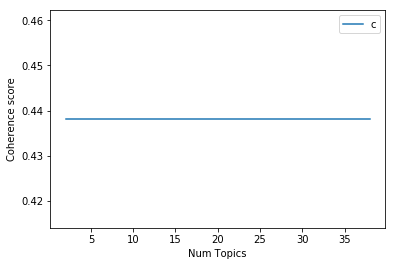

In [38]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [39]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

('Num Topics =', 2, ' has Coherence Value of', 0.4381)
('Num Topics =', 8, ' has Coherence Value of', 0.4381)
('Num Topics =', 14, ' has Coherence Value of', 0.4381)
('Num Topics =', 20, ' has Coherence Value of', 0.4381)
('Num Topics =', 26, ' has Coherence Value of', 0.4381)
('Num Topics =', 32, ' has Coherence Value of', 0.4381)
('Num Topics =', 38, ' has Coherence Value of', 0.4381)


### Finding the dominant topic in each document ###

To find what the topic is about in a given document and to find a topic number that has highest percentage of contribution in that document

In [45]:
def format_topics_sentences(ldamodel=lda_model, corpus=bow_corpus, texts=processed_statement):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=bow_corpus, texts=processed_statement)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,413.0,0.3712,"support, abort, hillari, includ, clinton, dema...","[say, anni, list, polit, group, support, trime..."
1,1,1227.0,0.7170,"start, administr, natur, presid, bush, coal, b...","[declin, coal, start, start, natur, take, star..."
2,2,49.0,0.1819,"georg, bush, crisi, go, offic, debt, trillion,...","[hillari, clinton, agre, john, mccain, vote, g..."
3,3,76.0,0.2037,"health, care, governor, say, year, reform, spe...","[health, care, reform, legisl, like, mandat, f..."
4,4,1080.0,0.2502,"term, indic, illeg, cross, number, immigr, few...","[econom, turnaround, start, term]"
5,5,1148.0,0.2338,"bear, year, percent, increas, dramat, time, sp...","[chicago, bear, start, quarterback, year, tota..."
6,6,186.0,0.4001,"district, school, say, chines, texa, year, bon...","[dunnam, live, district, repres, year]"
7,7,1224.0,0.1980,"mandat, say, vote, feingold, russ, super, dont...","[person, stage, work, activ, year, pass, russ,..."
8,8,121.0,0.2223,"oregon, legislatur, say, author, simpli, milli...","[take, million, oregon, lotteri, fund, port, n..."
9,9,1421.0,0.2857,"primari, say, vote, republican, report, percen...","[say, primari, oppon, glenn, grothman, leibham..."


In [44]:
print df_dominant_topic.count()

Document_No           10269
Dominant_Topic        10233
Topic_Perc_Contrib    10233
Keywords              10233
Text                  10269
dtype: int64


In [46]:
import pandas
import csv

header = ['Topic_Perc_Contrib', 'Text']
df_dominant_topic.to_csv('output.csv', columns = header )

In [25]:

#Build a Topic model using Gensim’s LDA, calculated weight of each document as a score, printed value in terms of polynomial function and visualized the topics using pyLDAvis. Determined how to choose the optimal model for number number of topics to choose. Finally I aggregated and presented the results to generate insights that are actionable.

In [26]:
### Further Steps ###

#Need to combine LDA and topic modeling score with rest of the factors applied by other team members to calculate final weight of other factors towards overall score

In [27]:
test_news = pd.read_csv('test.tsv', delimiter = '\t', quoting = 3, header=None)
test_news.columns = ["id", "label", "statement", "subject", "speaker", "speaker_title", "State", "party_affiliation", "barely_true", "false", "half_true", "mostly_true", "pants_on_fire","context"]
#dataset_train.head(5)
#print test_news['statement'][:5]

In [28]:


from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

countV = CountVectorizer()
train_count = countV.fit_transform(document_news['statement'].values)
y_train = dataset_train['label']

test_count =  countV.transform(test_news['statement'].values)
y_test = test_news['label']

tfidfV = TfidfVectorizer()
train_tfidf = tfidfV.fit_transform(document_news['statement'].values)
test_tfidf =  tfidfV.transform(test_news['statement'].values)


In [29]:
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import  LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.cross_validation import KFold
from sklearn.metrics import confusion_matrix, f1_score, classification_report
#from sklearn.cross_validation import GridSearchCV
#from sklearn.cross_validation import learning_curve
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

#string to test
doc_new = ['obama is running for president in 2016']

In [30]:
import itertools
import matplotlib.pyplot as plt
%matplotlib inline

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Naive Bayes Classifier ###


In [31]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix

clf = MultinomialNB() 
clf.fit(train_tfidf, y_train)
pred = clf.predict(test_tfidf)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
#cm = confusion_matrix(y_test, pred, labels=['FAKE', 'REAL'])
#plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])


accuracy:   0.242


### Logistic regression classifier ###

In [32]:
log_clf = LogisticRegression() 
log_clf.fit(train_tfidf, y_train)
pred = log_clf.predict(test_tfidf)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)


accuracy:   0.249


### Linear SVM classfier ###


In [33]:
svm_clf = svm.LinearSVC() 
svm_clf.fit(train_tfidf, y_train)
pred = svm_clf.predict(test_tfidf)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

accuracy:   0.245


### Passive Aggressive Classifier ###

In [34]:
from sklearn.linear_model import PassiveAggressiveClassifier

pa_clf = PassiveAggressiveClassifier(n_iter=50)
pa_clf.fit(train_tfidf, y_train)
pred = pa_clf.predict(test_tfidf)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

accuracy:   0.229


### Random forest classifier ###

In [35]:
rfc_clf = RandomForestClassifier()
rfc_clf.fit(train_tfidf, y_train)
pred = rfc_clf.predict(test_tfidf)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

accuracy:   0.220


In [61]:
#saving best model to the disk
#model_file = 'final_model.sav'
#pickle.dump(log_clf,open(model_file,'wb'))

In [ ]:
import pickle

#doc_new = ['obama is running for president in 2016']
var = input("Please enter the news text you want to verify: ")
print("You entered: " + str(var))
#function to run for prediction
def detecting_fake_news(var):    
#retrieving the best model for prediction call
    load_model = pickle.load(open('final_model.sav', 'rb'))
    prediction = load_model.predict([var])
    prob = load_model.predict_proba([var])
    print("The given statement is ",prediction[0])
    print("The truth probability score is ",prob[0][1])


if __name__ == '__main__':
    detecting_fake_news(var)

### Top 30 vectors in each of the label using tfidf vectorizer and the model with best accuracy logistic regression ###

In [39]:
def most_informative_feature_for_binary_classification(vectorizer, classifier, n=100):
    """
    See: https://stackoverflow.com/a/26980472
    
    Identify most important features if given a vectorizer and binary classifier. Set n to the number
    of weighted features you would like to show. (Note: current implementation merely prints and does not 
    return top classes.)
    """

    class_labels = classifier.classes_
    feature_names = vectorizer.get_feature_names()
    topn_class1 = sorted(zip(classifier.coef_[0], feature_names))[:n]
    topn_class2 = sorted(zip(classifier.coef_[0], feature_names))[-n:]

    for coef, feat in topn_class1:
        print(class_labels[0], coef, feat)

    print()

    for coef, feat in reversed(topn_class2):
        print(class_labels[1], coef, feat)
     
    print()
    
    for coef, feat in topn_class1:
        print(class_labels[2], coef, feat)
    
    print()
    
    for coef, feat in topn_class1:
        print(class_labels[3], coef, feat)
        
    print()
    
    for coef, feat in topn_class1:
        print(class_labels[4], coef, feat)

most_informative_feature_for_binary_classification(tfidfV, log_clf , n=30)

('barely-true', -1.7208295251144572, u'on')
('barely-true', -1.4001156929716647, u'60')
('barely-true', -1.3355361801970862, u'than')
('barely-true', -1.2109690932472672, u'ohio')
('barely-true', -1.1581465964772615, u'black')
('barely-true', -1.1462879740847616, u'only')
('barely-true', -1.1451650247112146, u'rates')
('barely-true', -1.141094242142306, u'close')
('barely-true', -1.1138770176398332, u'just')
('barely-true', -1.0997096796558488, u'record')
('barely-true', -1.091805451217784, u'had')
('barely-true', -1.0907856912985645, u'since')
('barely-true', -1.0275801370272326, u'primary')
('barely-true', -1.0209708345281876, u'more')
('barely-true', -0.9951184636930478, u'never')
('barely-true', -0.9849568059700278, u'every')
('barely-true', -0.981693508297117, u'80')
('barely-true', -0.9800637813164207, u'voters')
('barely-true', -0.9630601765209656, u'right')
('barely-true', -0.9629813682434956, u'increases')
('barely-true', -0.9354046567376026, u'14')
('barely-true', -0.91466430

### Conclusion ###

Model will classify the given test statements into 'True' or 'False' category and also estimates the probability of truth associated with it.